# **Problem Statement**

Incorporating alternative consumer data in Credit Risk Modeling.  
The success of this project aims to empower credit inclusion by using alternative data to predict the probability of default of underserved customers. Identifying key characteristics of default will help ensure that underserved customers who are capable of repayment will not be rejected.

In [2]:
!pip install pandas
import pandas as pd
import matplotlib.pyplot as plt
!pip install numpy
import numpy as np
!pip install seaborn
import seaborn as sns

!pip install skimpy
from skimpy import skim #summarizing dataframe
!pip install dython
from dython.nominal import associations #categorical correlation
from dython.nominal import identify_nominal_columns #categorical correlation

!pip install duckdb
import duckdb #sql on python

#!pip install plotly.express
import plotly.express as px

#!pip install scipy
from scipy.stats import skew #Checking skewness in the dataset


[notice] A new release of pip available: 22.3 -> 23.2.1
[notice] To update, run: pip install --upgrade pip

[notice] A new release of pip available: 22.3 -> 23.2.1
[notice] To update, run: pip install --upgrade pip

[notice] A new release of pip available: 22.3 -> 23.2.1
[notice] To update, run: pip install --upgrade pip

[notice] A new release of pip available: 22.3 -> 23.2.1
[notice] To update, run: pip install --upgrade pip

[notice] A new release of pip available: 22.3 -> 23.2.1
[notice] To update, run: pip install --upgrade pip

[notice] A new release of pip available: 22.3 -> 23.2.1
[notice] To update, run: pip install --upgrade pip


# Data Source

<img src="/Users/marianilagan/py_scripts/credit_risk_datamodel.png" style="height:500px" />

## Importing Data sets

In [3]:
#main table that contains information about the loan and loan applicant at the time of application
application_df = pd.read_csv('/Users/marianilagan/Desktop/home-credit-default-risk/application_train.csv')

In [4]:
#application data of client's previous loans in Home Credit
previous_df = pd.read_csv('/Users/marianilagan/Desktop/home-credit-default-risk/previous_application.csv')

In [5]:
#application data from previous loans that client got from other institutions and reported to credit bureau
bureau_df = pd.read_csv('/Users/marianilagan/Desktop/home-credit-default-risk/bureau.csv')

In [6]:
#monthly balance of credits in Credit Bureau
bureaubal_df = pd.read_csv('/Users/marianilagan/Desktop/home-credit-default-risk/bureau_balance.csv')

In [7]:
#Monthly balance snapshots of previous POS (point of sales) and cash loans that the applicant had with Home Credit
pos_df = pd.read_csv('/Users/marianilagan/Desktop/home-credit-default-risk/POS_CASH_balance.csv')

In [8]:
#Monthly balance snapshots of previous credit cards that the applicant has with Home Credit.
prev_cc_df = pd.read_csv('/Users/marianilagan/Desktop/home-credit-default-risk/credit_card_balance.csv')

In [9]:
#Past payment data for each installments of previous credits in Home Credits related to loans in the sample
installments_df = pd.read_csv('/Users/marianilagan/Desktop/home-credit-default-risk/installments_payments.csv')

In [10]:
#Checking number of rows and columns of the 7 tables
pd.DataFrame({'application_df': application_df.shape,
              'previous_df': previous_df.shape,
              'bureau_df': bureau_df.shape,
              'bureaubal_df': bureaubal_df.shape,
              'POS_df': pos_df.shape,
              'prev_cc_df': prev_cc_df.shape,
              'installments_df': installments_df.shape}, index = ["rows", "columns"])

,application_df,previous_df,bureau_df,bureaubal_df,POS_df,prev_cc_df,installments_df
rows,307511,1670214,1716428,27299925,10001358,3840312,13605401
columns,122,37,17,3,8,23,8


## Initial Data Preparation

### Checking duplicates and overlapping IDs

* There are no duplicate rows in each table.
* Not all SK_ID_CURR (clients) in the main table, application_df, exists in all tables.
* Assumptions:
    - SK_ID_CURR not in bureau files have no credit history yet.
    - SK_ID_CURR not in previous_df, pos_df, prev_cc_df, installments_df are new clients to Home Credit.

In [11]:
#Checking duplicated rows per table: There are no duplicate rows
duplicated_app = application_df[application_df.duplicated()]
duplicated_prev = previous_df[previous_df.duplicated()]
duplicated_bureau = bureau_df[bureau_df.duplicated()]
duplicated_bureaubal = bureaubal_df[bureaubal_df.duplicated()]
duplicated_pos = pos_df[pos_df.duplicated()]
duplicated_prevcc = prev_cc_df[prev_cc_df.duplicated()]
duplicated_install = installments_df[installments_df.duplicated()]

print("Duplicate Rows in application_df:", len(duplicated_app.index))
print("Duplicate Rows in previous_df:", len(duplicated_prev.index))
print("Duplicate Rows in bureau_df:", len(duplicated_bureau.index))
print("Duplicate Rows in bureaubal_df:", len(duplicated_bureaubal.index))
print("Duplicate Rows in pos_df:", len(duplicated_pos.index))
print("Duplicate Rows in prev_cc_df:", len(duplicated_prevcc.index))
print("Duplicate Rows in installment_df:", len(duplicated_install.index))

Duplicate Rows in application_df: 0
Duplicate Rows in previous_df: 0
Duplicate Rows in bureau_df: 0
Duplicate Rows in bureaubal_df: 0
Duplicate Rows in pos_df: 0
Duplicate Rows in prev_cc_df: 0
Duplicate Rows in installment_df: 0


In [12]:
#Checking number of IDs for each table that is the same with the IDs in application_df:
x = application_df['SK_ID_CURR'].unique().tolist()
y = previous_df['SK_ID_CURR'].unique().tolist()
common_elements = np.intersect1d(x, y)
print('Number of overlapping SK_ID_CURR of application_df and previous_df:', len(np.unique(common_elements)))

y = bureau_df['SK_ID_CURR'].unique().tolist()
common_elements = np.intersect1d(x, y)
print('Number of overlapping SK_ID_CURR of application_df and bureau_df:', len(np.unique(common_elements)))

#y = bureaubal_df['SK_ID_CURR'].unique().tolist()
#common_elements = np.intersect1d(x, y)
#print('Number of overlapping SK_ID_CURR of application_df and bureaubal_df:', len(np.unique(common_elements)))

y = pos_df['SK_ID_CURR'].unique().tolist()
common_elements = np.intersect1d(x, y)
print('Number of overlapping SK_ID_CURR of application_df and pos_df:', len(np.unique(common_elements)))

y = prev_cc_df['SK_ID_CURR'].unique().tolist()
common_elements = np.intersect1d(x, y)
print('Number of overlapping SK_ID_CURR of application_df and prev_cc_df:', len(np.unique(common_elements)))

y = installments_df['SK_ID_CURR'].unique().tolist()
common_elements = np.intersect1d(x, y)
print('Number of overlapping SK_ID_CURR of application_df and installments_df:', len(np.unique(common_elements)))

Number of overlapping SK_ID_CURR of application_df and previous_df: 291057
Number of overlapping SK_ID_CURR of application_df and bureau_df: 263491
Number of overlapping SK_ID_CURR of application_df and pos_df: 289444
Number of overlapping SK_ID_CURR of application_df and prev_cc_df: 86905
Number of overlapping SK_ID_CURR of application_df and installments_df: 291643


### Sorting time based data

In [13]:
installments_df = installments_df.sort_values(by = ['SK_ID_CURR','SK_ID_PREV','NUM_INSTALMENT_NUMBER'], ascending = True)
prev_cc_df = prev_cc_df.sort_values(by = ['SK_ID_PREV','MONTHS_BALANCE'], ascending = [1,0])
pos_df = pos_df.sort_values(by = ['SK_ID_PREV','MONTHS_BALANCE'], ascending = [1,0])

### Identifying columns from supporting tables

> Bureau_df

In [14]:
#Checking unique data types for bureau_df
dtypes = bureau_df.dtypes.unique()

for i in range(0,len(dtypes)):
    sel_cols = list(bureau_df.select_dtypes(include=dtypes[i]))
    print('bureau_df - ',{dtypes[i]}, '- Number of columns are' , len(sel_cols),':')
    print(sel_cols)
    print("_"*50)

bureau_df -  {dtype('int64')} - Number of columns are 6 :
['SK_ID_CURR', 'SK_ID_BUREAU', 'DAYS_CREDIT', 'CREDIT_DAY_OVERDUE', 'CNT_CREDIT_PROLONG', 'DAYS_CREDIT_UPDATE']
__________________________________________________
bureau_df -  {dtype('O')} - Number of columns are 3 :
['CREDIT_ACTIVE', 'CREDIT_CURRENCY', 'CREDIT_TYPE']
__________________________________________________
bureau_df -  {dtype('float64')} - Number of columns are 8 :
['DAYS_CREDIT_ENDDATE', 'DAYS_ENDDATE_FACT', 'AMT_CREDIT_MAX_OVERDUE', 'AMT_CREDIT_SUM', 'AMT_CREDIT_SUM_DEBT', 'AMT_CREDIT_SUM_LIMIT', 'AMT_CREDIT_SUM_OVERDUE', 'AMT_ANNUITY']
__________________________________________________


In [15]:
#One SK_ID_CURR (current client) can have multiple rows in bureau_df
bureau_df[(bureau_df['SK_ID_CURR'] == 246829) & (bureau_df['CREDIT_ACTIVE'] == 'Active')]

,SK_ID_CURR,SK_ID_BUREAU,CREDIT_ACTIVE,CREDIT_CURRENCY,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,CREDIT_TYPE,DAYS_CREDIT_UPDATE,AMT_ANNUITY
272942,246829,5057771,Active,currency 1,-72,0,1032.0,NaN,NaN,0,67500.0,19368.000,0.0,0.0,Credit card,-9,NaN
272954,246829,5057789,Active,currency 1,-346,0,1481.0,NaN,NaN,0,67500.0,29254.500,NaN,0.0,Credit card,-16,NaN
272955,246829,5057790,Active,currency 1,-114,0,NaN,NaN,NaN,0,22500.0,23341.500,NaN,0.0,Microloan,-11,NaN
272956,246829,5057791,Active,currency 1,-157,0,31128.0,NaN,NaN,0,45360.0,39519.000,NaN,0.0,Credit card,-15,NaN
272957,246829,5057792,Active,currency 1,-226,0,NaN,NaN,NaN,0,31500.0,27135.000,NaN,0.0,Microloan,-3,NaN
272960,246829,5057795,Active,currency 1,-651,0,444.0,NaN,683.955,0,45000.0,15198.525,0.0,0.0,Consumer credit,-10,NaN
1710172,246829,5057788,Active,currency 1,-147,0,218.0,NaN,NaN,0,47925.0,35775.000,NaN,0.0,Consumer credit,-18,NaN
1710173,246829,5057796,Active,currency 1,-568,0,528.0,NaN,1226.655,0,64926.0,47826.000,0.0,0.0,Consumer credit,-19,NaN


> Bureaubal_df (bureau balance)

In [16]:
#bureau balance table only contains MONTHS_BALANCE and STATUS
bureaubal_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 27299925 entries, 0 to 27299924
Data columns (total 3 columns):
 #   Column          Dtype 
---  ------          ----- 
 0   SK_ID_BUREAU    int64 
 1   MONTHS_BALANCE  int64 
 2   STATUS          object
dtypes: int64(2), object(1)
memory usage: 624.8+ MB


In [17]:
#Will use count of C to check the number of months the loan has already closed before the application.
#Will also create a column to check number of months there was delay in payment (5, 4, 3,2,1)
bureaubal_df[bureaubal_df['SK_ID_BUREAU'] == 5230570].tail(60)

,SK_ID_BUREAU,MONTHS_BALANCE,STATUS
29320,5230570,-32,C
29321,5230570,-33,C
29322,5230570,-34,C
29323,5230570,-35,C
29324,5230570,-36,C
29325,5230570,-37,C
29326,5230570,-38,C
29327,5230570,-39,C
29328,5230570,-40,C
29329,5230570,-41,C


In [18]:
#Checking latest status of each SK_ID_BUREAU
duckdb.query("SELECT c.SK_ID_BUREAU, max(c.MONTHS_BALANCE), c.STATUS FROM bureaubal_df c, bureau_df b WHERE c.SK_ID_BUREAU = b.SK_ID_BUREAU GROUP BY 1,3").df()

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

,SK_ID_BUREAU,max(c.MONTHS_BALANCE),STATUS
0,6304747,-57,0
1,6304751,-16,0
2,6304768,-40,0
3,6307969,-26,1
4,6307977,0,C
...,...,...,...
1631093,5409135,-51,1
1631094,5917965,-46,X
1631095,5658985,0,C
1631096,5658981,0,X


> POS_df (POS_CASH_balance)

In [19]:
#Checking unique data types for pos_df
dtypes = pos_df.dtypes.unique()

for i in range(0,len(dtypes)):
    sel_cols = list(pos_df.select_dtypes(include=dtypes[i]))
    print('pos_df - ',{dtypes[i]}, '- Number of columns are' , len(sel_cols),':')
    print(sel_cols)
    print("_"*50)

pos_df -  {dtype('int64')} - Number of columns are 5 :
['SK_ID_PREV', 'SK_ID_CURR', 'MONTHS_BALANCE', 'SK_DPD', 'SK_DPD_DEF']
__________________________________________________
pos_df -  {dtype('float64')} - Number of columns are 2 :
['CNT_INSTALMENT', 'CNT_INSTALMENT_FUTURE']
__________________________________________________
pos_df -  {dtype('O')} - Number of columns are 1 :
['NAME_CONTRACT_STATUS']
__________________________________________________


In [20]:
#Sampled checking SK_ID_CURR 426454, there are multiple active contracts
pos_df[pos_df['SK_ID_CURR'] == 426454]

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,CNT_INSTALMENT,CNT_INSTALMENT_FUTURE,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
1080895,1108287,426454,-20,5.0,0.0,Completed,0,0
4972224,1108287,426454,-21,6.0,2.0,Active,0,0
2295256,1108287,426454,-22,6.0,3.0,Active,0,0
1508567,1108287,426454,-23,6.0,4.0,Active,0,0
3578449,1108287,426454,-24,6.0,5.0,Active,0,0
6462586,1108287,426454,-25,6.0,6.0,Active,0,0
3148960,1837321,426454,-49,6.0,0.0,Completed,0,0
4121173,1837321,426454,-50,6.0,1.0,Active,0,0
2773371,1837321,426454,-51,6.0,2.0,Active,0,0
3656184,1837321,426454,-52,6.0,3.0,Active,0,0


> prev_cc_df (credit_card_balance)

In [21]:
#Checking unique data types for prev_cc_df
dtypes = prev_cc_df.dtypes.unique()

for i in range(0,len(dtypes)):
    sel_cols = list(prev_cc_df.select_dtypes(include=dtypes[i]))
    print('prev_cc_df - ',{dtypes[i]}, '- Number of columns are' , len(sel_cols),':')
    print(sel_cols)
    print("_"*50)

prev_cc_df -  {dtype('int64')} - Number of columns are 7 :
['SK_ID_PREV', 'SK_ID_CURR', 'MONTHS_BALANCE', 'AMT_CREDIT_LIMIT_ACTUAL', 'CNT_DRAWINGS_CURRENT', 'SK_DPD', 'SK_DPD_DEF']
__________________________________________________
prev_cc_df -  {dtype('float64')} - Number of columns are 15 :
['AMT_BALANCE', 'AMT_DRAWINGS_ATM_CURRENT', 'AMT_DRAWINGS_CURRENT', 'AMT_DRAWINGS_OTHER_CURRENT', 'AMT_DRAWINGS_POS_CURRENT', 'AMT_INST_MIN_REGULARITY', 'AMT_PAYMENT_CURRENT', 'AMT_PAYMENT_TOTAL_CURRENT', 'AMT_RECEIVABLE_PRINCIPAL', 'AMT_RECIVABLE', 'AMT_TOTAL_RECEIVABLE', 'CNT_DRAWINGS_ATM_CURRENT', 'CNT_DRAWINGS_OTHER_CURRENT', 'CNT_DRAWINGS_POS_CURRENT', 'CNT_INSTALMENT_MATURE_CUM']
__________________________________________________
prev_cc_df -  {dtype('O')} - Number of columns are 1 :
['NAME_CONTRACT_STATUS']
__________________________________________________


> installments_df

In [22]:
#Checking unique data types for installments_df
dtypes = installments_df.dtypes.unique()

for i in range(0,len(dtypes)):
    sel_cols = list(installments_df.select_dtypes(include=dtypes[i]))
    print('installments_df - ',{dtypes[i]}, '- Number of columns are' , len(sel_cols),':')
    print(sel_cols)
    print("_"*50)

installments_df -  {dtype('int64')} - Number of columns are 3 :
['SK_ID_PREV', 'SK_ID_CURR', 'NUM_INSTALMENT_NUMBER']
__________________________________________________
installments_df -  {dtype('float64')} - Number of columns are 5 :
['NUM_INSTALMENT_VERSION', 'DAYS_INSTALMENT', 'DAYS_ENTRY_PAYMENT', 'AMT_INSTALMENT', 'AMT_PAYMENT']
__________________________________________________


> previous_df (previous_application)

In [23]:
#Checking unique data types for previous_df
dtypes = previous_df.dtypes.unique()

for i in range(0,len(dtypes)):
    sel_cols = list(previous_df.select_dtypes(include=dtypes[i]))
    print('previous_df - ',{dtypes[i]}, '- Number of columns are' , len(sel_cols),':')
    print(sel_cols)
    print("_"*50)

previous_df -  {dtype('int64')} - Number of columns are 6 :
['SK_ID_PREV', 'SK_ID_CURR', 'HOUR_APPR_PROCESS_START', 'NFLAG_LAST_APPL_IN_DAY', 'DAYS_DECISION', 'SELLERPLACE_AREA']
__________________________________________________
previous_df -  {dtype('O')} - Number of columns are 16 :
['NAME_CONTRACT_TYPE', 'WEEKDAY_APPR_PROCESS_START', 'FLAG_LAST_APPL_PER_CONTRACT', 'NAME_CASH_LOAN_PURPOSE', 'NAME_CONTRACT_STATUS', 'NAME_PAYMENT_TYPE', 'CODE_REJECT_REASON', 'NAME_TYPE_SUITE', 'NAME_CLIENT_TYPE', 'NAME_GOODS_CATEGORY', 'NAME_PORTFOLIO', 'NAME_PRODUCT_TYPE', 'CHANNEL_TYPE', 'NAME_SELLER_INDUSTRY', 'NAME_YIELD_GROUP', 'PRODUCT_COMBINATION']
__________________________________________________
previous_df -  {dtype('float64')} - Number of columns are 15 :
['AMT_ANNUITY', 'AMT_APPLICATION', 'AMT_CREDIT', 'AMT_DOWN_PAYMENT', 'AMT_GOODS_PRICE', 'RATE_DOWN_PAYMENT', 'RATE_INTEREST_PRIMARY', 'RATE_INTEREST_PRIVILEGED', 'CNT_PAYMENT', 'DAYS_FIRST_DRAWING', 'DAYS_FIRST_DUE', 'DAYS_LAST_DUE_1ST_VE

In [24]:
#SK_ID_CURR can have multiple SK_ID_PREV that is related to either POS_CASH, installments, or credit card table, depending on NAME_CONTRACT_TYPE
previous_df.groupby('SK_ID_CURR').head(20)

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,...,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,2030495,271877,Consumer loans,1730.430,17145.0,17145.0,0.0,17145.0,SATURDAY,15,...,Connectivity,12.0,middle,POS mobile with interest,365243.0,-42.0,300.0,-42.0,-37.0,0.0
1,2802425,108129,Cash loans,25188.615,607500.0,679671.0,NaN,607500.0,THURSDAY,11,...,XNA,36.0,low_action,Cash X-Sell: low,365243.0,-134.0,916.0,365243.0,365243.0,1.0
2,2523466,122040,Cash loans,15060.735,112500.0,136444.5,NaN,112500.0,TUESDAY,11,...,XNA,12.0,high,Cash X-Sell: high,365243.0,-271.0,59.0,365243.0,365243.0,1.0
3,2819243,176158,Cash loans,47041.335,450000.0,470790.0,NaN,450000.0,MONDAY,7,...,XNA,12.0,middle,Cash X-Sell: middle,365243.0,-482.0,-152.0,-182.0,-177.0,1.0
4,1784265,202054,Cash loans,31924.395,337500.0,404055.0,NaN,337500.0,THURSDAY,9,...,XNA,24.0,high,Cash Street: high,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1670209,2300464,352015,Consumer loans,14704.290,267295.5,311400.0,0.0,267295.5,WEDNESDAY,12,...,Furniture,30.0,low_normal,POS industry with interest,365243.0,-508.0,362.0,-358.0,-351.0,0.0
1670210,2357031,334635,Consumer loans,6622.020,87750.0,64291.5,29250.0,87750.0,TUESDAY,15,...,Furniture,12.0,middle,POS industry with interest,365243.0,-1604.0,-1274.0,-1304.0,-1297.0,0.0
1670211,2659632,249544,Consumer loans,11520.855,105237.0,102523.5,10525.5,105237.0,MONDAY,12,...,Consumer electronics,10.0,low_normal,POS household with interest,365243.0,-1457.0,-1187.0,-1187.0,-1181.0,0.0
1670212,2785582,400317,Cash loans,18821.520,180000.0,191880.0,NaN,180000.0,WEDNESDAY,9,...,XNA,12.0,low_normal,Cash X-Sell: low,365243.0,-1155.0,-825.0,-825.0,-817.0,1.0


### Preparing aggregated tables for feature creation

> bureau data

In [25]:
bureau_df_cleaned = bureau_df.copy()

In [26]:
MAX_STATUS = duckdb.query("""SELECT a.SK_ID_BUREAU, c.SK_ID_CURR, b.MMB, a.STATUS AS CB_MAX_STATUS
                FROM bureaubal_df a INNER JOIN
                (SELECT SK_ID_BUREAU, max(MONTHS_BALANCE) MMB
                        from bureaubal_df
                        GROUP BY SK_ID_BUREAU) b
                ON a.SK_ID_BUREAU = b.SK_ID_BUREAU
                INNER JOIN
                bureau_df c
                ON b.SK_ID_BUREAU = c.SK_ID_BUREAU
                WHERE a.MONTHS_BALANCE = b.MMB
                """).df()
MAX_STATUS

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

,SK_ID_BUREAU,SK_ID_CURR,MMB,CB_MAX_STATUS
0,5841162,165733,0,X
1,5841177,212518,0,C
2,5841181,212518,0,0
3,5841272,223289,-23,C
4,5841273,223289,-23,C
...,...,...,...,...
774349,5408538,224462,-10,X
774350,5408703,243534,0,C
774351,5408704,243534,-22,0
774352,5408915,207204,-6,C


In [27]:
#Creating tables for each status of each SK_ID_BUREAU
#Number of times a loan has a DPD of 120+ days or sold or written off
CB_MONTHS_5 = duckdb.query("""SELECT c.SK_ID_BUREAU, b.SK_ID_CURR, count(c.STATUS) as CB_MONTHS_5
                            FROM bureaubal_df c, bureau_df b 
                            WHERE c.SK_ID_BUREAU = b.SK_ID_BUREAU 
                            AND c.STATUS = '5'
                            GROUP BY 1,2""").df()

#Number of times a loan has a DPD of 91-120 days
CB_MONTHS_4 = duckdb.query("""SELECT c.SK_ID_BUREAU, b.SK_ID_CURR, count(c.STATUS) as CB_MONTHS_4
                            FROM bureaubal_df c, bureau_df b 
                            WHERE c.SK_ID_BUREAU = b.SK_ID_BUREAU 
                            AND c.STATUS = '4'
                            GROUP BY 1,2""").df()

#Number of times a loan has a DPD of 61-90 days
CB_MONTHS_3 = duckdb.query("""SELECT c.SK_ID_BUREAU, b.SK_ID_CURR, count(c.STATUS) as CB_MONTHS_3
                            FROM bureaubal_df c, bureau_df b 
                            WHERE c.SK_ID_BUREAU = b.SK_ID_BUREAU 
                            AND c.STATUS = '3'
                            GROUP BY 1,2""").df()

#Number of times a loan has a DPD of 31-60 days
CB_MONTHS_2 = duckdb.query("""SELECT c.SK_ID_BUREAU, b.SK_ID_CURR, count(c.STATUS) as CB_MONTHS_2
                            FROM bureaubal_df c, bureau_df b 
                            WHERE c.SK_ID_BUREAU = b.SK_ID_BUREAU 
                            AND c.STATUS = '2'
                            GROUP BY 1,2""").df()

#Number of times a loan has a DPD between 1-30 days
CB_MONTHS_1 = duckdb.query("""SELECT c.SK_ID_BUREAU, b.SK_ID_CURR, count(c.STATUS) as CB_MONTHS_1
                            FROM bureaubal_df c, bureau_df b 
                            WHERE c.SK_ID_BUREAU = b.SK_ID_BUREAU 
                            AND c.STATUS = '1'
                            GROUP BY 1,2""").df()

#Number of times a loan was paid on time
CB_MONTHS_0 = duckdb.query("""SELECT c.SK_ID_BUREAU, b.SK_ID_CURR, count(c.STATUS) as CB_MONTHS_0
                            FROM bureaubal_df c, bureau_df b 
                            WHERE c.SK_ID_BUREAU = b.SK_ID_BUREAU 
                            AND c.STATUS = '0'
                            GROUP BY 1,2""").df()

In [28]:
#merge new columns to a single dataframe
CB_df = pd.merge(CB_MONTHS_1, CB_MONTHS_0, on="SK_ID_BUREAU", how="outer").drop(columns = 'SK_ID_CURR_y')
CB_df = pd.merge(CB_df, CB_MONTHS_2, on="SK_ID_BUREAU", how="outer").drop(columns = 'SK_ID_CURR')
CB_df = pd.merge(CB_df, CB_MONTHS_3, on="SK_ID_BUREAU", how="outer").drop(columns = 'SK_ID_CURR')
CB_df = pd.merge(CB_df, CB_MONTHS_4, on="SK_ID_BUREAU", how="outer").drop(columns = 'SK_ID_CURR')
CB_df = pd.merge(CB_df, CB_MONTHS_5, on="SK_ID_BUREAU", how="outer").drop(columns = 'SK_ID_CURR')
CB_df = pd.merge(CB_df, MAX_STATUS, on="SK_ID_BUREAU", how="outer").drop(columns = 'SK_ID_CURR')

#impute NaN with zeros for the new columns
CB_df = CB_df.fillna(0)

#merge with bureau_df_cleaned, will not include those not existing in bureaubal
bureau_df_cleaned = pd.merge(bureau_df_cleaned, CB_df, on="SK_ID_BUREAU", how="inner").drop(columns='SK_ID_CURR_x')

In [29]:
#Bad data: Active but has negative days_credit_enddate which means that remaining credit days happened before the current application.
bureau_df_cleaned[(bureau_df_cleaned['CREDIT_ACTIVE'] == 'Active') & (bureau_df_cleaned['DAYS_CREDIT_ENDDATE'] < 0)]

,SK_ID_CURR,SK_ID_BUREAU,CREDIT_ACTIVE,CREDIT_CURRENCY,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,...,DAYS_CREDIT_UPDATE,AMT_ANNUITY,CB_MONTHS_1,CB_MONTHS_0,CB_MONTHS_2,CB_MONTHS_3,CB_MONTHS_4,CB_MONTHS_5,MMB,CB_MAX_STATUS
15,275240,5715471,Active,currency 1,-2467,0,-2099.0,NaN,NaN,0,...,-1159,NaN,0.0,12.0,0.0,0.0,0.0,0.0,-60,C
136,221655,5715833,Active,currency 1,-1260,0,-556.0,NaN,NaN,0,...,-7,0.0,0.0,11.0,0.0,0.0,0.0,0.0,-4,C
168,246557,5715884,Active,currency 1,-1193,0,-495.0,NaN,NaN,0,...,-151,NaN,0.0,4.0,0.0,0.0,0.0,0.0,-17,C
190,167780,5717328,Active,currency 1,-2701,0,-1965.0,NaN,NaN,0,...,-1043,6120.0,0.0,5.0,0.0,0.0,0.0,0.0,-84,0
224,400009,5717363,Active,currency 1,-2776,0,-2532.0,NaN,NaN,0,...,-556,NaN,0.0,8.0,0.0,0.0,0.0,0.0,-42,C
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
774258,163632,5053308,Active,currency 1,-1118,0,-753.0,NaN,NaN,0,...,-425,0.0,0.0,11.0,0.0,0.0,0.0,0.0,0,C
774272,157851,5054735,Active,currency 1,-2380,0,-1650.0,NaN,NaN,0,...,-473,NaN,0.0,7.0,0.0,0.0,0.0,0.0,0,X
774299,183822,5045700,Active,currency 1,-1484,0,-53.0,NaN,NaN,0,...,-40,NaN,0.0,6.0,0.0,0.0,0.0,0.0,0,C
774329,391091,5053479,Active,currency 1,-2361,0,-1247.0,NaN,NaN,0,...,-1025,NaN,0.0,13.0,0.0,0.0,0.0,0.0,-62,C


In [30]:
#removing those that are active but has negative days_credit_enddate which means that remaining credit days happened before the current application.
bureau_df_cleaned = bureau_df_cleaned.drop(bureau_df_cleaned[(bureau_df_cleaned['CREDIT_ACTIVE'] == 'Active') & (bureau_df_cleaned['DAYS_CREDIT_ENDDATE'] < 0)].index)
bureau_df_cleaned

,SK_ID_CURR,SK_ID_BUREAU,CREDIT_ACTIVE,CREDIT_CURRENCY,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,...,DAYS_CREDIT_UPDATE,AMT_ANNUITY,CB_MONTHS_1,CB_MONTHS_0,CB_MONTHS_2,CB_MONTHS_3,CB_MONTHS_4,CB_MONTHS_5,MMB,CB_MAX_STATUS
0,380361,5715448,Active,currency 1,-820,0,31069.0,NaN,NaN,0,...,-183,0.0,0.0,8.0,0.0,0.0,0.0,0.0,0,C
1,380361,5715449,Active,currency 1,-357,0,1119.0,NaN,NaN,0,...,-130,2691.0,0.0,5.0,0.0,0.0,0.0,0.0,0,C
2,380361,5715451,Closed,currency 1,-917,0,-187.0,-759.0,NaN,0,...,-748,0.0,0.0,17.0,0.0,0.0,0.0,0.0,-5,C
3,380361,5715452,Closed,currency 1,-993,0,31039.0,-831.0,NaN,0,...,-818,0.0,0.0,8.0,0.0,0.0,0.0,0.0,0,C
4,380361,5715453,Closed,currency 1,-1146,0,681.0,-780.0,NaN,0,...,-769,0.0,0.0,8.0,0.0,0.0,0.0,0.0,0,C
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
774349,229054,5053730,Active,currency 1,-456,0,1372.0,NaN,0.0,0,...,-3,NaN,0.0,11.0,0.0,0.0,0.0,0.0,0,C
774350,254479,5053734,Active,currency 1,-1571,0,986.0,NaN,NaN,0,...,-2,NaN,0.0,7.0,0.0,0.0,0.0,0.0,0,C
774351,363575,5053740,Closed,currency 1,-1234,0,-503.0,-502.0,NaN,0,...,-461,58554.0,0.0,0.0,0.0,0.0,0.0,0.0,0,C
774352,245498,5053747,Closed,currency 1,-2582,0,-2214.0,-2018.0,0.0,0,...,-2017,12600.0,0.0,18.0,0.0,0.0,0.0,0.0,0,C


In [31]:
#Creating columns based on bureau_df_cleaned
CBA_df = duckdb.query("""SELECT b.SK_ID_CURR, b.CNT_TOTAL AS CB_TOTAL_LOANS,
            a.CNT_ACTIVE_LOANS/b.CNT_TOTAL AS CB_PCT_ACTIVE_LOANS, b.CB_TOTAL_CNT_CREDIT_PROLONG, b.CB_MIN_DAYS_CREDIT,
            CB_AVG_DAYS_CREDIT_ENDDATE, CB_AMT_CREDIT_SUM_OVERDUE, CB_AMT_CREDIT_SUM_DEBT / CB_AMT_CREDIT_SUM AS CB_PCT_DEBT, 
            CB_AMT_CREDIT_SUM_DEBT
            FROM (SELECT SK_ID_CURR, count(distinct SK_ID_BUREAU) CNT_ACTIVE_LOANS,
            avg(DAYS_CREDIT_ENDDATE) as CB_AVG_DAYS_CREDIT_ENDDATE,
                sum(AMT_CREDIT_SUM_OVERDUE) CB_AMT_CREDIT_SUM_OVERDUE,
                sum(AMT_CREDIT_SUM_DEBT) AS CB_AMT_CREDIT_SUM_DEBT,
                sum(AMT_CREDIT_SUM) CB_AMT_CREDIT_SUM
                            FROM bureau_df_cleaned
                            WHERE CREDIT_ACTIVE = 'Active'
                            GROUP BY 1) a RIGHT JOIN
            (SELECT SK_ID_CURR, count(distinct SK_ID_BUREAU) CNT_TOTAL, MIN(DAYS_CREDIT) CB_MIN_DAYS_CREDIT,
            SUM(CNT_CREDIT_PROLONG) CB_TOTAL_CNT_CREDIT_PROLONG
                            FROM bureau_df_cleaned
                            GROUP BY 1) b
            ON a.SK_ID_CURR = b.SK_ID_CURR""").df()

CBC_df = duckdb.query("""SELECT SK_ID_CURR, avg(DAYS_ENDDATE_FACT) as CB_AVG_DAYS_ENDDATE_FACT
                            FROM bureau_df_cleaned
                            WHERE CREDIT_ACTIVE = 'Closed'
                            GROUP BY 1""").df()

#Status in CB
CBD_df = duckdb.query("""SELECT SK_ID_CURR,avg(CB_MONTHS_0) CB_MONTHS_0_AVG,
                avg(CB_MONTHS_1) CB_MONTHS_1_AVG, avg(CB_MONTHS_2) CB_MONTHS_2_AVG,
                avg(CB_MONTHS_3) CB_MONTHS_3_AVG, avg(CB_MONTHS_4) CB_MONTHS_4_AVG,
                avg(CB_MONTHS_5) CB_MONTHS_5_AVG
                            FROM bureau_df_cleaned
                            GROUP BY 1""").df()

In [32]:
#Number of secured loans per customer
SEC_LOAN = duckdb.query("""SELECT SK_ID_CURR, count(distinct SK_ID_BUREAU) AS CB_SEC_LOAN
            FROM bureau_df_cleaned
            WHERE CREDIT_TYPE in ('Mortgage', 'Car loan', 'Real estate loan', 'Loan for the purchase of equipment', 'Loan for purchase of shares (margin lending)')
            GROUP BY 1""").df()

In [33]:
#Number of unsecured loans per customer
UNSEC_LOAN = duckdb.query("""SELECT SK_ID_CURR, count(distinct SK_ID_BUREAU) AS CB_UNSEC_LOAN
            FROM bureau_df_cleaned
            WHERE CREDIT_TYPE in ('Consumer credit', 'Credit card','Microloan', 'Loan for working capital replenishment',
                'Loan for business development','Unknown type of loan', 'Another type of loan', 'Cash loan (non-earmarked)',
                'Mobile operator loan', 'Interbank credit')
            GROUP BY 1""").df()

> Merged_df will be merged to application_df as new columns

In [34]:
#Merge new columns to a single dataframe and impute blank with 0
merged_df = pd.merge(CBA_df,CBC_df, on="SK_ID_CURR", how="outer").fillna(0)
#merged_df = pd.merge(merged_df,CBB_df, on="SK_ID_CURR", how="outer").fillna(0) - will not include bad debt since only 3 rows
merged_df = pd.merge(merged_df,CBD_df, on="SK_ID_CURR", how="outer")
merged_df = pd.merge(merged_df,SEC_LOAN, on="SK_ID_CURR", how="outer").fillna(0)
merged_df = pd.merge(merged_df,UNSEC_LOAN, on="SK_ID_CURR", how="outer").fillna(0)

#rearraging columns
new_cols = ['SK_ID_CURR','CB_TOTAL_LOANS', 'CB_PCT_ACTIVE_LOANS', 'CB_SEC_LOAN', 'CB_UNSEC_LOAN',
       'CB_MIN_DAYS_CREDIT', 'CB_AVG_DAYS_CREDIT_ENDDATE', 'CB_AVG_DAYS_ENDDATE_FACT', 'CB_TOTAL_CNT_CREDIT_PROLONG', 
       'CB_AMT_CREDIT_SUM_OVERDUE', 'CB_PCT_DEBT', 'CB_AMT_CREDIT_SUM_DEBT', 'CB_MONTHS_0_AVG', 'CB_MONTHS_1_AVG', 'CB_MONTHS_2_AVG',
       'CB_MONTHS_3_AVG', 'CB_MONTHS_4_AVG', 'CB_MONTHS_5_AVG']
merged_df = merged_df.reindex(columns=new_cols)

> Join data from pre_cc_df, pos_df, and installments_df to previous_df

##### prev_cc_df

In [35]:
prev_cc_df_cleaned = prev_cc_df.copy()

In [36]:
#AMT_DRAWINGS_CURRENT = AMT_DRAWINGS_ATM_CURRENT + AMT_DRAWINGS_OTHER_CURRENT + AMT_DRAWINGS_POS_CURRENT
prev_cc_df_cleaned[(prev_cc_df_cleaned['AMT_DRAWINGS_ATM_CURRENT'] > 0) & (prev_cc_df_cleaned['AMT_DRAWINGS_OTHER_CURRENT'] > 0)]

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,AMT_BALANCE,AMT_CREDIT_LIMIT_ACTUAL,AMT_DRAWINGS_ATM_CURRENT,AMT_DRAWINGS_CURRENT,AMT_DRAWINGS_OTHER_CURRENT,AMT_DRAWINGS_POS_CURRENT,AMT_INST_MIN_REGULARITY,...,AMT_RECIVABLE,AMT_TOTAL_RECEIVABLE,CNT_DRAWINGS_ATM_CURRENT,CNT_DRAWINGS_CURRENT,CNT_DRAWINGS_OTHER_CURRENT,CNT_DRAWINGS_POS_CURRENT,CNT_INSTALMENT_MATURE_CUM,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
1957433,1000462,282625,-12,87.615,45000,4500.0,36000.00,31500.000,0.000,2300.085,...,70.965,70.965,1.0,2,1.0,0.0,1.0,Active,0,0
2170643,1000698,332626,-9,229711.500,225000,90000.0,225000.00,135000.000,0.000,0.000,...,225000.000,225000.000,2.0,3,1.0,0.0,0.0,Active,0,0
762824,1000844,439240,-86,85707.270,90000,67500.0,72112.50,4612.500,0.000,4500.000,...,85707.270,85707.270,1.0,2,1.0,0.0,3.0,Active,0,0
2547670,1000851,193067,-48,119791.440,112500,18000.0,20767.50,2767.500,0.000,5625.000,...,119791.440,119791.440,2.0,3,1.0,0.0,30.0,Active,0,0
8687,1000971,187286,-5,46383.930,450000,90000.0,178463.70,70200.000,18263.700,2250.000,...,45038.430,45038.430,2.0,9,1.0,6.0,13.0,Active,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
773885,2841868,215236,-25,147666.015,450000,27000.0,120600.00,93600.000,0.000,2250.000,...,146720.880,146720.880,2.0,3,1.0,0.0,1.0,Active,0,0
3467726,2842152,151285,-38,394221.690,450000,157500.0,412306.92,127304.865,127502.055,14126.400,...,393665.715,393665.715,3.0,7,1.0,3.0,1.0,Active,0,0
28517,2842711,324469,-6,206363.250,225000,90000.0,130500.00,40500.000,0.000,3440.160,...,199657.035,199657.035,3.0,4,1.0,0.0,17.0,Active,0,0
2946765,2842912,330267,-20,471244.365,450000,135000.0,452548.26,312120.000,5428.260,22500.000,...,448888.365,448888.365,1.0,5,1.0,3.0,18.0,Active,0,0


In [37]:
#All Sent proposal contract status has 0 AMT_BALANCE (except for 2). We will assume this is newly created and will not include
print(prev_cc_df_cleaned[(prev_cc_df_cleaned['NAME_CONTRACT_STATUS'] == 'Sent proposal') & (prev_cc_df_cleaned['AMT_BALANCE'] > 0)])

prev_cc_df_cleaned[prev_cc_df_cleaned['NAME_CONTRACT_STATUS'] == 'Sent proposal']

         SK_ID_PREV  SK_ID_CURR  MONTHS_BALANCE  AMT_BALANCE  \
2236287     2425413      247712             -96       6682.5   
250010      2426896      335705             -83      90000.0   

         AMT_CREDIT_LIMIT_ACTUAL  AMT_DRAWINGS_ATM_CURRENT  \
2236287                   180000                       0.0   
250010                    360000                       0.0   

         AMT_DRAWINGS_CURRENT  AMT_DRAWINGS_OTHER_CURRENT  \
2236287                6682.5                      6682.5   
250010                    0.0                         0.0   

         AMT_DRAWINGS_POS_CURRENT  AMT_INST_MIN_REGULARITY  ...  \
2236287                       0.0                      NaN  ...   
250010                        0.0                      NaN  ...   

         AMT_RECIVABLE  AMT_TOTAL_RECEIVABLE  CNT_DRAWINGS_ATM_CURRENT  \
2236287         6682.5                6682.5                       0.0   
250010             0.0                   0.0                       0.0   

         CN

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,AMT_BALANCE,AMT_CREDIT_LIMIT_ACTUAL,AMT_DRAWINGS_ATM_CURRENT,AMT_DRAWINGS_CURRENT,AMT_DRAWINGS_OTHER_CURRENT,AMT_DRAWINGS_POS_CURRENT,AMT_INST_MIN_REGULARITY,...,AMT_RECIVABLE,AMT_TOTAL_RECEIVABLE,CNT_DRAWINGS_ATM_CURRENT,CNT_DRAWINGS_CURRENT,CNT_DRAWINGS_OTHER_CURRENT,CNT_DRAWINGS_POS_CURRENT,CNT_INSTALMENT_MATURE_CUM,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
2659905,1000865,407962,-85,0.0,112500,NaN,0.0,NaN,NaN,NaN,...,0.0,0.0,NaN,0,NaN,NaN,NaN,Sent proposal,0,0
685505,1001705,425600,-91,0.0,112500,NaN,0.0,NaN,NaN,NaN,...,0.0,0.0,NaN,0,NaN,NaN,NaN,Sent proposal,0,0
95656,1003198,348902,-78,0.0,157500,NaN,0.0,NaN,NaN,NaN,...,0.0,0.0,NaN,0,NaN,NaN,NaN,Sent proposal,0,0
46367,1004270,202138,-96,0.0,135000,NaN,0.0,NaN,NaN,NaN,...,0.0,0.0,NaN,0,NaN,NaN,NaN,Sent proposal,0,0
46394,1007342,433775,-93,0.0,180000,NaN,0.0,NaN,NaN,NaN,...,0.0,0.0,NaN,0,NaN,NaN,NaN,Sent proposal,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1373731,2819519,370990,-92,0.0,180000,NaN,0.0,NaN,NaN,NaN,...,0.0,0.0,NaN,0,NaN,NaN,NaN,Sent proposal,0,0
1572277,2823298,322008,-94,0.0,90000,NaN,0.0,NaN,NaN,NaN,...,0.0,0.0,NaN,0,NaN,NaN,NaN,Sent proposal,0,0
2928581,2830907,347423,-78,0.0,112500,NaN,0.0,NaN,NaN,NaN,...,0.0,0.0,NaN,0,NaN,NaN,NaN,Sent proposal,0,0
2119136,2834203,356665,-90,0.0,67500,NaN,0.0,NaN,NaN,NaN,...,0.0,0.0,NaN,0,NaN,NaN,NaN,Sent proposal,0,0


In [38]:
#Get columns needed from prev_cc
CC = duckdb.query("""SELECT a.SK_ID_PREV, NAME_CONTRACT_STATUS AS STATUS,
                AMT_BALANCE, AMT_CREDIT_LIMIT_ACTUAL,
                AMT_DRAWINGS_ATM_CURRENT, AMT_DRAWINGS_CURRENT, CNT_DRAWINGS_CURRENT,
                MONTHS_BALANCE, CNT_INSTALMENT_MATURE_CUM AS CC_TOTAL_INSTALLMENTS,
                DPD_DAYS AS DPD_DAYS, CNT_DPD AS CNT_DPD
                FROM prev_cc_df_cleaned a INNER JOIN
                (SELECT SK_ID_CURR, SK_ID_PREV, max(MONTHS_BALANCE) MMB
                        from prev_cc_df_cleaned
                        GROUP BY SK_ID_CURR, SK_ID_PREV) b
                ON a.SK_ID_PREV = b.SK_ID_PREV
                LEFT JOIN
                (SELECT SK_ID_PREV, sum(SK_DPD) DPD_DAYS, count(SK_DPD) CNT_DPD
                        from prev_cc_df_cleaned
                        WHERE SK_DPD != 0
                        GROUP BY SK_ID_PREV) c
                ON b.SK_ID_PREV = c.SK_ID_PREV
                WHERE a.MONTHS_BALANCE = b.MMB
                """).df()
CC = CC.fillna(0)
CC

,SK_ID_PREV,STATUS,AMT_BALANCE,AMT_CREDIT_LIMIT_ACTUAL,AMT_DRAWINGS_ATM_CURRENT,AMT_DRAWINGS_CURRENT,CNT_DRAWINGS_CURRENT,MONTHS_BALANCE,CC_TOTAL_INSTALLMENTS,DPD_DAYS,CNT_DPD
0,1134009,Active,333891.900,450000,45000.0,45000.0,2,-1,25.0,0.0,0.0
1,1134028,Active,61643.925,180000,0.0,0.0,0,-1,78.0,0.0,0.0
2,1134041,Completed,0.000,0,0.0,0.0,0,-1,0.0,0.0,0.0
3,1134068,Active,262000.935,261000,153000.0,153000.0,4,-2,21.0,0.0,0.0
4,1134069,Active,37685.520,180000,24750.0,24750.0,1,-2,9.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...
104302,2716564,Completed,0.000,0,0.0,0.0,0,-2,23.0,1.0,1.0
104303,2716620,Active,0.000,45000,0.0,0.0,0,-1,15.0,1.0,1.0
104304,2716213,Active,392.355,45000,0.0,7650.0,1,-1,45.0,4.0,4.0
104305,2716270,Active,181759.140,180000,67500.0,67500.0,1,-1,9.0,18.0,1.0


#### Installments_df

In [39]:
installments_df_cleaned = installments_df.copy()

In [40]:
installments_df_cleaned

#DAYS_INSTALMENT and DAYS_ENTRY_PAYMENT are all negative which means all happened before the application date.
#Avg number of days delayed payment: DAYS_ENTRY_PAYMENT - DAYS_INSTALMENT > 0

,SK_ID_PREV,SK_ID_CURR,NUM_INSTALMENT_VERSION,NUM_INSTALMENT_NUMBER,DAYS_INSTALMENT,DAYS_ENTRY_PAYMENT,AMT_INSTALMENT,AMT_PAYMENT
1478621,1369693,100001,1.0,1,-1709.0,-1715.0,3951.000,3951.000
2568722,1369693,100001,1.0,2,-1679.0,-1715.0,3951.000,3951.000
3458712,1369693,100001,1.0,3,-1649.0,-1660.0,3951.000,3951.000
2624024,1369693,100001,2.0,4,-1619.0,-1628.0,17397.900,17397.900
1761012,1851984,100001,1.0,2,-2916.0,-2916.0,3982.050,3982.050
...,...,...,...,...,...,...,...,...
12816277,2631384,456255,3.0,23,-96.0,-98.0,27489.690,27489.690
12164846,2631384,456255,4.0,24,-66.0,-76.0,308277.315,308277.315
12300604,2729207,456255,1.0,1,-469.0,-482.0,11514.555,11514.555
12567314,2729207,456255,1.0,2,-439.0,-455.0,11514.555,11514.555


In [41]:
#Positive late payment means payment was made after the supposed due date. All negative will set to 0 since it all means the payment was made on time
installments_df_cleaned['LATE_PAYMENT']=installments_df_cleaned['DAYS_ENTRY_PAYMENT'] - installments_df_cleaned['DAYS_INSTALMENT']
installments_df_cleaned['LESS_PAYMENT']=installments_df_cleaned['AMT_INSTALMENT']-installments_df_cleaned['AMT_PAYMENT']
installments_df_cleaned[installments_df_cleaned['LATE_PAYMENT'] < 0] = 0 #setting all negative to 0
installments_df_cleaned[installments_df_cleaned['LESS_PAYMENT'] < 0] = 0 #setting all negative to 0

In [42]:
INS = duckdb.query("""SELECT SK_ID_PREV, AVG(LATE_PAYMENT) INS_AVG_LATE_PAYMENT,
                    AVG(LESS_PAYMENT) INS_AVG_LESS_PAYMENT
                    FROM installments_df_cleaned
                    GROUP BY 1""").df()
INS['INS_AVG_LESS_PAYMENT'] = round(INS['INS_AVG_LESS_PAYMENT'], 2)
INS['INS_AVG_LATE_PAYMENT'] = round(INS['INS_AVG_LATE_PAYMENT'], 2)
INS

,SK_ID_PREV,INS_AVG_LATE_PAYMENT,INS_AVG_LESS_PAYMENT
0,2229035,0.00,0.00
1,2087488,2.60,2126.42
2,1792885,1.00,27.53
3,1381979,0.87,0.00
4,1849555,0.00,0.00
...,...,...,...
468198,1258715,14.33,1589.30
468199,2621991,0.00,0.00
468200,2002717,0.88,0.00
468201,2426232,0.00,0.00


#### POS_df

In [43]:
pos_df_cleaned = pos_df.copy()

In [44]:
POS = duckdb.query("""SELECT a.SK_ID_PREV, NAME_CONTRACT_STATUS AS STATUS,
                MONTHS_BALANCE, a.CNT_INSTALMENT_FUTURE AS POS_INSTALLMENTS_FUTURE,
                DPD_DAYS AS DPD_DAYS, CNT_DPD AS CNT_DPD
                FROM pos_df_cleaned a INNER JOIN
                (SELECT SK_ID_CURR, SK_ID_PREV, max(MONTHS_BALANCE) MMB
                        from pos_df_cleaned
                        GROUP BY SK_ID_CURR, SK_ID_PREV) b
                ON a.SK_ID_PREV = b.SK_ID_PREV 
                LEFT JOIN
                (SELECT SK_ID_PREV, sum(SK_DPD) DPD_DAYS, count(SK_DPD) CNT_DPD
                        from pos_df_cleaned
                        WHERE SK_DPD != 0
                        GROUP BY SK_ID_PREV) c
                ON b.SK_ID_PREV = c.SK_ID_PREV
                WHERE a.MONTHS_BALANCE = b.MMB
                """).df()
POS
#NaN DPD_DAYS and CNT_DPD days means 0

,SK_ID_PREV,STATUS,MONTHS_BALANCE,POS_INSTALLMENTS_FUTURE,DPD_DAYS,CNT_DPD
0,1000001,Completed,-8,0.0,NaN,NaN
1,1000002,Completed,-50,0.0,NaN,NaN
2,1000003,Active,-1,9.0,NaN,NaN
3,1000004,Completed,-22,0.0,NaN,NaN
4,1000005,Completed,-46,0.0,NaN,NaN
...,...,...,...,...,...,...
936320,2773733,Active,-4,1.0,48.0,2.0
936321,2773077,Completed,-41,0.0,15.0,2.0
936322,2773326,Active,-60,0.0,19.0,2.0
936323,2773515,Completed,-88,0.0,665.0,6.0


In [45]:
#Merge with previous_df_cleaned
merge = pd.concat([CC, POS], axis=0).drop(columns='MONTHS_BALANCE').fillna(0)
merge = pd.merge(merge, INS, on='SK_ID_PREV', how='inner').fillna(0)
previous_df_cleaned = pd.merge(previous_df, merge, on='SK_ID_PREV', how='left') #cannot use inner since those that are not approved will be removed from the dataframe
previous_df_cleaned

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,...,AMT_CREDIT_LIMIT_ACTUAL,AMT_DRAWINGS_ATM_CURRENT,AMT_DRAWINGS_CURRENT,CNT_DRAWINGS_CURRENT,CC_TOTAL_INSTALLMENTS,DPD_DAYS,CNT_DPD,POS_INSTALLMENTS_FUTURE,INS_AVG_LATE_PAYMENT,INS_AVG_LESS_PAYMENT
0,2030495,271877,Consumer loans,1730.430,17145.0,17145.0,0.0,17145.0,SATURDAY,15,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00
1,2802425,108129,Cash loans,25188.615,607500.0,679671.0,NaN,607500.0,THURSDAY,11,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2523466,122040,Cash loans,15060.735,112500.0,136444.5,NaN,112500.0,TUESDAY,11,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,1.00,0.00
3,2819243,176158,Cash loans,47041.335,450000.0,470790.0,NaN,450000.0,MONDAY,7,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00
4,1784265,202054,Cash loans,31924.395,337500.0,404055.0,NaN,337500.0,THURSDAY,9,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1670209,2300464,352015,Consumer loans,14704.290,267295.5,311400.0,0.0,267295.5,WEDNESDAY,12,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1670210,2357031,334635,Consumer loans,6622.020,87750.0,64291.5,29250.0,87750.0,TUESDAY,15,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1670211,2659632,249544,Consumer loans,11520.855,105237.0,102523.5,10525.5,105237.0,MONDAY,12,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.50,0.00
1670212,2785582,400317,Cash loans,18821.520,180000.0,191880.0,NaN,180000.0,WEDNESDAY,9,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


#### Previous_df

In [46]:
previous_df_cleaned.isnull().mean()
#Create flag for refused - refused and missing values

SK_ID_PREV                     0.000000e+00
SK_ID_CURR                     0.000000e+00
NAME_CONTRACT_TYPE             0.000000e+00
AMT_ANNUITY                    2.228667e-01
AMT_APPLICATION                0.000000e+00
AMT_CREDIT                     5.987257e-07
AMT_DOWN_PAYMENT               5.363648e-01
AMT_GOODS_PRICE                2.308177e-01
WEEKDAY_APPR_PROCESS_START     0.000000e+00
HOUR_APPR_PROCESS_START        0.000000e+00
FLAG_LAST_APPL_PER_CONTRACT    0.000000e+00
NFLAG_LAST_APPL_IN_DAY         0.000000e+00
RATE_DOWN_PAYMENT              5.363648e-01
RATE_INTEREST_PRIMARY          9.964370e-01
RATE_INTEREST_PRIVILEGED       9.964370e-01
NAME_CASH_LOAN_PURPOSE         0.000000e+00
NAME_CONTRACT_STATUS           0.000000e+00
DAYS_DECISION                  0.000000e+00
NAME_PAYMENT_TYPE              0.000000e+00
CODE_REJECT_REASON             0.000000e+00
NAME_TYPE_SUITE                4.911975e-01
NAME_CLIENT_TYPE               0.000000e+00
NAME_GOODS_CATEGORY            0

In [47]:
previous_df_cleaned[(previous_df_cleaned['AMT_BALANCE'].isnull()) & (previous_df_cleaned['NAME_CONTRACT_STATUS'] == 'Unused offer')]['SK_ID_CURR'].nunique()
#approved - 276932
#refused - 112457
#cancelled - 9658
#unused offer - 21707

22079

In [48]:
#Create flag for NAME_CONTRACT_STATUS that are not approved.
previous_df_cleaned['PREV_REFUSED_FLAG'] = np.where(previous_df_cleaned['NAME_CONTRACT_STATUS'] == 'Refused', 1, 0)
previous_df_cleaned['PREV_UNUSED_FLAG'] = np.where(previous_df_cleaned['NAME_CONTRACT_STATUS'] == 'Unused offer', 1, 0)
previous_df_cleaned['PREV_CANCELED_FLAG'] = np.where(previous_df_cleaned['NAME_CONTRACT_STATUS'] == 'Canceled', 1, 0)

In [49]:
#Set 0 to missing values
previous_df_cleaned = previous_df_cleaned.fillna(0)

In [50]:
#Cash and consumer loans exists in pos_df; revolving loans exists in prev_cc
prev_cc_df_cleaned[prev_cc_df_cleaned['SK_ID_PREV'] == 2743207]

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,AMT_BALANCE,AMT_CREDIT_LIMIT_ACTUAL,AMT_DRAWINGS_ATM_CURRENT,AMT_DRAWINGS_CURRENT,AMT_DRAWINGS_OTHER_CURRENT,AMT_DRAWINGS_POS_CURRENT,AMT_INST_MIN_REGULARITY,...,AMT_RECIVABLE,AMT_TOTAL_RECEIVABLE,CNT_DRAWINGS_ATM_CURRENT,CNT_DRAWINGS_CURRENT,CNT_DRAWINGS_OTHER_CURRENT,CNT_DRAWINGS_POS_CURRENT,CNT_INSTALMENT_MATURE_CUM,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF


In [51]:
#Approval rate
APPROVAL = duckdb.query("""SELECT b.SK_ID_CURR, (a.Approved/b.Total) AS APPROVAL_RATE
              FROM
                (SELECT SK_ID_CURR, count(distinct SK_ID_PREV) AS Approved
                    FROM previous_df_cleaned
                    WHERE NAME_CONTRACT_STATUS IN ('Approved', 'Unused offer')
                    GROUP BY 1) a RIGHT JOIN
                    (SELECT SK_ID_CURR, count(distinct SK_ID_PREV) AS Total
                    FROM previous_df_cleaned
                    GROUP BY 1) b
                    ON a.SK_ID_CURR = b.SK_ID_CURR
                    """).df()
APPROVAL['APPROVAL_RATE'] = round(APPROVAL['APPROVAL_RATE'], 2).fillna(0)
APPROVAL

,SK_ID_CURR,APPROVAL_RATE
0,126143,0.75
1,393660,0.50
2,305998,1.00
3,322821,0.20
4,345126,1.00
...,...,...
338852,215525,0.60
338853,324554,0.33
338854,102529,0.00
338855,403933,0.00


> Columns to be merged with application_df

In [52]:
PREV = duckdb.query("""SELECT SK_ID_CURR, count(distinct NAME_CONTRACT_TYPE) CNT_ACCOUNT_TYPES, 
                    count(distinct SK_ID_PREV) CNT_ACTIVE_LOANS, avg(DPD_DAYS) PREV_AVG_DPD_DAYS,
                    avg(CNT_DPD) PREV_AVG_CNT_DPD, SUM(AMT_ANNUITY) PREV_SUM_AMT_ANNUITY, SUM(AMT_CREDIT) PREV_SUM_AMT_CREDIT,
                    SUM(AMT_BALANCE) / SUM(AMT_CREDIT_LIMIT_ACTUAL) PREV_DEBT_TO_CREDIT_RATIO,
                    SUM(AMT_DRAWINGS_ATM_CURRENT) / SUM(AMT_DRAWINGS_CURRENT) AS CC_PCT_CASH_DRAWINGS,
                    SUM(AMT_DRAWINGS_CURRENT) / SUM(CNT_DRAWINGS_CURRENT) AS CC_AVG_AMT_DRAWINGS,
                    SUM(POS_INSTALLMENTS_FUTURE) POS_CNT_INSTALLMENTS_FUTURE,
                    AVG(INS_AVG_LATE_PAYMENT) INS_AVG_LATE_PAYMENT, AVG(INS_AVG_LESS_PAYMENT) INS_AVG_LESS_PAYMENT
                    FROM previous_df_cleaned
                    WHERE STATUS = 'Active'
                    GROUP BY 1
                    """).df()
PREV

,SK_ID_CURR,CNT_ACCOUNT_TYPES,CNT_ACTIVE_LOANS,PREV_AVG_DPD_DAYS,PREV_AVG_CNT_DPD,PREV_SUM_AMT_ANNUITY,PREV_SUM_AMT_CREDIT,PREV_DEBT_TO_CREDIT_RATIO,CC_PCT_CASH_DRAWINGS,CC_AVG_AMT_DRAWINGS,POS_CNT_INSTALLMENTS_FUTURE,INS_AVG_LATE_PAYMENT,INS_AVG_LESS_PAYMENT
0,132653,3,3,0.0,0.0,9941.130,152806.5,NaN,0.0,NaN,9.0,123.133333,754.500
1,302872,2,2,3.5,0.5,11596.545,193896.0,1.056269,1.0,225.0,17.0,1.450000,1063.395
2,100406,1,1,28.0,1.0,6750.000,135000.0,0.631050,NaN,NaN,0.0,1.100000,40.320
3,290322,1,1,0.0,0.0,13551.255,254340.0,NaN,NaN,NaN,16.0,0.000000,0.000
4,354404,1,1,0.0,0.0,31544.370,744498.0,NaN,NaN,NaN,14.0,2.790000,53.310
...,...,...,...,...,...,...,...,...,...,...,...,...,...
120449,426241,1,1,0.0,0.0,11250.000,225000.0,NaN,NaN,NaN,0.0,0.720000,0.000
120450,349641,1,1,5.0,5.0,9000.000,180000.0,0.995030,NaN,NaN,0.0,0.560000,10.610
120451,353786,2,2,1.0,1.0,8748.000,135000.0,NaN,NaN,NaN,1.0,1.465000,0.000
120452,352490,1,1,7.0,1.0,9000.000,180000.0,NaN,NaN,NaN,0.0,1.000000,0.000


## Exclusions

> Removing those that are not in credit bureau

In [53]:
application_df = duckdb.query("""SELECT *
                    FROM application_df
                    WHERE SK_ID_CURR IN 
                    (SELECT distinct SK_ID_CURR
                    FROM bureau_df a,
                    bureaubal_df b
                    WHERE a.SK_ID_BUREAU = b.SK_ID_BUREAU)
                    """).df()
application_df.shape

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

(92231, 122)

> Removing new clients

In [54]:
application_df_prev = duckdb.query("""SELECT *
                   FROM application_df
                  WHERE SK_ID_CURR IN 
                   (SELECT distinct a.SK_ID_CURR
                    FROM previous_df_cleaned a,
                    pos_df_cleaned b
                    WHERE a.SK_ID_PREV = b.SK_ID_PREV)
                    OR SK_ID_CURR IN
                    (SELECT distinct c.SK_ID_CURR
                    FROM previous_df_cleaned c,
                    prev_cc_df_cleaned d
                    WHERE c.SK_ID_PREV = d.SK_ID_PREV)""").df()
application_df_prev.shape

(88109, 122)

## Feature Creation part 1

* Merge bureau data and previous application data with application_df

> Merge data from credit bureau

In [55]:
#merge with application_df_cleaned
application_df_prev = pd.merge(application_df_prev, merged_df, on="SK_ID_CURR", how="inner")
application_df_prev

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,CB_TOTAL_CNT_CREDIT_PROLONG,CB_AMT_CREDIT_SUM_OVERDUE,CB_PCT_DEBT,CB_AMT_CREDIT_SUM_DEBT,CB_MONTHS_0_AVG,CB_MONTHS_1_AVG,CB_MONTHS_2_AVG,CB_MONTHS_3_AVG,CB_MONTHS_4_AVG,CB_MONTHS_5_AVG
0,455905,0,Cash loans,F,Y,Y,2,157500.0,855000.0,46512.0,...,0.0,0.0,0.565060,3748043.070,18.500000,0.000000,0.000000,0.0,0.0,0.0
1,455906,0,Cash loans,F,N,N,0,130500.0,545040.0,26640.0,...,0.0,0.0,0.848235,194670.000,3.000000,0.000000,0.000000,0.0,0.0,0.0
2,455910,0,Cash loans,F,N,Y,0,85500.0,225000.0,12334.5,...,0.0,0.0,0.000000,0.000,19.000000,0.666667,0.000000,0.0,0.0,0.0
3,455914,0,Cash loans,F,Y,Y,0,315000.0,1066500.0,31180.5,...,0.0,0.0,0.004029,74470.500,5.555556,0.444444,0.000000,0.0,0.0,0.0
4,455920,0,Cash loans,F,N,N,0,189000.0,206271.0,19584.0,...,0.0,0.0,0.831862,868164.030,2.857143,0.000000,0.000000,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
87580,218857,0,Cash loans,M,Y,N,0,180000.0,480784.5,38677.5,...,0.0,0.0,0.971969,1355897.340,4.000000,0.000000,0.000000,0.0,0.0,0.0
87581,218858,0,Cash loans,F,N,N,1,173250.0,450000.0,16807.5,...,0.0,0.0,0.366579,572634.360,4.000000,0.000000,0.000000,0.0,0.0,0.0
87582,218861,0,Cash loans,F,N,Y,0,92250.0,571396.5,27616.5,...,0.0,0.0,0.815333,110070.000,7.200000,0.600000,0.000000,0.0,0.0,0.0
87583,218866,0,Cash loans,M,N,N,0,135000.0,673875.0,21735.0,...,0.0,0.0,0.569838,1009156.095,18.000000,1.333333,0.166667,0.0,0.0,0.0


> Merge data from previous applications

In [56]:
application_df_v1 = pd.merge(application_df_prev, PREV, on='SK_ID_CURR', how='inner')
application_df_v1.shape

(33032, 151)

# Exploratory Data Analysis

In [57]:
application_df_v1.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,PREV_AVG_DPD_DAYS,PREV_AVG_CNT_DPD,PREV_SUM_AMT_ANNUITY,PREV_SUM_AMT_CREDIT,PREV_DEBT_TO_CREDIT_RATIO,CC_PCT_CASH_DRAWINGS,CC_AVG_AMT_DRAWINGS,POS_CNT_INSTALLMENTS_FUTURE,INS_AVG_LATE_PAYMENT,INS_AVG_LESS_PAYMENT
0,455910,0,Cash loans,F,N,Y,0,85500.0,225000.0,12334.5,...,0.0,0.0,22954.815,425200.5,0.965273,NaN,NaN,1.0,0.30,13.44
1,455914,0,Cash loans,F,Y,Y,0,315000.0,1066500.0,31180.5,...,0.0,0.0,56134.890,1926162.0,NaN,NaN,NaN,46.0,1.70,672.33
2,455920,0,Cash loans,F,N,N,0,189000.0,206271.0,19584.0,...,0.0,0.0,62293.590,1303209.0,NaN,NaN,NaN,14.0,0.62,120.77
3,455929,0,Cash loans,F,N,N,0,319500.0,341280.0,21006.0,...,0.0,0.0,19096.740,625536.0,NaN,NaN,NaN,37.0,1.00,0.00
4,455933,0,Cash loans,F,N,N,1,225000.0,1078200.0,30897.0,...,0.0,0.0,6278.535,47065.5,NaN,NaN,NaN,1.0,3.00,21.47


#### **Basic Statistics**

* Basic statistics:  
    - Dataset has 45 integers, 16 objects and 90 float64 data types.  
    - Some integer columns are flags (0,1) or ordinal (rating), will convert for now to object for easier visualization of distribution
* Irrelevant columns:
    - Remove HOUR_APPR_PROCESS_START, WEEKDAY_APPR_PROCESS_START, ORGANIZATION_TYPE, DAYS_REGISTRATION because it is not relevant column
* Missing values:
    - 47 columns have mising values more than 50% of the dataset
    - Aside from EXT_SOURCE_1 and OWN_CAR_AGE, most of these columns pertains to the information about the building where the client lives.
    - Some variables are redundant where it has the building information in terms of mean (_AVG), median and mode.
* After conversion and removal of 2 columns, application_df has 5 integers, 50 objects and 65 float64 with a total of 120 columns.

* Valid values:
    - There are negative values for DAYS_BIRTH, DAYS_EMPLOYED, DAYS_REGISTRATION, DAYS_ID_PUBLISH, and DAYS_LAST_PHONE_CHANGE.
    - DAYS_EMPLOYED has all negative values except for the big number 365243 which means infinity. It was noticed that these observations are either Pensioner or unemployed, therefore, an infinite number is expected. 
    - Checking unique values for categories, some columns might need to be recoded / merged. For example (line 72 for detailed list):  
        1. **NAME_TYPE_SUITE** 7 ['Unaccompanied' 'Family' 'Spouse, partner' 'Children' 'Other_A' nan 'Other_B' 'Group of people']  
        2. **NAME_INCOME_TYPE** 8 ['Working' 'State servant' 'Commercial associate' 'Pensioner' 'Unemployed' 'Student' 'Businessman' 'Maternity leave']  
        3. **NAME_EDUCATION_TYPE** 5 ['Secondary / secondary special' 'Higher education' 'Incomplete higher' 'Lower secondary' 'Academic degree']  
        4. **NAME_FAMILY_STATUS** 6 ['Single / not married' 'Married' 'Civil marriage' 'Widow' 'Separated' 'Unknown']  
        5. **OCCUPATION_TYPE** 18 ['Laborers' 'Core staff' 'Accountants' 'Managers' nan 'Drivers' 'Sales staff' 'Cleaning staff' 'Cooking staff' 'Private service staff' 'Medicine staff' 'Security staff' 'High skill tech staff' 'Waiters/barmen staff' 'Low-skill Laborers' 'Realty agents' 'Secretaries' 'IT staff' 'HR staff']  
        6. **ORGANIZATION_TYPE** 58 ['Business Entity Type 3' 'School' 'Government' 'Religion' 'Other' 'XNA' 'Electricity' 'Medicine' 'Business Entity Type 2' 'Self-employed' 'Transport: type 2' 'Construction' 'Housing' 'Kindergarten' 'Trade: type 7' 'Industry: type 11' 'Military' 'Services' 'Security Ministries' 'Transport: type 4' 'Industry: type 1' 'Emergency' 'Security' 'Trade: type 2' 'University' 'Transport: type 3' 'Police' 'Business Entity Type 1' 'Postal' 'Industry: type 4' 'Agriculture' 'Restaurant' 'Culture' 'Hotel' 'Industry: type 7' 'Trade: type 3' 'Industry: type 3' 'Bank' 'Industry: type 9' 'Insurance' 'Trade: type 6' 'Industry: type 2' 'Transport: type 1' 'Industry: type 12' 'Mobile' 'Trade: type 1' 'Industry: type 5' 'Industry: type 10' 'Legal Services' 'Advertising' 'Trade: type 5' 'Cleaning' 'Industry: type 13' 'Trade: type 4' 'Telecom' 'Industry: type 8' 'Realtor' 'Industry: type 6']  
        7. **FONDKAPREMONT_MODE** 4 ['reg oper account' nan 'org spec account' 'reg oper spec account' 'not specified']  
        8. **HOUSETYPE_MODE** 3 ['block of flats' nan 'terraced house' 'specific housing']  
        9. **WALLSMATERIAL_MODE** 7 ['Stone, brick' 'Block' nan 'Panel' 'Mixed' 'Wooden' 'Others' 'Monolithic']  
        10. **EMERGENCYSTATE_MODE** 2 ['No' nan 'Yes']
    - Existence of 'XNA' values which denotes null. Example: CODE_GENDER column has XNA value (4 rows).
    - CAR_OWN_AGE:  
        - There are 0 values when FLAG_OWN_CAR = Y.  
        - NaN values are seen for FLAG_OWN_CAR = N, which is expected. - To be imputed to 0  
        - Maximum car age is 91 with a mean of 12.

> Table summary / basic statistics

In [58]:
skim(application_df_v1)

╭──────────────────────────────────────────────── skimpy summary ─────────────────────────────────────────────────╮
│          Data Summary                Data Types                                                                 │
│ ┏━━━━━━━━━━━━━━━━━━━┳━━━━━━━━┓ ┏━━━━━━━━━━━━━┳━━━━━━━┓                                                          │
│ ┃ dataframe         ┃ Values ┃ ┃ Column Type ┃ Count ┃                                                          │
│ ┡━━━━━━━━━━━━━━━━━━━╇━━━━━━━━┩ ┡━━━━━━━━━━━━━╇━━━━━━━┩                                                          │
│ │ Number of rows    │ 33032  │ │ float64     │ 90    │                                                          │
│ │ Number of columns │ 151    │ │ int64       │ 45    │                                                          │
│ └───────────────────┴────────┘ │ string      │ 16    │                                                          │
│                                └─────────────┴───────┘                                                          │
│                                                     number                                                      │
│ ┏━━━━━━━━━━━━━━━┳━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━━┳━━━━━━━━━┳━━━━━━━━━━┳━━━━━━━━┳━━━━━━━━┳━━━━━━━━━━┳━━━━━━━━┓  │
│ ┃ column_name   ┃ NA    ┃ NA %          ┃ mean    ┃ sd      ┃ p0       ┃ p25    ┃ p75    ┃ p100     ┃ hist   ┃  │
│ ┡━━━━━━━━━━━━━━━╇━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━━╇━━━━━━━━━╇━━━━━━━━━━╇━━━━━━━━╇━━━━━━━━╇━━━━━━━━━━╇━━━━━━━━┩  │
│ │ SK_ID_CURR    │     0 │             0 │  280000 │  100000 │   100000 │ 190000 │ 370000 │   460000 │ ▇████▇ │  │
│ │ TARGET        │     0 │             0 │   0.096 │    0.29 │        0 │      0 │      0 │        1 │ █    ▁ │  │
│ │ CNT_CHILDREN  │     0 │             0 │    0.43 │    0.74 │        0 │      0 │      1 │       19 │   █    │  │
│ │ AMT_INCOME_TO │     0 │             0 │  180000 │   95000 │    27000 │ 120000 │ 220000 │  4000000 │   █    │  │
│ │ TAL           │       │               │         │         │          │        │        │          │        │  │
│ │ AMT_CREDIT    │     0 │             0 │  570000 │  360000 │    45000 │ 290000 │ 760000 │  2700000 │  █▆▂   │  │
│ │ AMT_ANNUITY   │     6 │ 0.01816420440 │   29000 │   14000 │     2200 │  18000 │  36000 │   170000 │   █▅   │  │
│ │               │       │       7846937 │         │         │          │        │        │          │        │  │
│ │ AMT_GOODS_PRI │     2 │ 0.00605473480 │  510000 │  330000 │    45000 │ 240000 │ 680000 │  2200000 │  █▇▂▁  │  │
│ │ CE            │       │       2615646 │         │         │          │        │        │          │        │  │
│ │ REGION_POPULA │     0 │             0 │   0.021 │   0.014 │  0.00053 │   0.01 │  0.029 │    0.073 │ █▇▇▁ ▁ │  │
│ │ TION_RELATIVE │       │               │         │         │          │        │        │          │        │  │
│ │ DAYS_BIRTH    │     0 │             0 │  -16000 │    4100 │   -25000 │ -19000 │ -13000 │    -7700 │ ▃▆▇██▃ │  │
│ │ DAYS_EMPLOYED │     0 │             0 │   59000 │  140000 │   -16000 │  -3000 │   -380 │   370000 │ █    ▂ │  │
│ │ DAYS_REGISTRA │     0 │             0 │   -4900 │    3500 │   -23000 │  -7300 │  -1900 │        0 │   ▁▃▆█ │  │
│ │ TION          │       │               │         │         │          │        │        │          │        │  │
│ │ DAYS_ID_PUBLI │     0 │             0 │   -3000 │    1500 │    -6400 │  -4300 │  -1800 │        0 │ ▁█▇▆▅▄ │  │
│ │ SH            │       │               │         │         │          │        │        │          │        │  │
│ │ OWN_CAR_AGE   │ 21539 │ 65.2064664567 │      12 │      11 │        0 │      5 │     15 │       65 │  █▅▁   │  │
│ │               │       │          6919 │         │         │          │        │        │          │        │  │
│ │ FLAG_MOBIL    │     0 │             0 │       1 │       0 │        1 │      1 │      1 │        1 │     █  │  │
│ │ FLAG_EMP_PHON │     0 │             0 │    0.83 │   

In [59]:
#Checking columns for each data types in application_df
dtypes = application_df_v1.dtypes.unique()

for i in range(0,len(dtypes)):
    sel_cols = list(application_df_v1.select_dtypes(include=dtypes[i]))
    print('application_df - ',{dtypes[i]}, '- Number of columns are' , len(sel_cols),':')
    print(sel_cols)
    print("_"*50)

application_df -  {dtype('int64')} - Number of columns are 45 :
['SK_ID_CURR', 'TARGET', 'CNT_CHILDREN', 'DAYS_BIRTH', 'DAYS_EMPLOYED', 'DAYS_ID_PUBLISH', 'FLAG_MOBIL', 'FLAG_EMP_PHONE', 'FLAG_WORK_PHONE', 'FLAG_CONT_MOBILE', 'FLAG_PHONE', 'FLAG_EMAIL', 'REGION_RATING_CLIENT', 'REGION_RATING_CLIENT_W_CITY', 'HOUR_APPR_PROCESS_START', 'REG_REGION_NOT_LIVE_REGION', 'REG_REGION_NOT_WORK_REGION', 'LIVE_REGION_NOT_WORK_REGION', 'REG_CITY_NOT_LIVE_CITY', 'REG_CITY_NOT_WORK_CITY', 'LIVE_CITY_NOT_WORK_CITY', 'FLAG_DOCUMENT_2', 'FLAG_DOCUMENT_3', 'FLAG_DOCUMENT_4', 'FLAG_DOCUMENT_5', 'FLAG_DOCUMENT_6', 'FLAG_DOCUMENT_7', 'FLAG_DOCUMENT_8', 'FLAG_DOCUMENT_9', 'FLAG_DOCUMENT_10', 'FLAG_DOCUMENT_11', 'FLAG_DOCUMENT_12', 'FLAG_DOCUMENT_13', 'FLAG_DOCUMENT_14', 'FLAG_DOCUMENT_15', 'FLAG_DOCUMENT_16', 'FLAG_DOCUMENT_17', 'FLAG_DOCUMENT_18', 'FLAG_DOCUMENT_19', 'FLAG_DOCUMENT_20', 'FLAG_DOCUMENT_21', 'CB_TOTAL_LOANS', 'CB_MIN_DAYS_CREDIT', 'CNT_ACCOUNT_TYPES', 'CNT_ACTIVE_LOANS']
_____________________

> Converting data types

In [60]:
#Converting flags and rating to categorical
cat_convert = application_df_v1.select_dtypes(include='integer').drop(columns=['SK_ID_CURR', 'CNT_CHILDREN', 'DAYS_BIRTH', 
'DAYS_EMPLOYED', 'DAYS_ID_PUBLISH','CB_TOTAL_LOANS', 'CB_MIN_DAYS_CREDIT', 'CNT_ACCOUNT_TYPES', 'CNT_ACTIVE_LOANS']).columns
application_df_v1[cat_convert] = application_df_v1[cat_convert].astype(object)

#Verifying changed data types
dtypes = application_df_v1.dtypes.unique()

for i in range(0,len(dtypes)):
    sel_cols = list(application_df_v1.select_dtypes(include=dtypes[i]))
    print('application_df_v1 - ',{dtypes[i]}, '- Number of columns are' , len(sel_cols),':')
    print(sel_cols)
    print("_"*50)

application_df_v1 -  {dtype('int64')} - Number of columns are 9 :
['SK_ID_CURR', 'CNT_CHILDREN', 'DAYS_BIRTH', 'DAYS_EMPLOYED', 'DAYS_ID_PUBLISH', 'CB_TOTAL_LOANS', 'CB_MIN_DAYS_CREDIT', 'CNT_ACCOUNT_TYPES', 'CNT_ACTIVE_LOANS']
__________________________________________________
application_df_v1 -  {dtype('O')} - Number of columns are 52 :
['TARGET', 'NAME_CONTRACT_TYPE', 'CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'NAME_TYPE_SUITE', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'FLAG_MOBIL', 'FLAG_EMP_PHONE', 'FLAG_WORK_PHONE', 'FLAG_CONT_MOBILE', 'FLAG_PHONE', 'FLAG_EMAIL', 'OCCUPATION_TYPE', 'REGION_RATING_CLIENT', 'REGION_RATING_CLIENT_W_CITY', 'WEEKDAY_APPR_PROCESS_START', 'HOUR_APPR_PROCESS_START', 'REG_REGION_NOT_LIVE_REGION', 'REG_REGION_NOT_WORK_REGION', 'LIVE_REGION_NOT_WORK_REGION', 'REG_CITY_NOT_LIVE_CITY', 'REG_CITY_NOT_WORK_CITY', 'LIVE_CITY_NOT_WORK_CITY', 'ORGANIZATION_TYPE', 'FONDKAPREMONT_MODE', 'HOUSETYPE_MODE', 'WALLSMAT

> Removing irrelevant columns

In [61]:
#Removing HOUR_APPR_PROCESS_START, WEEKDAY_APPR_PROCESS_START, ORGANIZATION_TYPE

remove = ['HOUR_APPR_PROCESS_START', 'WEEKDAY_APPR_PROCESS_START','ORGANIZATION_TYPE', 'DAYS_REGISTRATION']
application_df_v1 = application_df_v1.drop(columns=remove)
len(application_df_v1.columns)

147

In [62]:
dtypes = application_df_v1.dtypes.unique()

for i in range(0,len(dtypes)):
    sel_cols = list(application_df_v1.select_dtypes(include=dtypes[i]))
    print('application_df_v1 - ',{dtypes[i]}, '- Number of columns are' , len(sel_cols),':')
    print(sel_cols)
    print("_"*50)

application_df_v1 -  {dtype('int64')} - Number of columns are 9 :
['SK_ID_CURR', 'CNT_CHILDREN', 'DAYS_BIRTH', 'DAYS_EMPLOYED', 'DAYS_ID_PUBLISH', 'CB_TOTAL_LOANS', 'CB_MIN_DAYS_CREDIT', 'CNT_ACCOUNT_TYPES', 'CNT_ACTIVE_LOANS']
__________________________________________________
application_df_v1 -  {dtype('O')} - Number of columns are 49 :
['TARGET', 'NAME_CONTRACT_TYPE', 'CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'NAME_TYPE_SUITE', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'FLAG_MOBIL', 'FLAG_EMP_PHONE', 'FLAG_WORK_PHONE', 'FLAG_CONT_MOBILE', 'FLAG_PHONE', 'FLAG_EMAIL', 'OCCUPATION_TYPE', 'REGION_RATING_CLIENT', 'REGION_RATING_CLIENT_W_CITY', 'REG_REGION_NOT_LIVE_REGION', 'REG_REGION_NOT_WORK_REGION', 'LIVE_REGION_NOT_WORK_REGION', 'REG_CITY_NOT_LIVE_CITY', 'REG_CITY_NOT_WORK_CITY', 'LIVE_CITY_NOT_WORK_CITY', 'FONDKAPREMONT_MODE', 'HOUSETYPE_MODE', 'WALLSMATERIAL_MODE', 'EMERGENCYSTATE_MODE', 'FLAG_DOCUMENT_2', 'FLAG_DOCUMENT_3', 'FLA

## Distribution - Univariate analysis

Text(0.5, 1.0, 'Box plot by Target for EXT_SOURCE_3')

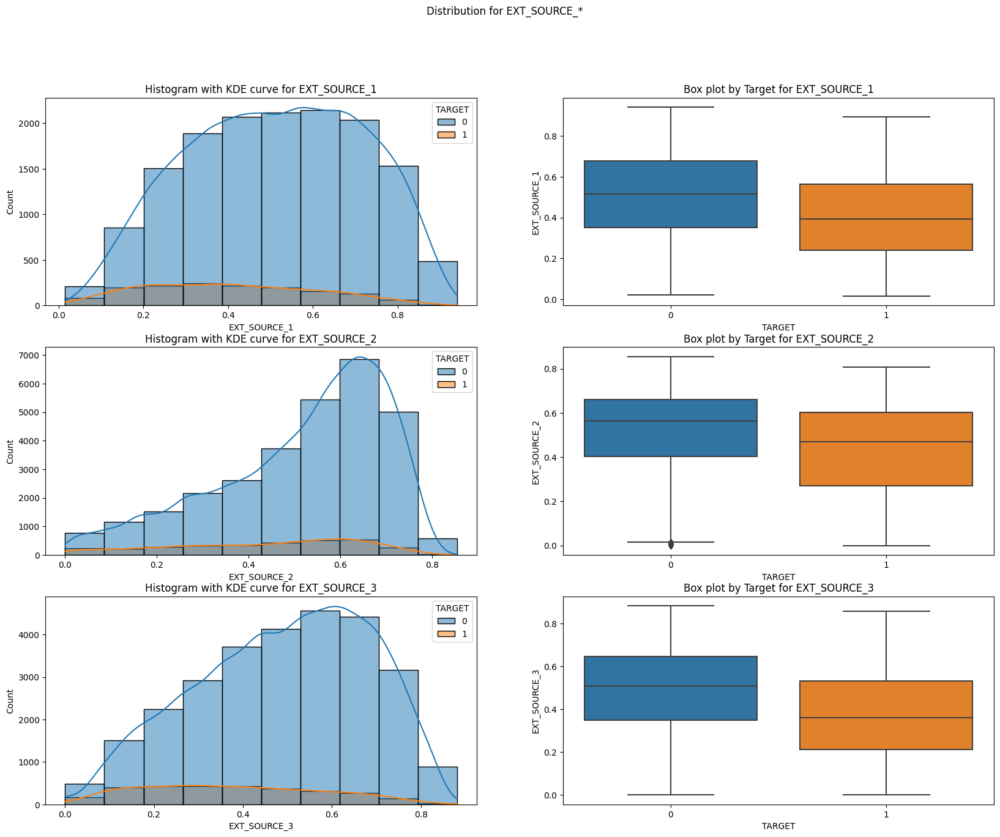

In [63]:
#Distribution for EXT_SOURCE_*
fig, axes = plt.subplots(3, 2, figsize = (20,15))
fig.suptitle('Distribution for EXT_SOURCE_*')

sns.histplot(ax=axes[0,0], data = application_df_v1, x = 'EXT_SOURCE_1', hue = 'TARGET', kde=True, bins=10)
axes[0,0].set_title('Histogram with KDE curve for EXT_SOURCE_1')

sns.boxplot(ax=axes[0,1], x = 'TARGET', y = 'EXT_SOURCE_1', data = application_df_v1)
axes[0,1].set_title('Box plot by Target for EXT_SOURCE_1')

sns.histplot(ax=axes[1,0], data = application_df_v1, x = 'EXT_SOURCE_2', hue = 'TARGET', kde=True, bins=10)
axes[1,0].set_title('Histogram with KDE curve for EXT_SOURCE_2')

sns.boxplot(ax=axes[1,1], x = 'TARGET', y = 'EXT_SOURCE_2', data = application_df_v1)
axes[1,1].set_title('Box plot by Target for EXT_SOURCE_2')

sns.histplot(ax=axes[2,0], data = application_df_v1, x = 'EXT_SOURCE_3', hue = 'TARGET', kde=True, bins=10)
axes[2,0].set_title('Histogram with KDE curve for EXT_SOURCE_3')

sns.boxplot(ax=axes[2,1], x = 'TARGET', y = 'EXT_SOURCE_3', data = application_df_v1)
axes[2,1].set_title('Box plot by Target for EXT_SOURCE_3')

Text(0.5, 1.0, 'Box plot by Target for REGION_POPULATION_RELATIVE')

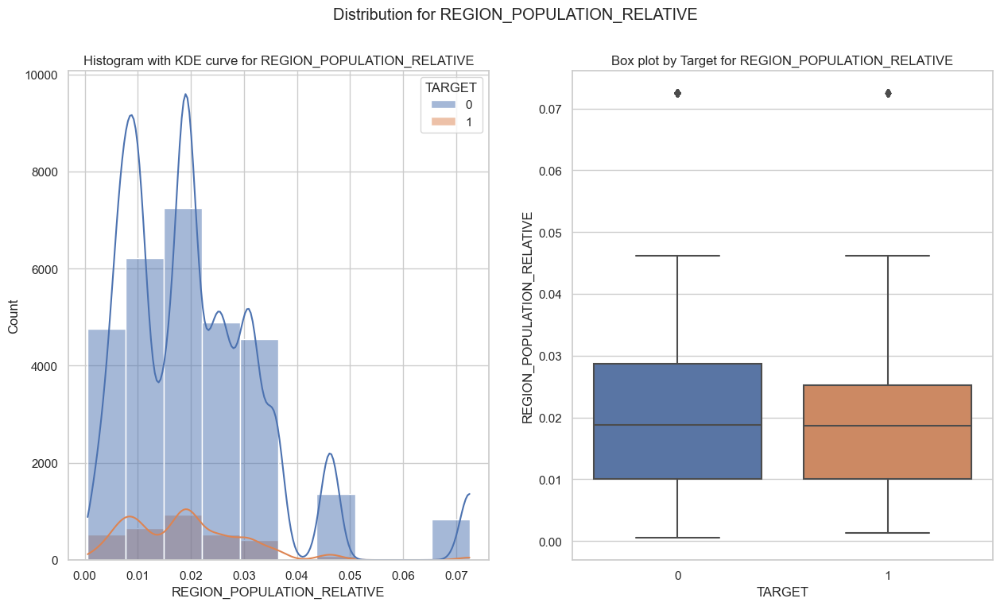

In [216]:
fig, axes = plt.subplots(1, 2, figsize = (15,8))
fig.suptitle('Distribution for REGION_POPULATION_RELATIVE')

sns.histplot(ax=axes[0], data = application_df_v1, x = 'REGION_POPULATION_RELATIVE', hue = 'TARGET', kde=True, bins=10)
axes[0].set_title('Histogram with KDE curve for REGION_POPULATION_RELATIVE')

sns.boxplot(ax=axes[1], x = 'TARGET', y = 'REGION_POPULATION_RELATIVE', data = application_df_v1)
axes[1].set_title('Box plot by Target for REGION_POPULATION_RELATIVE')


Text(0.5, 1.0, 'Box plot by Target for AMT_INCOME_TOTAL')

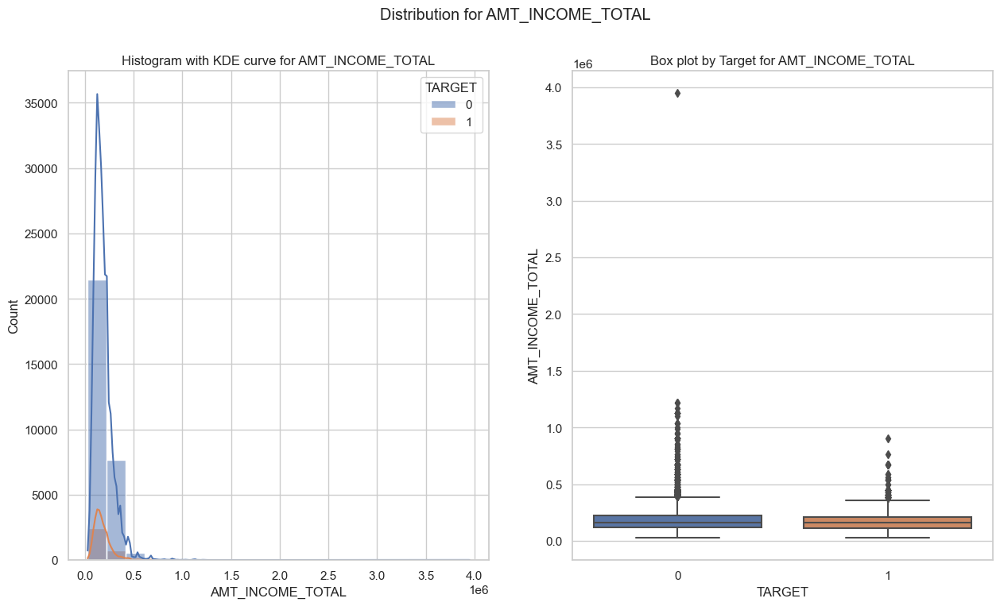

In [218]:
fig, axes = plt.subplots(1, 2, figsize = (15,8))
fig.suptitle('Distribution for AMT_INCOME_TOTAL')

sns.histplot(ax=axes[0], data = application_df_v1, x = 'AMT_INCOME_TOTAL', hue = 'TARGET', kde=True, bins=20)
axes[0].set_title('Histogram with KDE curve for AMT_INCOME_TOTAL')

sns.boxplot(ax=axes[1], x = 'TARGET', y = 'AMT_INCOME_TOTAL', data = application_df_v1)
axes[1].set_title('Box plot by Target for AMT_INCOME_TOTAL')


## Missing and Invalid values

> Visualizing missing values

Total number of columns with more than 50% missing values is: 47


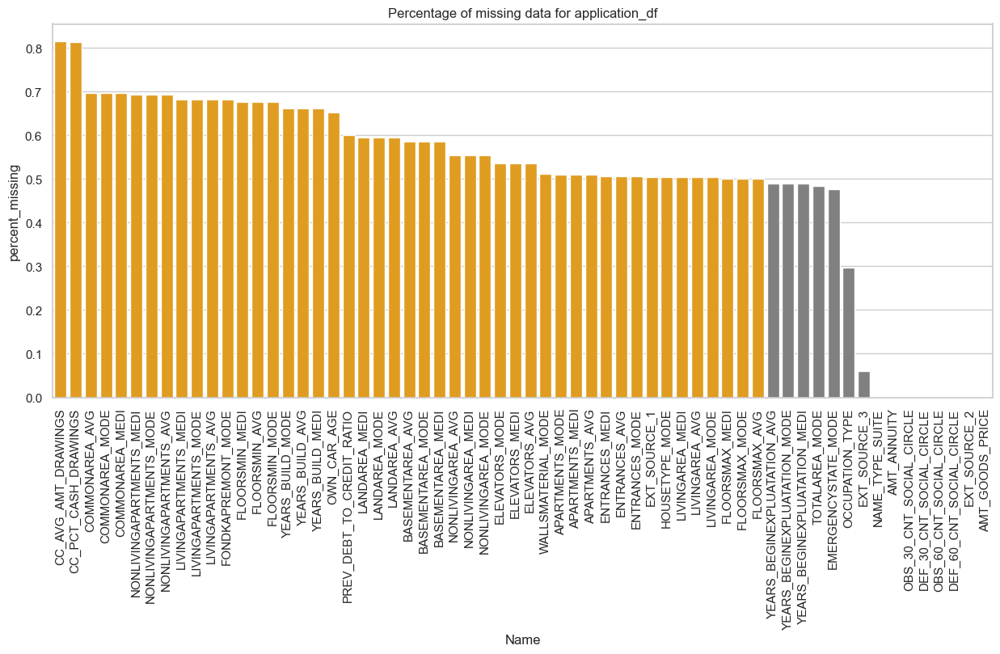

In [65]:
#Visualizing missing values for application_df
missing_app = application_df_v1.isnull().mean()
missing_app = missing_app[missing_app > 0]
missing_app.sort_values(inplace=True, ascending = False)

#creating pandas dataframe
missing_app = missing_app.to_frame()
missing_app.columns = ['percent_missing']
missing_app.index.names = ['Name']
missing_app['Name'] = missing_app.index

#missing values with more than 50%
app = missing_app['percent_missing'] > 0.5
print('Total number of columns with more than 50% missing values is:', app.sum())

#creating bar plot
cols = ['orange' if y > 0.5 else 'grey' for y in missing_app.percent_missing]
sns.set(style="whitegrid", color_codes=True)
fig, ax = plt.subplots(figsize=[15,6])
sns.barplot(x = 'Name', y = 'percent_missing', data=missing_app, ax=ax, palette=cols)
plt.xticks(rotation = 90)
plt.title('Percentage of missing data for application_df')
plt.show()

> [**DATA_CLEANING**] Impute missing values

In [66]:
dtypes = application_df_v1.dtypes.unique()

for i in range(0,len(dtypes)):
    sel_cols = list(application_df_v1.select_dtypes(include=dtypes[i]))
    print('application_df_v1 - ',{dtypes[i]}, '- Number of columns are' , len(sel_cols),':')
    print(sel_cols)
    print("_"*50)

application_df_v1 -  {dtype('int64')} - Number of columns are 9 :
['SK_ID_CURR', 'CNT_CHILDREN', 'DAYS_BIRTH', 'DAYS_EMPLOYED', 'DAYS_ID_PUBLISH', 'CB_TOTAL_LOANS', 'CB_MIN_DAYS_CREDIT', 'CNT_ACCOUNT_TYPES', 'CNT_ACTIVE_LOANS']
__________________________________________________
application_df_v1 -  {dtype('O')} - Number of columns are 49 :
['TARGET', 'NAME_CONTRACT_TYPE', 'CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'NAME_TYPE_SUITE', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'FLAG_MOBIL', 'FLAG_EMP_PHONE', 'FLAG_WORK_PHONE', 'FLAG_CONT_MOBILE', 'FLAG_PHONE', 'FLAG_EMAIL', 'OCCUPATION_TYPE', 'REGION_RATING_CLIENT', 'REGION_RATING_CLIENT_W_CITY', 'REG_REGION_NOT_LIVE_REGION', 'REG_REGION_NOT_WORK_REGION', 'LIVE_REGION_NOT_WORK_REGION', 'REG_CITY_NOT_LIVE_CITY', 'REG_CITY_NOT_WORK_CITY', 'LIVE_CITY_NOT_WORK_CITY', 'FONDKAPREMONT_MODE', 'HOUSETYPE_MODE', 'WALLSMATERIAL_MODE', 'EMERGENCYSTATE_MODE', 'FLAG_DOCUMENT_2', 'FLAG_DOCUMENT_3', 'FLA

In [67]:
#Creating a copy to be edited
application_df_cleaned = application_df_v1.copy()

> [**FEATURE CREATION**] Create missing flag

In [68]:
application_df_cleaned['M_EXT_SOURCE_1'] = application_df_cleaned['EXT_SOURCE_1'].isnull().astype(int)
application_df_cleaned['M_EXT_SOURCE_2'] = application_df_cleaned['EXT_SOURCE_2'].isnull().astype(int)
application_df_cleaned['M_EXT_SOURCE_3'] = application_df_cleaned['EXT_SOURCE_3'].isnull().astype(int)

OWN_CAR_AGE - NaN values (except for 3 entries) are for those without car (FLAG_OWN_CAR = N)  
- 0 values were seen for some FLAG_OWN_CAR = Y
- Imputed NaN values with 0. Did not create missing_flag since we already have FLAG_OWN_CAR

In [69]:
application_df_v1[application_df_v1['OWN_CAR_AGE'].isnull()]['FLAG_OWN_CAR'].unique()

array(['N', 'Y'], dtype=object)

In [70]:
application_df_v1[((application_df_v1['OWN_CAR_AGE'].isnull()) & (application_df_v1['FLAG_OWN_CAR'] == 'Y'))]

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,PREV_AVG_DPD_DAYS,PREV_AVG_CNT_DPD,PREV_SUM_AMT_ANNUITY,PREV_SUM_AMT_CREDIT,PREV_DEBT_TO_CREDIT_RATIO,CC_PCT_CASH_DRAWINGS,CC_AVG_AMT_DRAWINGS,POS_CNT_INSTALLMENTS_FUTURE,INS_AVG_LATE_PAYMENT,INS_AVG_LESS_PAYMENT
1379,352070,0,Cash loans,M,Y,N,0,225000.0,900000.0,26446.5,...,0.0,0.0,22500.000,450000.0,0.36839,1.0,40500.0,0.0,0.06,0.00
3481,374361,0,Cash loans,F,Y,Y,0,225000.0,233833.5,26577.0,...,0.0,0.0,36475.515,919705.5,NaN,NaN,NaN,25.0,0.00,0.00
19750,310040,0,Cash loans,F,Y,N,0,112500.0,301464.0,22068.0,...,0.0,0.0,7150.950,61276.5,NaN,NaN,NaN,1.0,4.40,2.43


In [71]:
#Impute NaN for OWN_CAR_AGE. These are set to 0 since these are for clients without car (OWN_CAR_FLAG = N)
application_df_cleaned['OWN_CAR_AGE'] = application_df_cleaned['OWN_CAR_AGE'].fillna(0)
application_df_cleaned['OWN_CAR_AGE'].isnull().mean()

0.0

* Columns from previous application table (CC_AVG_AMT_DRAWINGS, CC_PCT_CASH_DRAWINGS, PREV_DEBT_TO_CREDIT_RATIO) will be set to 0 since these columns really mean 0 drawings / zero debt_to_credit ratio.
* Other columns will be set to median or mode

In [72]:
missing_columns = missing_app[missing_app['percent_missing'] > 0].index

#Impute other numerical values with median and categorical with mode
for i in missing_columns:
    if application_df_cleaned[i].dtypes == 'float64':
        application_df_cleaned[i] = application_df_cleaned[i].fillna(application_df_cleaned[i].median())
    elif application_df_cleaned[i].dtypes == 'O':
        application_df_cleaned[i] = application_df_cleaned[i].fillna(application_df_cleaned[i].mode()[0])
print('Columns with missing values:', application_df_cleaned.isnull().mean().sum())

Columns with missing values: 0.0


In [73]:
dtypes = application_df_cleaned.dtypes.unique()

for i in range(0,len(dtypes)):
    sel_cols = list(application_df_cleaned.select_dtypes(include=dtypes[i]))
    print('application_df_cleaned - ',{dtypes[i]}, '- Number of columns are' , len(sel_cols),':')
    print(sel_cols)
    print("_"*50)

application_df_cleaned -  {dtype('int64')} - Number of columns are 12 :
['SK_ID_CURR', 'CNT_CHILDREN', 'DAYS_BIRTH', 'DAYS_EMPLOYED', 'DAYS_ID_PUBLISH', 'CB_TOTAL_LOANS', 'CB_MIN_DAYS_CREDIT', 'CNT_ACCOUNT_TYPES', 'CNT_ACTIVE_LOANS', 'M_EXT_SOURCE_1', 'M_EXT_SOURCE_2', 'M_EXT_SOURCE_3']
__________________________________________________
application_df_cleaned -  {dtype('O')} - Number of columns are 49 :
['TARGET', 'NAME_CONTRACT_TYPE', 'CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'NAME_TYPE_SUITE', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'FLAG_MOBIL', 'FLAG_EMP_PHONE', 'FLAG_WORK_PHONE', 'FLAG_CONT_MOBILE', 'FLAG_PHONE', 'FLAG_EMAIL', 'OCCUPATION_TYPE', 'REGION_RATING_CLIENT', 'REGION_RATING_CLIENT_W_CITY', 'REG_REGION_NOT_LIVE_REGION', 'REG_REGION_NOT_WORK_REGION', 'LIVE_REGION_NOT_WORK_REGION', 'REG_CITY_NOT_LIVE_CITY', 'REG_CITY_NOT_WORK_CITY', 'LIVE_CITY_NOT_WORK_CITY', 'FONDKAPREMONT_MODE', 'HOUSETYPE_MODE', 'WALLSMATERIAL_MODE', 

> [**DATA_CLEANING**] Removing redundant / irrelevant columns about building information

In [74]:
remove = ['YEARS_BEGINEXPLUATATION_MEDI', 'COMMONAREA_MEDI', 'ELEVATORS_MEDI', 'ENTRANCES_MEDI', 'FLOORSMAX_MEDI', 
'FLOORSMIN_MEDI', 'LIVINGAPARTMENTS_MEDI', 'LIVINGAREA_MEDI', 'NONLIVINGAPARTMENTS_MEDI', 'NONLIVINGAREA_MEDI']
application_df_cleaned = application_df_cleaned.drop(columns=remove)

> [**DATA_CLEANING**] Check and correct negative / invalid values

In [75]:
#Converting DAYS_BIRTH to AGE by dividing by 365 and multiplying by (-1), round by nearest integer
#Removing DAYS_BIRTH column
application_df_cleaned['AGE'] = round((application_df_cleaned['DAYS_BIRTH']/365)*(-1))
application_df_cleaned = application_df_cleaned.drop(columns=('DAYS_BIRTH'))

In [76]:
#DAYS_EMPLOYED has one unique positive big number 365243 which means infinity.
print(application_df_cleaned[application_df_cleaned['DAYS_EMPLOYED']>0]['DAYS_EMPLOYED'].unique())
print(len(application_df_cleaned[application_df_cleaned['DAYS_EMPLOYED']>0]))

[365243]
5495


In [77]:
#DAYS_EMPLOYED – This column denotes the number of days before the application the person started their current employment. 
#The large number is existing for those with NAME_INCOME_TYPE either Pensioner or Unemployed, which is expected. 
# Set the value to zero.
application_df_cleaned['DAYS_EMPLOYED'] = application_df_cleaned['DAYS_EMPLOYED'].replace([365243], 0)

In [78]:
#Changing days_employed to positive
application_df_cleaned['DAYS_EMPLOYED'] = application_df_cleaned['DAYS_EMPLOYED'].apply(lambda x: abs(x))

In [79]:
#GENDER_CODE : replacing XNA gender codes to mode - F
application_df_cleaned['CODE_GENDER'] = application_df_cleaned['CODE_GENDER'].replace(['XNA'], application_df_cleaned['CODE_GENDER'].mode())

In [80]:
#Max value is 0. Changing DAYS_ID_PUBLISH to positive
application_df_cleaned['DAYS_ID_PUBLISH'] = application_df_cleaned['DAYS_ID_PUBLISH'].apply(lambda x: abs(x))

In [81]:
#Max value is 0. Changing DAYS_LAST_PHONE_CHANGE to positive
application_df_cleaned['DAYS_LAST_PHONE_CHANGE'] = application_df_cleaned['DAYS_LAST_PHONE_CHANGE'].apply(lambda x: abs(x))

In [82]:
#Max value is 0. Changing CB_MIN_DAYS_CREDIT to positive
application_df_cleaned['CB_MIN_DAYS_CREDIT'] = application_df_cleaned['CB_MIN_DAYS_CREDIT'].apply(lambda x: abs(x))

[**FEATURE CREATION**]

In [83]:
#creating DEBT_TO_INCOME_RATIO column
application_df_cleaned['DEBT_TO_INCOME_RATIO'] = application_df_cleaned['CB_AMT_CREDIT_SUM_DEBT'] / application_df_cleaned['AMT_INCOME_TOTAL']

In [84]:
#there are negative values for this column.
len(application_df_cleaned[application_df_cleaned['DEBT_TO_INCOME_RATIO'] < 0])
#Set minimum value of DEBT_TO_INCOME_RATIO to 0
application_df_cleaned.loc[application_df_cleaned['DEBT_TO_INCOME_RATIO'] < 0, 'DEBT_TO_INCOME_RATIO'] = 0

In [85]:
#creating AMT_CREDIT_TO_ANNUITY Ratio
application_df_cleaned['AMT_CREDIT_TO_ANNUITY'] = application_df_cleaned['AMT_CREDIT'] / application_df_cleaned['AMT_ANNUITY']

## Correlation

> Correlation for numeric variables vs target

In [86]:
#selecting numeric variables
numericdf = application_df_cleaned.select_dtypes(include='number').drop(columns='SK_ID_CURR')
numericdf = pd.concat([application_df_cleaned['TARGET'],numericdf], axis=1) #including target
len(numericdf.columns)

93

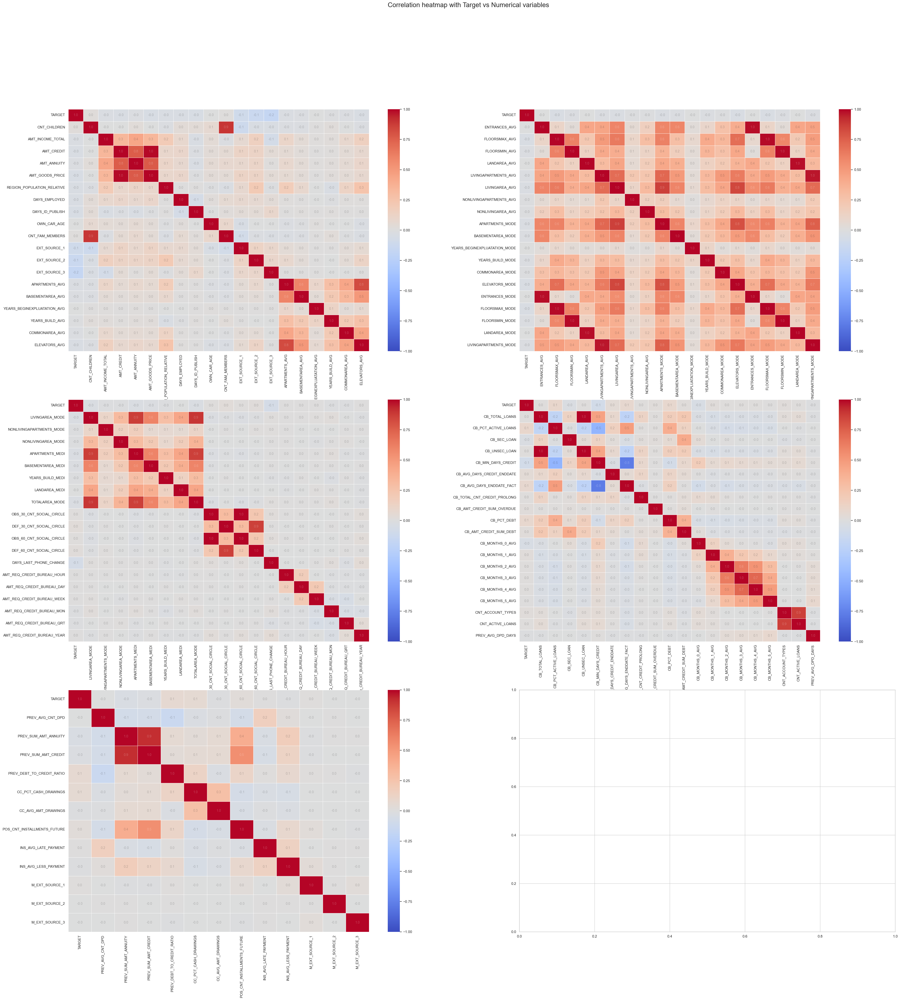

In [87]:
#Checking correlation of numeric variables to target:

corr = numericdf.iloc[:,0:20].corr()
corr1 = numericdf.iloc[:,np.r_[0, 20:39]].corr()
corr2 = numericdf.iloc[:,np.r_[0, 39:58]].corr()
corr3 = numericdf.iloc[:,np.r_[0, 58:78]].corr()
corr4 = numericdf.iloc[:,np.r_[0, 78:90]].corr()

fig, axes = plt.subplots(3, 2, figsize=(45, 45))
fig.suptitle('Correlation heatmap with Target vs Numerical variables', fontsize = 20)

sns.heatmap(ax=axes[0, 0], data=corr, cmap="coolwarm", annot=True, fmt='.1f', 
    annot_kws={'size': 'small', 'alpha': 0.25}, linewidths=0.5, vmin=-1, vmax=1)
sns.heatmap(ax=axes[0, 1], data=corr1, cmap="coolwarm", annot=True, fmt='.1f', 
    annot_kws={'size': 'small', 'alpha': 0.25}, linewidths=0.5, vmin=-1, vmax=1)
sns.heatmap(ax=axes[1, 0], data=corr2, cmap="coolwarm", annot=True, fmt='.1f',
    annot_kws={'size': 'small', 'alpha': 0.25}, linewidths=0.5, vmin=-1, vmax=1)
sns.heatmap(ax=axes[1, 1], data=corr3, cmap="coolwarm", annot=True, fmt='.1f', 
    annot_kws={'size': 'small', 'alpha': 0.25}, linewidths=0.5, vmin=-1, vmax=1)
sns.heatmap(ax=axes[2, 0], data=corr4, cmap="coolwarm", annot=True, fmt='.1f', 
    annot_kws={'size': 'small', 'alpha': 0.25}, linewidths=0.5, vmin=-1, vmax=1)
plt.show()

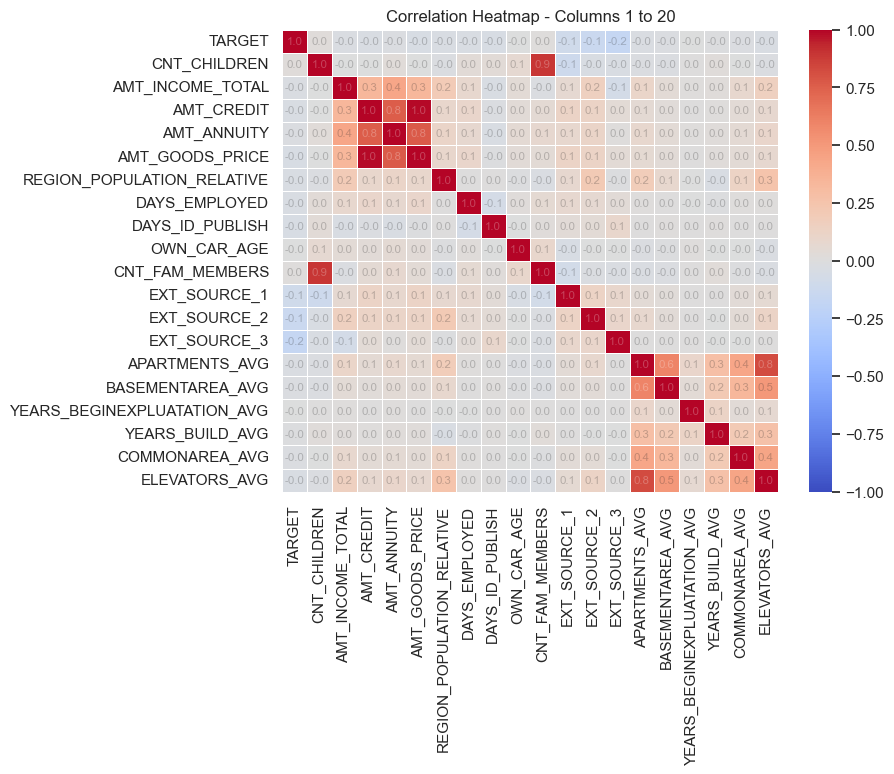

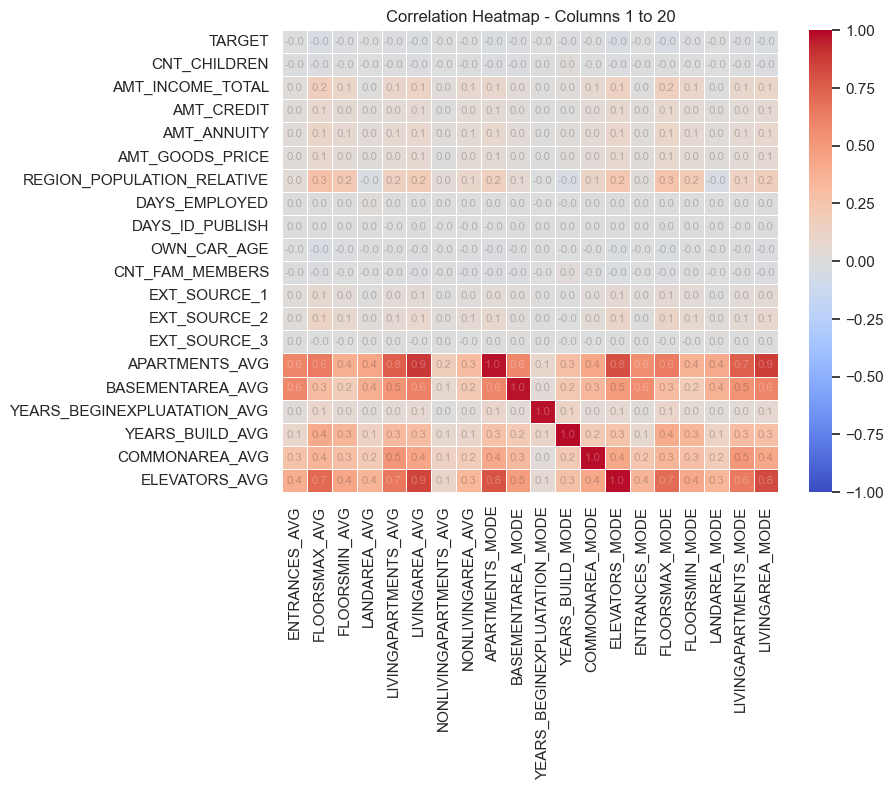

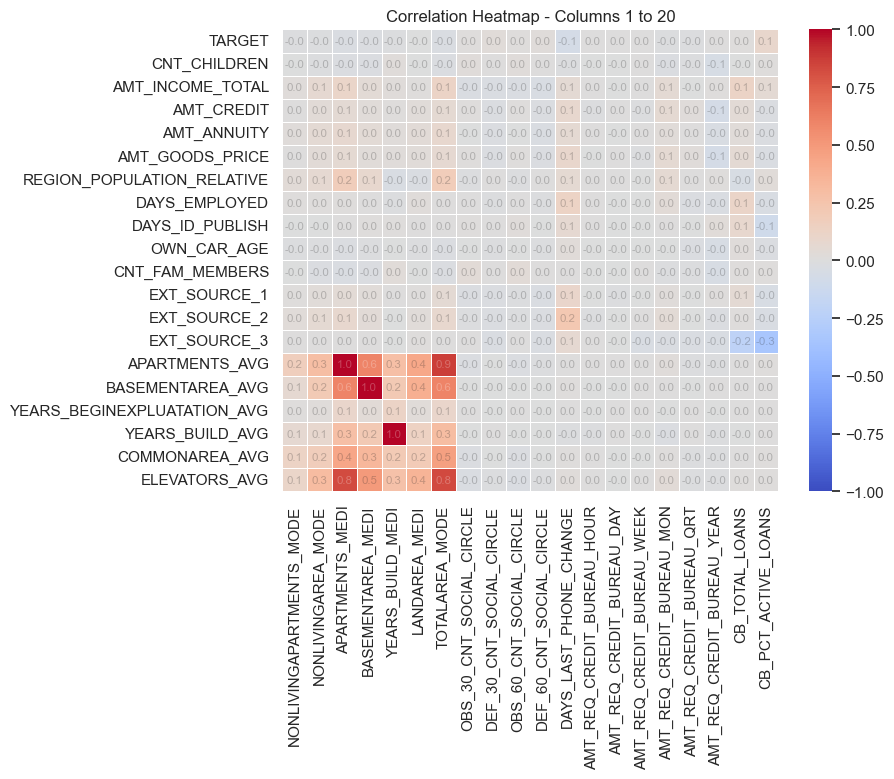

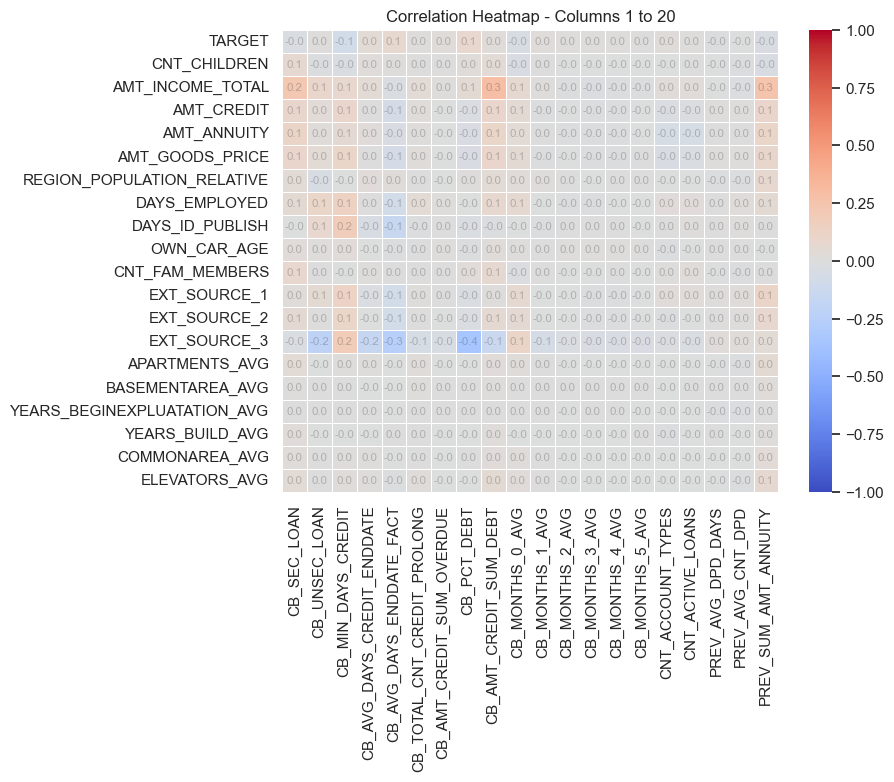

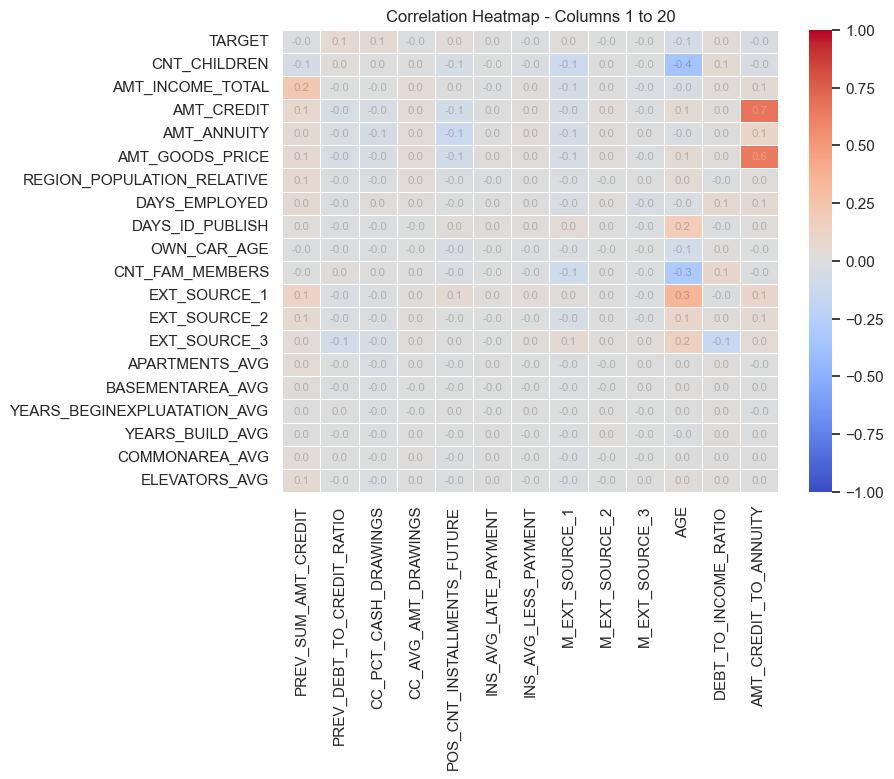

...

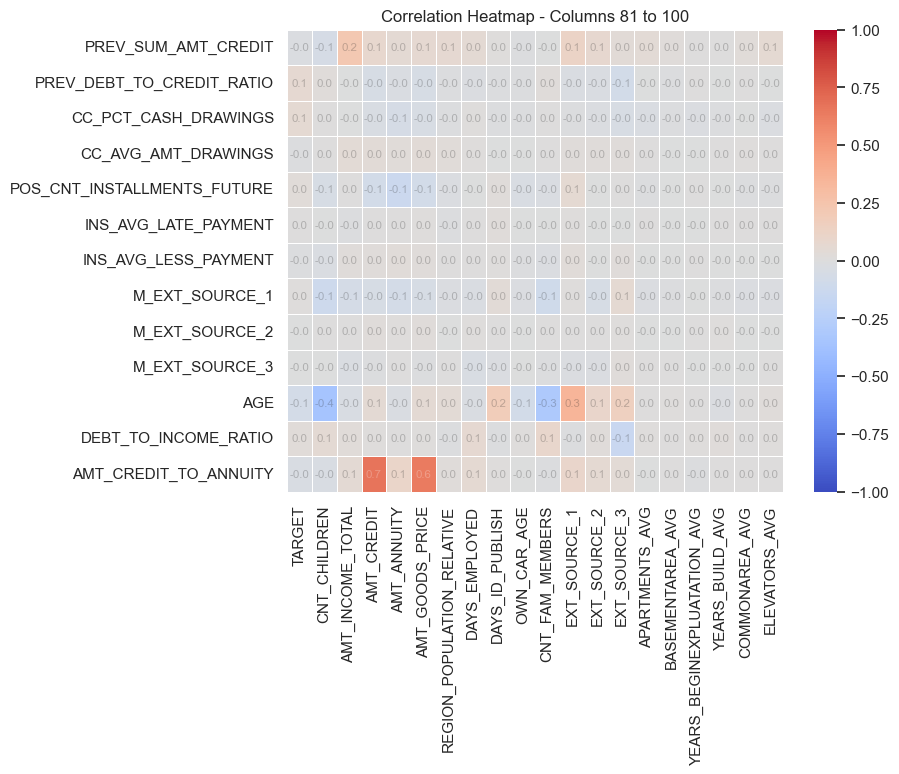

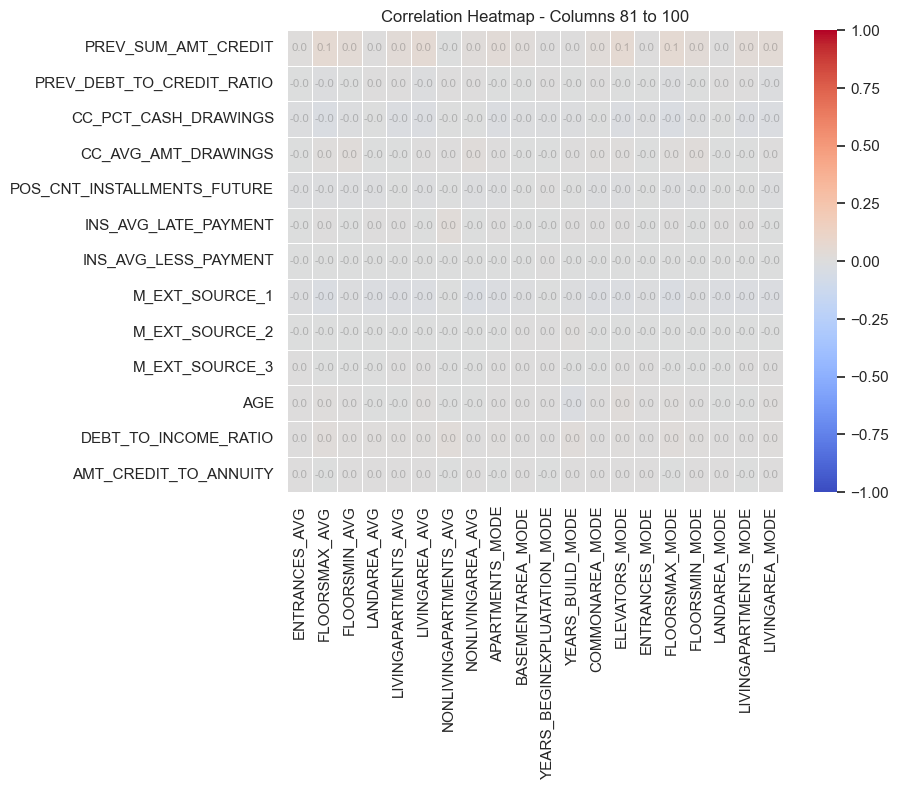

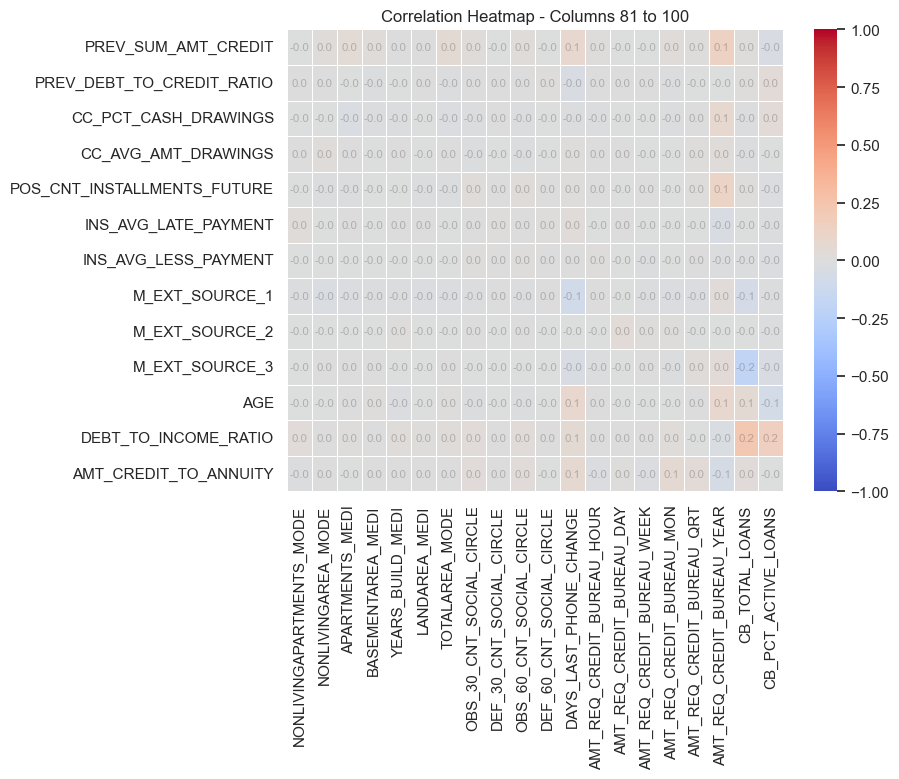

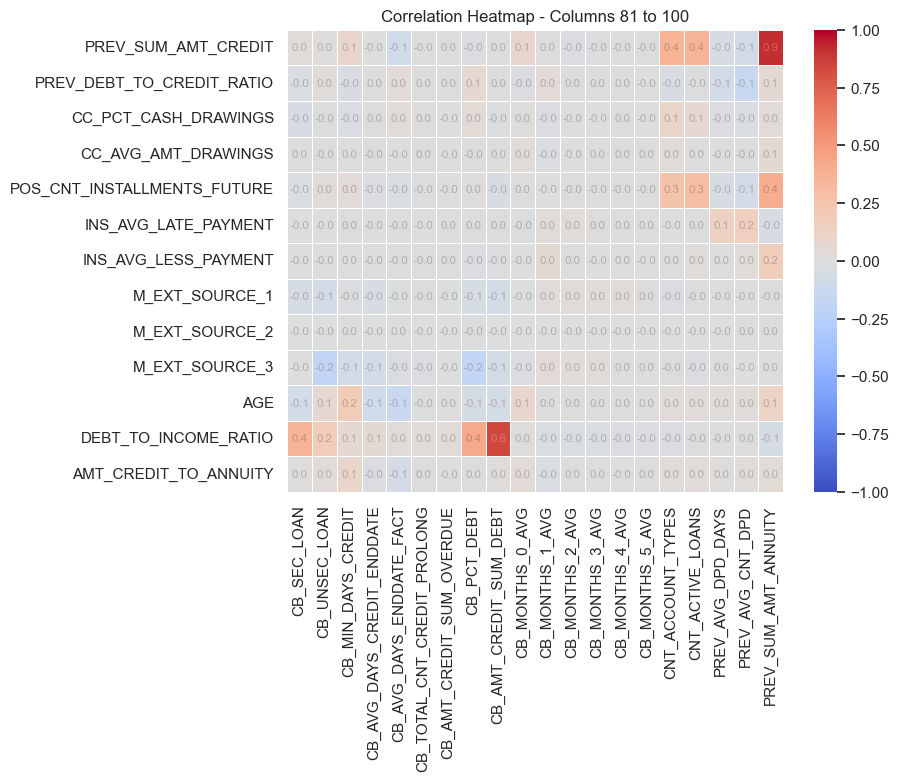

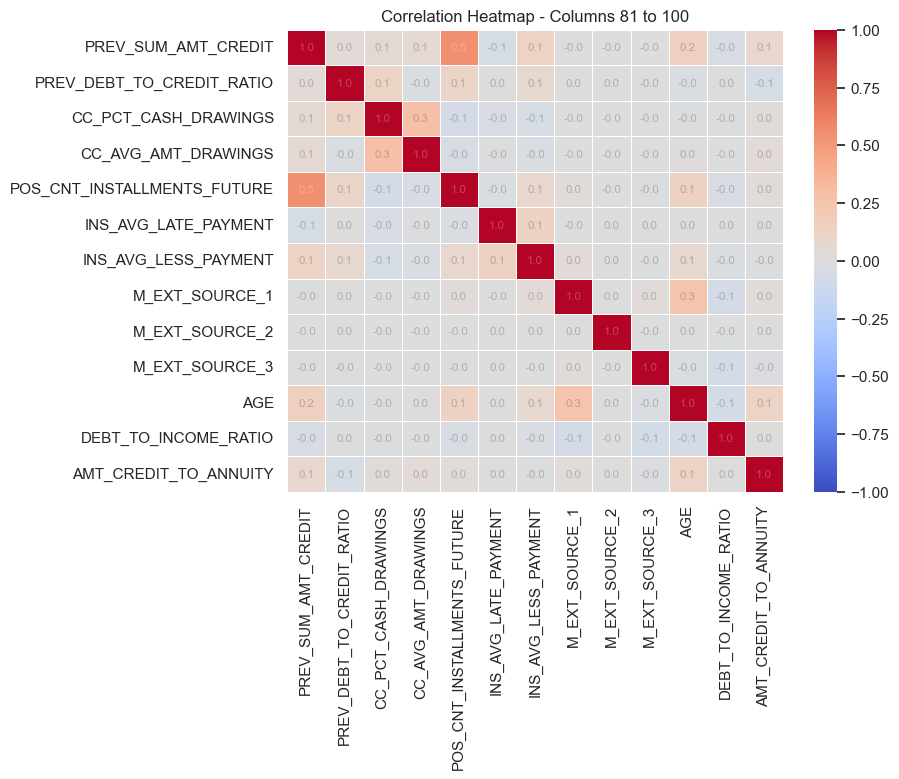

In [88]:
#Checking correlation of numeric variables:
corr = numericdf.corr()

# Set the size of each heatmap segment
heatmap_segment_size = 20

num_columns = len(corr.columns)
for i in range(0, num_columns, heatmap_segment_size):
    for j in range(0, num_columns, heatmap_segment_size):
        subset_corr_matrix = corr.iloc[i:i+heatmap_segment_size, j:j+heatmap_segment_size]

        plt.figure(figsize=(8, 6))
        sns.heatmap(subset_corr_matrix, annot=True, cmap='coolwarm', fmt=".1f", annot_kws={'size': 'x-small', 'alpha': 0.25}, linewidths=0.5,
         vmin=-1, vmax=1)
        plt.title("Correlation Heatmap - Columns {} to {}".format(i+1, i+heatmap_segment_size))
        plt.show()

> Correlation of categorical vs target

* NAME_INCOME_TYPE, FLAG_DOCUMENT_6 – 0.6 – Remove FLAG_DOCUMENT_6
* REGION_RATING_CLIENT_W_CITY, REGION_RATING_CLIENT – 1 – Removed REGION_RATING_CLIENT
* FLAG_EMP_PHONE, FLAG_DOCUMENT_6 – 0.6 – Removed FLAG_DOCUMENT_6
* REG_CITY_NOT_WORK_CITY, LIVE_CITY_NOT_WORK_CITY – 0.8 – Removed LIVE_CITY_NOT_WORK_CITY
* FLAG_DOCUMENT_3, FLAG_DOCUMENT_6 – 0.6 – Remove FLAG_DOCUMENT_6
* FLAG_DOCUMENT_3, FLAG_DOCUMENT_8 – 0.6 – Remove FLAG_DOCUMENT_8


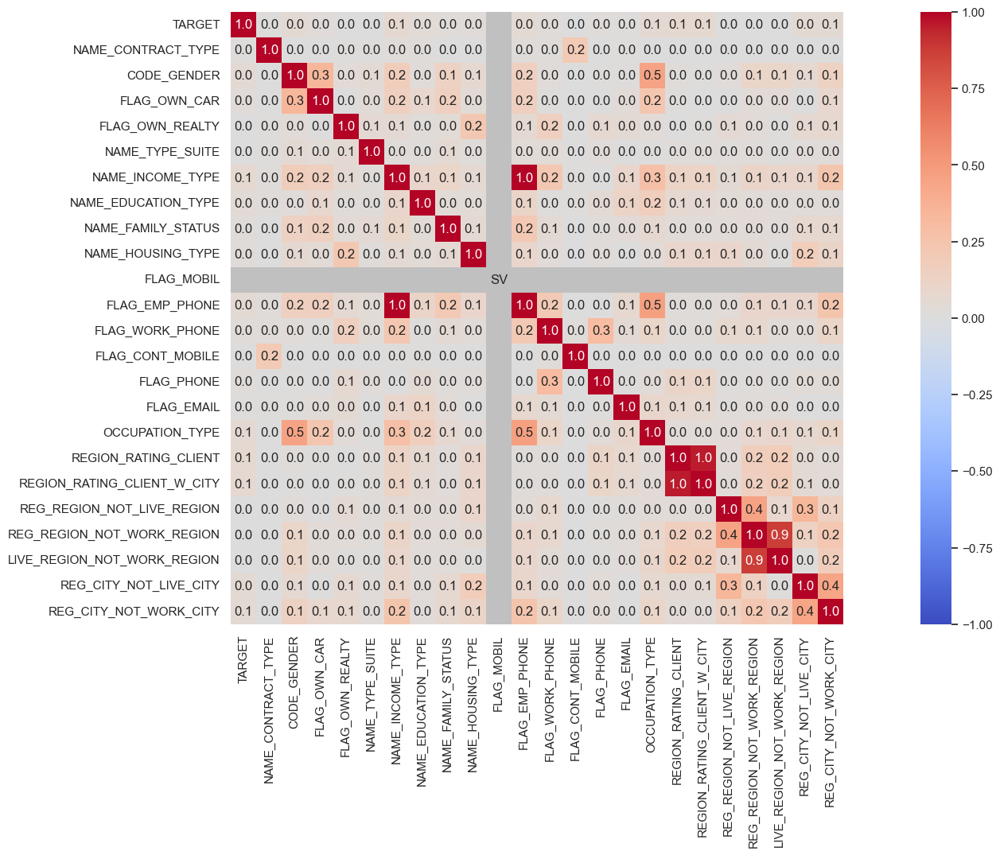

In [89]:
categorical_features=identify_nominal_columns(application_df_cleaned)
categorical_df = application_df_cleaned[categorical_features].copy()
categorical_correlation= associations(categorical_df.iloc[:,0:24], filename= 'categorical_correlation.png', figsize=(25,10), 
fmt = '.1f', vmin=-1, vmax=1, cmap='coolwarm')

> Chi-square: Correlation of categorical variables

In [90]:
# Selecting categorical features and the target variable
from scipy.stats import chi2_contingency
col_chi2 = application_df_cleaned.select_dtypes(include=['object', 'category'])
col_chi2.columns
categorical_features = col_chi2.columns
target_variable = 'TARGET'

# Calculate contingency tables and perform chi-square test
feature_statistics = []

for feature in categorical_features:
    contingency_table = pd.crosstab(application_df_cleaned[feature], application_df_cleaned[target_variable])
    chi2, p, _, _ = chi2_contingency(contingency_table)
    feature_statistics.append({'Feature': feature, 'Chi-Square': chi2, 'P-value': p})

# Create a DataFrame to display the results
results_df = pd.DataFrame(feature_statistics)
results_df = results_df.sort_values(by='P-value')

print("Feature Selection Results:")
print(results_df)

# Select features
selected_features = [i['Feature'] for i in feature_statistics if i['P-value'] < 0.05]

print("Total number of features:", len(categorical_features))
print("Selected Features:", selected_features)
print("Total number of selected:", len(selected_features))

#Not significant features
Removed_features = [i['Feature'] for i in feature_statistics if i['P-value'] > 0.05]
print("To be removed Features:", Removed_features)

Feature Selection Results:
                        Feature    Chi-Square       P-value
0                        TARGET  33020.451864  0.000000e+00
6              NAME_INCOME_TYPE    156.664554  7.588819e-33
18  REGION_RATING_CLIENT_W_CITY    140.122895  3.738523e-31
17         REGION_RATING_CLIENT    134.548920  6.068387e-30
16              OCCUPATION_TYPE    145.006785  2.313915e-22
23       REG_CITY_NOT_WORK_CITY     93.247077  4.615707e-22
11               FLAG_EMP_PHONE     83.366171  6.817878e-20
22       REG_CITY_NOT_LIVE_CITY     83.298582  7.055019e-20
2                   CODE_GENDER     75.845072  3.068172e-18
7           NAME_EDUCATION_TYPE     73.946281  3.328477e-15
30              FLAG_DOCUMENT_3     49.252235  2.250768e-12
33              FLAG_DOCUMENT_6     41.548122  1.150049e-10
24      LIVE_CITY_NOT_WORK_CITY     33.038748  9.034035e-09
3                  FLAG_OWN_CAR     23.810156  1.063200e-06
9             NAME_HOUSING_TYPE     35.393287  1.255778e-06
12           

> [**DATA_CLEANING**] Remove not significant variables

In [91]:
#columns to be removed based on Chi-square
remove_categories = ['NAME_CONTRACT_TYPE', 'FLAG_OWN_REALTY', 'NAME_TYPE_SUITE', 'FLAG_MOBIL', 'FLAG_CONT_MOBILE', 
'FLAG_EMAIL', 'REG_REGION_NOT_LIVE_REGION', 'REG_REGION_NOT_WORK_REGION', 'LIVE_REGION_NOT_WORK_REGION', 'HOUSETYPE_MODE', 
'WALLSMATERIAL_MODE', 'EMERGENCYSTATE_MODE', 'FLAG_DOCUMENT_2', 'FLAG_DOCUMENT_4', 'FLAG_DOCUMENT_5', 'FLAG_DOCUMENT_7', 
'FLAG_DOCUMENT_9', 'FLAG_DOCUMENT_10', 'FLAG_DOCUMENT_11', 'FLAG_DOCUMENT_12', 'FLAG_DOCUMENT_13', 'FLAG_DOCUMENT_14', 
'FLAG_DOCUMENT_15', 'FLAG_DOCUMENT_16', 'FLAG_DOCUMENT_17', 'FLAG_DOCUMENT_18', 'FLAG_DOCUMENT_19', 'FLAG_DOCUMENT_20',
'FLAG_DOCUMENT_21']

#remove from application_df_cleaned
application_df_cleaned = application_df_cleaned.drop(columns=remove_categories)
application_df_cleaned.shape

(33032, 113)

> [**DATA_CLEANING**] Remove highly correlated variables

**Remove highly correlated variables**

Categorical correlation:
* NAME_INCOME_TYPE, FLAG_DOCUMENT_6 – 0.6 – Removed FLAG_DOCUMENT_6
* REGION_RATING_CLIENT_W_CITY, REGION_RATING_CLIENT – 1 – Removed REGION_RATING_CLIENT
* FLAG_EMP_PHONE, FLAG_DOCUMENT_6 – 0.6 – Removed FLAG_DOCUMENT_6
* REG_CITY_NOT_WORK_CITY, LIVE_CITY_NOT_WORK_CITY – 0.8 – Removed LIVE_CITY_NOT_WORK_CITY
* FLAG_DOCUMENT_3, FLAG_DOCUMENT_6 – 0.6 – Remove FLAG_DOCUMENT_6
* FLAG_DOCUMENT_3, FLAG_DOCUMENT_8 – 0.6 – Remove FLAG_DOCUMENT_8

Numerical correlation:
* Building info for AVG, MEDI and MODE are highly correlated (some are 100%), will retain only the relevant *MEDI (Median) variables.
    * APARTMENTS_AVG, BASEMENT_AVG – 0.6 : Remove all *AVG
    * APARTMENTS_AVG, ELEVATORS_AVG – 0.8
    * APARTMENTS_AVG, TOTAL_AREA_MODE – 0.9
    * APARTMENTS_AVG, BASEMENT_MEDI – 0.5
* CNT_CHILDREN , CNT_FAM_MEMBERS - 0.9 : Remove CNT_CHILDREN
    - Same correlation with other variables and target
* AMT_CREDIT, AMT_CREDIT_TO_ANNUITY – 0.7: Remove AMT_CREDIT
* AMT_CREDIT, AMT_ANNUITY – 0.8 : Remove AMT_CREDIT
* AMT_CREDIT, AMT_GOODS_PRICE – 1 : Remove both
* AMT_ANNUITY, AMT_GOODS_PRICE – 0.8 : REMOVE AMT_GOODS_PRICE
* AMT_GOODS_PRICE , AMT_CREDIT_TO_ANNUITY – 0.6 : REMOVE AMT_GOODS_PRICE
* OBS_30_CNT_SOCIAL_CIRCLE, OBS_60_CNT_SOCIAL_CIRCLE – 1 : Remove OBS_60_CNT_SOCIAL_CIRCLE
* DEF_30_CNT_SOCIAL_CIRCLE, DEF_60_CNT_SOCIAL_CIRCLE – 0.9 : Remove DEF_60_CNT_SOCIAL_CIRCLE
* CB_UNSEC_LOAN, CB_TOTAL_LOANS – 1 : Remove CB_TOTAL_LOANS
* CB_MIN_DAYS_CREDIT, CB_AVG_DAYS_ENDDATE_FACT – 0.8: Remove CB_AVG_DAYS_ENDDATE_FACT
* CB_MONTHS_2_AVG, CB_MONTHS_3_AVG – 0.6: Remove CB_MONTHS_3_AVG
* CB_MONTHS_3_AVG, CB_MONTHS_4_AVG – 0.7: Remove CB_MONTHS_3_AVG
* CNT_ACCOUNT_TYPES, CNT_ACTIVE_LOANS – 0.9: Remove CNT_ACCOUNT_TYPES
* PREV_AVG_DPD_DAYS, PREV_AVG_CNT_DPD – 0.8: Remove PREV_AVG_CNT_DPD
* PREV_SUM_AMT_ANNUITY, PREV_SUM_AMT_CREDIT – 0.9: Remove PREV_SUM_AMT_ANNUITY
* CB_AMT_CREDIT_SUM_DEBT, DEBT_TO_INCOME_RATIO – 08: Remove CB_AMT_CREDIT_SUM_DEBT,
* FONDKAPREMONT_MODE - to be removed, a lot of correlations with other fields, unknown meaning
* TOTAL AREA MODE - has a lot of correlations with other variables - remove

In [92]:
#columns to be removed based on correlation
remove_col = ['CNT_CHILDREN', 'AMT_CREDIT', 'AMT_GOODS_PRICE', 'REGION_RATING_CLIENT', 'LIVE_CITY_NOT_WORK_CITY',
    'APARTMENTS_AVG', 'BASEMENTAREA_AVG', 'YEARS_BEGINEXPLUATATION_AVG', 'YEARS_BUILD_AVG', 'COMMONAREA_AVG', 'ELEVATORS_AVG', 'ENTRANCES_AVG',
    'FLOORSMAX_AVG', 'FLOORSMIN_AVG', 'LANDAREA_AVG', 'LIVINGAPARTMENTS_AVG', 'LIVINGAREA_AVG', 'NONLIVINGAPARTMENTS_AVG', 'NONLIVINGAREA_AVG',
    'APARTMENTS_MODE', 'BASEMENTAREA_MODE', 'YEARS_BEGINEXPLUATATION_MODE', 'YEARS_BUILD_MODE', 'COMMONAREA_MODE', 'ELEVATORS_MODE', 'ENTRANCES_MODE',
    'FLOORSMAX_MODE', 'FLOORSMIN_MODE', 'LANDAREA_MODE', 'LIVINGAPARTMENTS_MODE', 'LIVINGAREA_MODE', 'NONLIVINGAPARTMENTS_MODE', 'NONLIVINGAREA_MODE', 
    'TOTALAREA_MODE', 'OBS_60_CNT_SOCIAL_CIRCLE', 'DEF_60_CNT_SOCIAL_CIRCLE','CB_TOTAL_LOANS','CB_AVG_DAYS_ENDDATE_FACT','CB_MONTHS_3_AVG',
    'CNT_ACCOUNT_TYPES','PREV_AVG_CNT_DPD','PREV_SUM_AMT_ANNUITY','CB_AMT_CREDIT_SUM_DEBT','FLAG_DOCUMENT_6','FLAG_DOCUMENT_8','FONDKAPREMONT_MODE','TOTALAREA_MODE']
len(remove_col)

47

In [93]:
#columns for main table application_df_cleaned are now 64 from 110.
application_df_cleaned = application_df_cleaned.drop(remove_col, axis=1)
application_df_cleaned.shape

(33032, 67)

## Outliers

> Checking outliers for numerical variables

In [94]:
numericdf = application_df_cleaned.select_dtypes(include='number').drop(columns='SK_ID_CURR')

In [ ]:
for i in numericdf.columns:
    fig = px.box(application_df_cleaned, x=i)
    fig.show()

> Checking outliers for categorical variables using histplot

In [96]:
#Create histogram for categories
categorydf = application_df_cleaned.select_dtypes(include='object')
len(categorydf.columns)

15

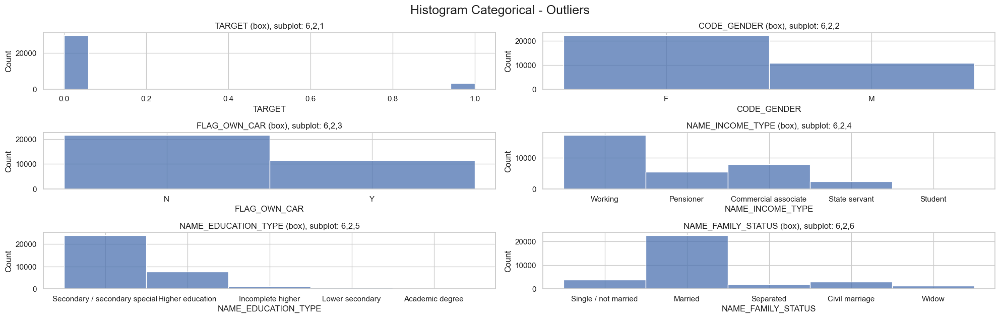

In [97]:
select_col = categorydf.iloc[:,0:6].columns

#  plot Categorical Data
a = len(select_col)  # number of rows
b = 2  # number of columns
c = 1  # initialize plot counter

fig = plt.figure(figsize = (20,12))
plt.suptitle("Histogram Categorical - Outliers", fontsize = 18)

for i in select_col:
    plt.subplot(a, b, c)
    plt.title('{} (box), subplot: {},{},{}'.format(i, a, b, c))
    plt.xlabel(i)
    sns.histplot(data = application_df_cleaned, x = i) #hue = 'TARGET')
    c = c + 1

plt.tight_layout()
plt.show()

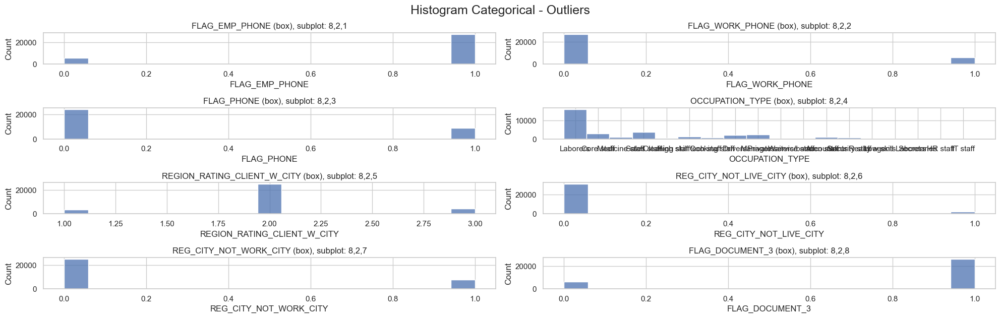

In [98]:
select_col = categorydf.iloc[:,7:17].columns

#  plot Categorical Data
a = len(select_col)  # number of rows
b = 2  # number of columns
c = 1  # initialize plot counter

fig = plt.figure(figsize = (20,12))
plt.suptitle("Histogram Categorical - Outliers", fontsize = 18)

for i in select_col:
    plt.subplot(a, b, c)
    plt.title('{} (box), subplot: {},{},{}'.format(i, a, b, c))
    plt.xlabel(i)
    sns.histplot(data = application_df_cleaned, x = i) #hue = 'TARGET')
    c = c + 1

plt.tight_layout()
plt.show()

## [DATA CLEANING] Recode Categories

 1. **NAME_INCOME_TYPE** 8 ['Working' 'State servant' 'Commercial associate' 'Pensioner' 'Unemployed' 'Student' 'Businessman' 'Maternity leave']  
 2. **NAME_EDUCATION_TYPE** 5 ['Secondary / secondary special' 'Higher education' 'Incomplete higher' 'Lower secondary' 'Academic degree']  
 3. **NAME_FAMILY_STATUS** 6 ['Single / not married' 'Married' 'Civil marriage' 'Widow' 'Separated' 'Unknown']  
 4. **OCCUPATION_TYPE** 18 ['Laborers' 'Core staff' 'Accountants' 'Managers' nan 'Drivers' 'Sales staff' 'Cleaning staff' 'Cooking staff' 'Private service staff' 'Medicine staff' 'Security staff' 'High skill tech staff' 'Waiters/barmen staff' 'Low-skill Laborers' 'Realty agents' 'Secretaries' 'IT staff' 'HR staff']

> Checking unique categorical values

In [99]:
# Checking the count of unique values in each categorical column 

cols_cat= application_df_cleaned.select_dtypes(['object'])

for i in cols_cat.columns:
    print('Unique values in',i, 'are :')
    print(application_df_cleaned[i].value_counts(normalize = True))
    print('*'*40)

Unique values in TARGET are :
TARGET
0    0.904244
1    0.095756
Name: proportion, dtype: float64
****************************************
Unique values in CODE_GENDER are :
CODE_GENDER
F    0.671288
M    0.328712
Name: proportion, dtype: float64
****************************************
Unique values in FLAG_OWN_CAR are :
FLAG_OWN_CAR
N    0.651974
Y    0.348026
Name: proportion, dtype: float64
****************************************
Unique values in NAME_INCOME_TYPE are :
NAME_INCOME_TYPE
Working                 0.523220
Commercial associate    0.239404
Pensioner               0.166354
State servant           0.070961
Student                 0.000061
Name: proportion, dtype: float64
****************************************
Unique values in NAME_EDUCATION_TYPE are :
NAME_EDUCATION_TYPE
Secondary / secondary special    0.724600
Higher education                 0.230534
Incomplete higher                0.033452
Lower secondary                  0.010899
Academic degree                  0

> NAME_INCOME_TYPE

In [100]:
#Merge Unemployed and Pensioner, Maternity leave/Working/Commercial associate/State servant, 
application_df_cleaned.groupby('NAME_INCOME_TYPE')['TARGET'].count()/len(application_df_cleaned)*100

NAME_INCOME_TYPE
Commercial associate    23.940421
Pensioner               16.635384
State servant            7.096149
Student                  0.006055
Working                 52.321991
Name: TARGET, dtype: float64

In [101]:
#Recode for NAME_INCOME_TYPE
application_df_cleaned['NAME_INCOME_TYPE'] = application_df_cleaned['NAME_INCOME_TYPE'].replace(['Unemployed', 'Pensioner','Student'], 'Unemployed_Pensioner')
application_df_cleaned['NAME_INCOME_TYPE'] = application_df_cleaned['NAME_INCOME_TYPE'].replace(['Maternity leave', 'Commercial associate', 'State servant','Working'], 'Employed')
application_df_cleaned.groupby('NAME_INCOME_TYPE')['TARGET'].count()/len(application_df_cleaned)*100

NAME_INCOME_TYPE
Employed                83.358561
Unemployed_Pensioner    16.641439
Name: TARGET, dtype: float64

> NAME_EDUCATION_TYPE

In [102]:
#Merge Academic degree and Higher education, Incomplete higher and secondary
application_df_cleaned.groupby('NAME_EDUCATION_TYPE')['TARGET'].count()/len(application_df_cleaned)*100

NAME_EDUCATION_TYPE
Academic degree                   0.051465
Higher education                 23.053403
Incomplete higher                 3.345241
Lower secondary                   1.089852
Secondary / secondary special    72.460039
Name: TARGET, dtype: float64

In [103]:
application_df_cleaned['NAME_EDUCATION_TYPE'] = application_df_cleaned['NAME_EDUCATION_TYPE'].replace(['Academic degree', 'Incomplete higher'], 
                                                                        ['Higher education','Secondary / secondary special'])
application_df_cleaned['NAME_EDUCATION_TYPE'] = application_df_cleaned['NAME_EDUCATION_TYPE'].replace(['Secondary / secondary special'], 'Secondary')
application_df_cleaned.groupby('NAME_EDUCATION_TYPE')['TARGET'].count()/len(application_df_cleaned)*100

NAME_EDUCATION_TYPE
Higher education    23.104868
Lower secondary      1.089852
Secondary           75.805280
Name: TARGET, dtype: float64

> NAME_FAMILY_STATUS

In [104]:
#Merge Civil marriage and married, separated and widow
application_df_cleaned.groupby('NAME_FAMILY_STATUS')['TARGET'].count()/len(application_df_cleaned)*100

NAME_FAMILY_STATUS
Civil marriage           9.027610
Married                 68.739404
Separated                6.112255
Single / not married    11.970211
Widow                    4.150521
Name: TARGET, dtype: float64

In [105]:
application_df_cleaned['NAME_FAMILY_STATUS'] = application_df_cleaned['NAME_FAMILY_STATUS'].replace(['Civil marriage'], 'Married')
application_df_cleaned['NAME_FAMILY_STATUS'] = application_df_cleaned['NAME_FAMILY_STATUS'].replace(['Separated', 'Widow'], 'Widow_Separated')
application_df_cleaned.groupby('NAME_FAMILY_STATUS')['TARGET'].count()/len(application_df_cleaned)*100

NAME_FAMILY_STATUS
Married                 77.767014
Single / not married    11.970211
Widow_Separated         10.262775
Name: TARGET, dtype: float64

> OCCUPATION_TYPE

In [106]:
#Group using ISCO-08 occupation levels / major groups
    #1_Manager: Managers
    #2_Professionals: Accountants, High skill tech staff, IT staff, 
    #3_Techinicians and Associate Professionals: Realty agents, medicine staff, sales staff
    #4_Clerical Support Workers: HR Staff, Secretary
    #5_Service and Sales Workers: Waiters/barmen staff, Cleaning staff, Core staff, Security staff, private service staff,
    #8_Plant and Machine Operators, and Assemblers : Drivers
    #9_Elementary occupation - laborers, low skill laborer, Cooking staff,
    
application_df_cleaned.groupby('OCCUPATION_TYPE')['TARGET'].count()/len(application_df_cleaned)*100

OCCUPATION_TYPE
Accountants               3.324049
Cleaning staff            1.553039
Cooking staff             1.979898
Core staff                8.564422
Drivers                   6.424074
HR staff                  0.175587
High skill tech staff     3.523856
IT staff                  0.121095
Laborers                 48.313756
Low-skill Laborers        0.590337
Managers                  7.453379
Medicine staff            2.739767
Private service staff     0.968758
Realty agents             0.260354
Sales staff              11.125575
Secretaries               0.466215
Security staff            1.995035
Waiters/barmen staff      0.420804
Name: TARGET, dtype: float64

In [107]:
#Combining occupation type based on ISCO-08
application_df_cleaned['OCCUPATION_TYPE'] = application_df_cleaned['OCCUPATION_TYPE'].replace(['Managers'], '1_Manager')
application_df_cleaned['OCCUPATION_TYPE'] = application_df_cleaned['OCCUPATION_TYPE'].replace(['Accountants', 'High skill tech staff', 'IT staff'], 
'2_Professionals')
application_df_cleaned['OCCUPATION_TYPE'] = application_df_cleaned['OCCUPATION_TYPE'].replace(['Realty agents','Medicine staff', 'Sales staff'], 
'3_Tech_Assoc')
application_df_cleaned['OCCUPATION_TYPE'] = application_df_cleaned['OCCUPATION_TYPE'].replace(['HR staff','Secretaries'], '4_Clerical')
application_df_cleaned['OCCUPATION_TYPE'] = application_df_cleaned['OCCUPATION_TYPE'].replace(['Waiters/barmen staff', 'Cleaning staff', 
'Core staff', 'Security staff', 'Private service staff'], '5_Service_Sales')
application_df_cleaned['OCCUPATION_TYPE'] = application_df_cleaned['OCCUPATION_TYPE'].replace(['Drivers'], '8_Operators_Assemblers')
application_df_cleaned['OCCUPATION_TYPE'] = application_df_cleaned['OCCUPATION_TYPE'].replace(['Laborers', 'Low-skill Laborers', 
'Cooking staff'], '9_Elementary_Occupation')

application_df_cleaned.groupby('OCCUPATION_TYPE')['TARGET'].count()/len(application_df_cleaned)*100

OCCUPATION_TYPE
1_Manager                   7.453379
2_Professionals             6.969000
3_Tech_Assoc               14.125696
4_Clerical                  0.641802
5_Service_Sales            13.502059
8_Operators_Assemblers      6.424074
9_Elementary_Occupation    50.883991
Name: TARGET, dtype: float64

## Distribution

> Distribution of target variable
* Highly imbalanced dataset with classified defaulters only 8% of the dataset

AttributeError: module 'matplotlib.pyplot' has no attribute 'set_xticklabels'

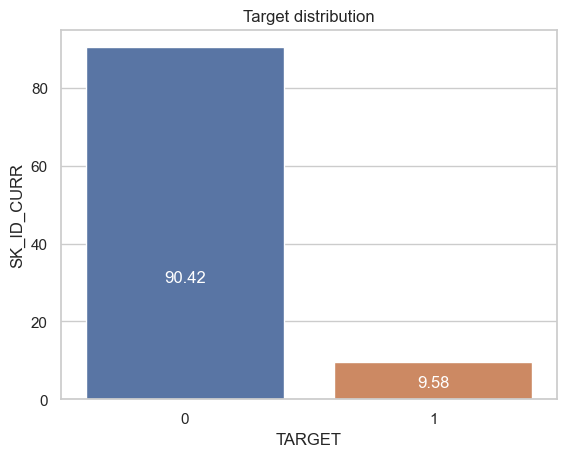

In [108]:
#Target distribution:
grouped_target = application_df_cleaned.groupby('TARGET')['SK_ID_CURR'].count().reset_index()
grouped_target['SK_ID_CURR'] = grouped_target['SK_ID_CURR'] / len(application_df_cleaned) * 100

sns_bar = sns.barplot(x='TARGET', y='SK_ID_CURR',
                 data=grouped_target,
                 errwidth=0)

#formatting to add data labels
for index, row in grouped_target.iterrows():
    sns_bar.text(row.name, row.SK_ID_CURR / 3, round(row.SK_ID_CURR, 2),
            color='white', ha='center')
sns_bar.set_title('Target distribution')
# Custom x-axis labels
custom_labels = ['Label 1', 'Label 2', 'Label 3', 'Label 4', 'Label 5']
#plt.set_xticklabels(custom_labels, rotation=45, ha='right')
plt.ylabel('Percentage of observations')
plt.show()

> Distribution of categorical variables that has high correlation with the target based on the main table applicant_df. 

In [109]:
#function for bar plots
def plot_categorical_variables_bar(data, column_name, figsize = (15,10), 
percentage_display = True, plot_defaulter = True, rotation = 1, horizontal_adjust = 0, fontsize_percent = 'xx-small'):
    '''
    Function to plot Categorical Variables Bar Plots

    Inputs:
        data: DataFrame
            The DataFrame from which to plot
        column_name: str
            Column's name whose distribution is to be plotted
        figsize: tuple, default = (18,6)
            Size of the figure to be plotted
        percentage_display: bool, default = True
            Whether to display the percentages on top of Bars in Bar-Plot
        plot_defaulter: bool
            Whether to plot the Bar Plots for Defaulters or not
        rotation: int, default = 1
            Degree of rotation for x-tick labels
        horizontal_adjust: int, default = 0
            Horizontal adjustment parameter for percentages displayed on the top of Bars of Bar-Plot
        fontsize_percent: str, default = 'xx-small'
            Fontsize for percentage Display

    '''
    print(f"Total Number of unique categories of {column_name} = {len(data[column_name].unique())}")

    plt.figure(figsize = figsize, tight_layout = False)
    sns.set(style = 'whitegrid', font_scale = 1)

    #plotting overall distribution of category
    plt.subplot(1,2,1)
    data_to_plot = data[column_name].value_counts().sort_values(ascending = False)
    ax = sns.barplot(x = data_to_plot.index, y = data_to_plot, palette = 'Set1')

    if percentage_display:
        total_datapoints = len(data[column_name].dropna())
        for p in ax.patches:
            ax.text(p.get_x() + horizontal_adjust, p.get_height() + 0.005 * total_datapoints, '{:1.02f}%'.format(p.get_height() * 100 / total_datapoints), fontsize = fontsize_percent)

    plt.xlabel(column_name, labelpad = 5)
    plt.title(f'Distribution of {column_name}', pad = 15)
    plt.xticks(rotation = rotation, fontsize = 10)
    plt.ylabel('Counts')

    #plotting distribution of category for Defaulters
    if plot_defaulter:
        percentage_defaulter_per_category = (data[column_name][data.TARGET == 1].value_counts() * 100 / data[column_name].value_counts()).dropna().sort_values(ascending = False)

        plt.subplot(1,2,2)
        sns.barplot(x = percentage_defaulter_per_category.index, y = percentage_defaulter_per_category, palette = 'pastel')
        plt.ylabel('Percentage of Defaulter per category')
        plt.xlabel(column_name, labelpad = 5)
        plt.xticks(rotation = rotation, fontsize = 10)
        plt.title(f'Percentage of Defaulters for each category of {column_name}', pad = 20)
    plt.show()

Total Number of unique categories of CODE_GENDER = 2


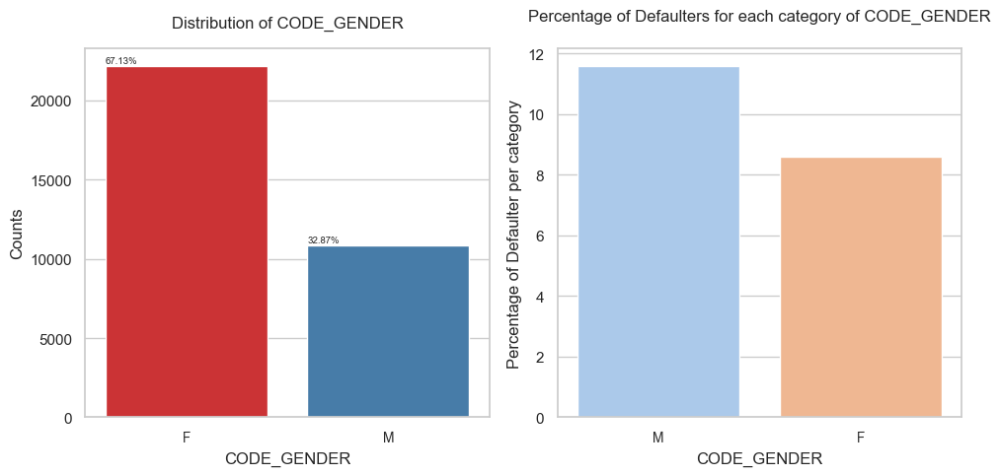

In [110]:
#CODE_GENDER:
    # 65% of the clients are female and 35% are male.
    # Male has a higher percentage of defaulting amounting to 11%
plot_categorical_variables_bar(application_df_cleaned, 'CODE_GENDER', figsize = (10,5))

Total Number of unique categories of NAME_INCOME_TYPE = 2


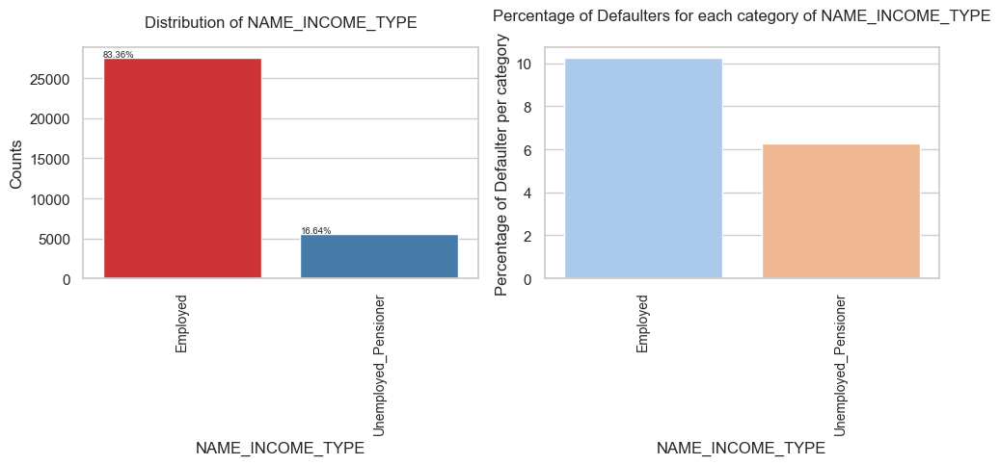

In [111]:
#NAME_INCOME_TYPE:
    #Half of the clients are working (51%), followed by commercial associates (23%).
    #Very small percentage applied for clients under Maternity leave, Businessman, student and unemployed.
    #40% of defaulters are in Maternity leave, followed by unemployed.
plot_categorical_variables_bar(application_df_cleaned, 'NAME_INCOME_TYPE', figsize = (10,5), rotation = 90)

Total Number of unique categories of NAME_EDUCATION_TYPE = 3


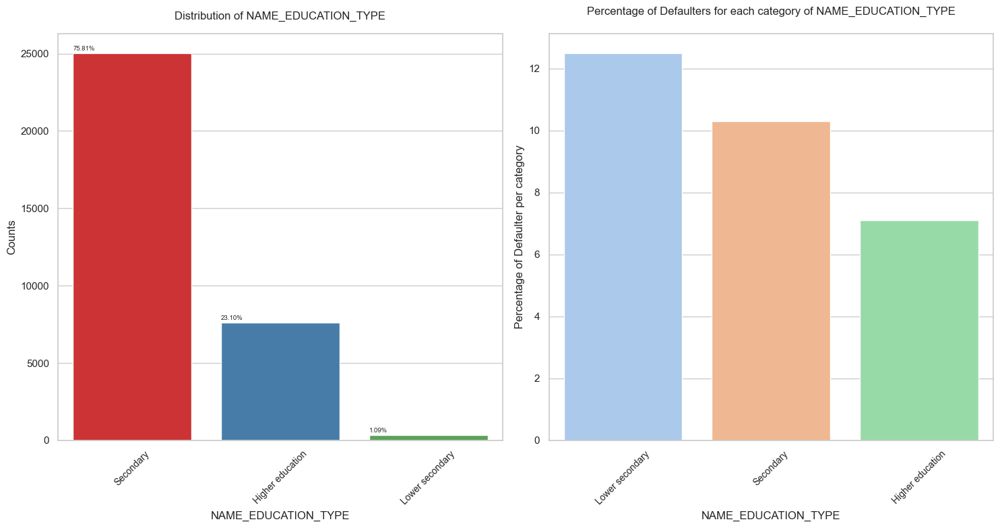

In [112]:
#NAME_EDUCATION_TYPE:
    #71% of the loan applicants have completed Secondary / Secondary special education level, followed by Higher Education with 24%.
    #Highest default rate is seen for lower secondary followed by secondary education level.
plot_categorical_variables_bar(application_df_cleaned, 'NAME_EDUCATION_TYPE', figsize = (15,8), rotation=45)

Total Number of unique categories of OCCUPATION_TYPE = 7


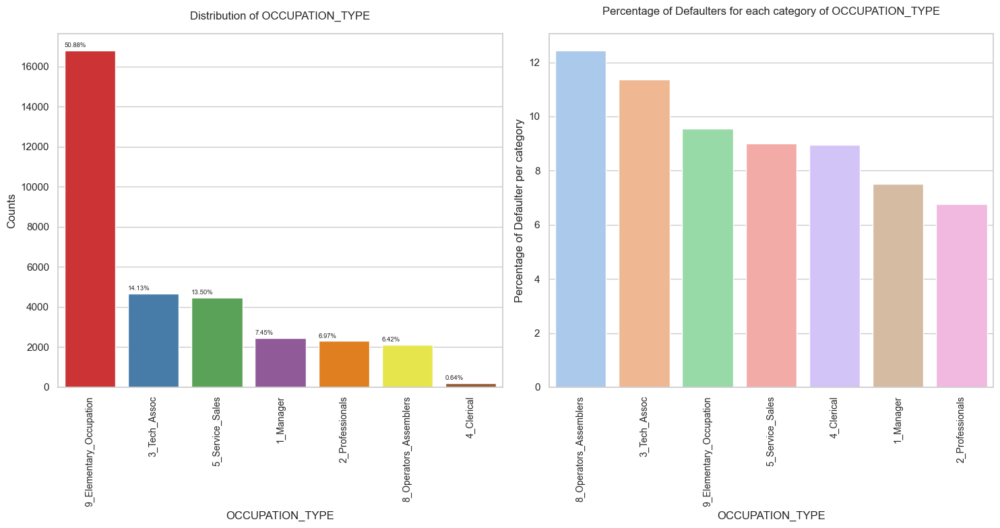

In [113]:
#OCCUPATION_TYPE:
    # The majority of the applicants have occupation type Laborers (26%), followed by sales staff and core staff.
    # Based on the default percentage, low-skill laborers are highest followed by Drivers, and Waiters/Barmen staff.
plot_categorical_variables_bar(application_df_cleaned, 'OCCUPATION_TYPE', figsize = (15,8), rotation=90)

Total Number of unique categories of REGION_RATING_CLIENT_W_CITY = 3


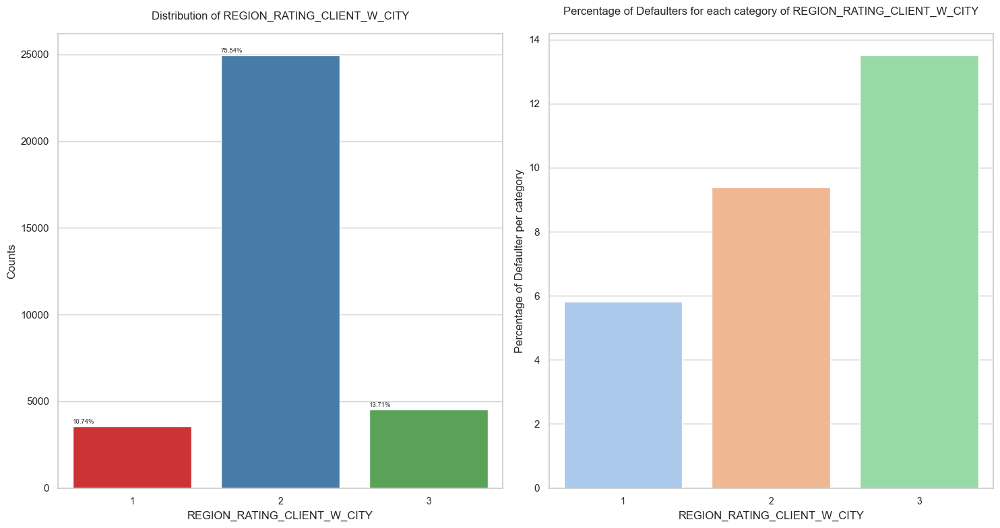

In [114]:
plot_categorical_variables_bar(application_df_cleaned, 'REGION_RATING_CLIENT_W_CITY', figsize = (15,8))

Total Number of unique categories of NAME_HOUSING_TYPE = 6


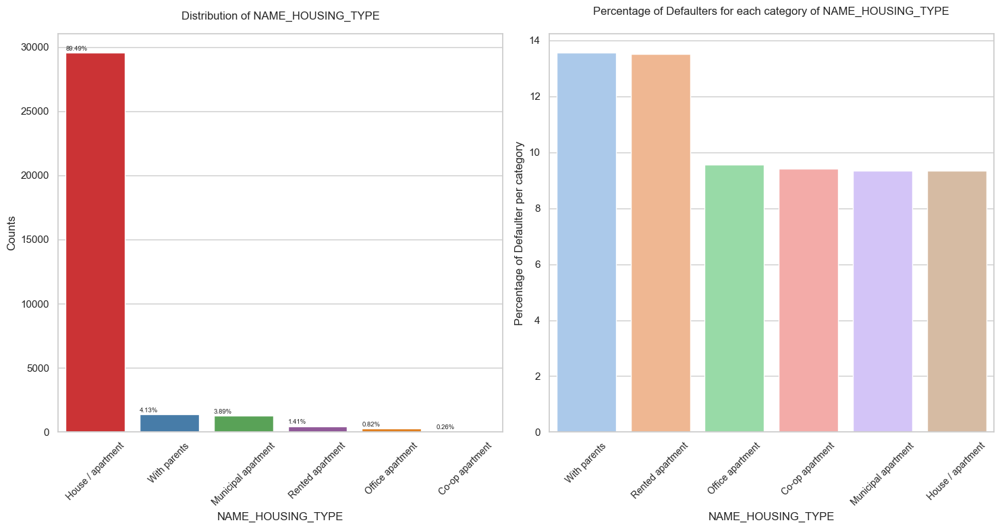

In [227]:
plot_categorical_variables_bar(application_df_cleaned, 'NAME_HOUSING_TYPE', figsize = (15,8), rotation=45)

Total Number of unique categories of NAME_FAMILY_STATUS = 3


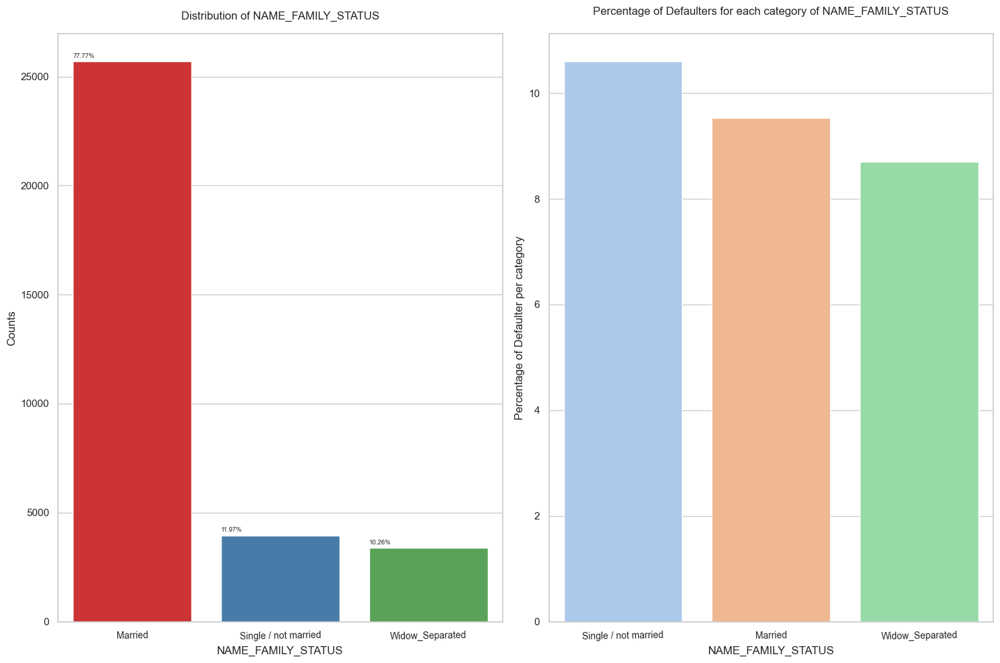

In [116]:
plot_categorical_variables_bar(application_df_cleaned, 'NAME_FAMILY_STATUS')

> Distribution of numerical variables that has high correlation with the target

Text(0.5, 1.0, 'Box plot by Target for EXT_SOURCE_1')

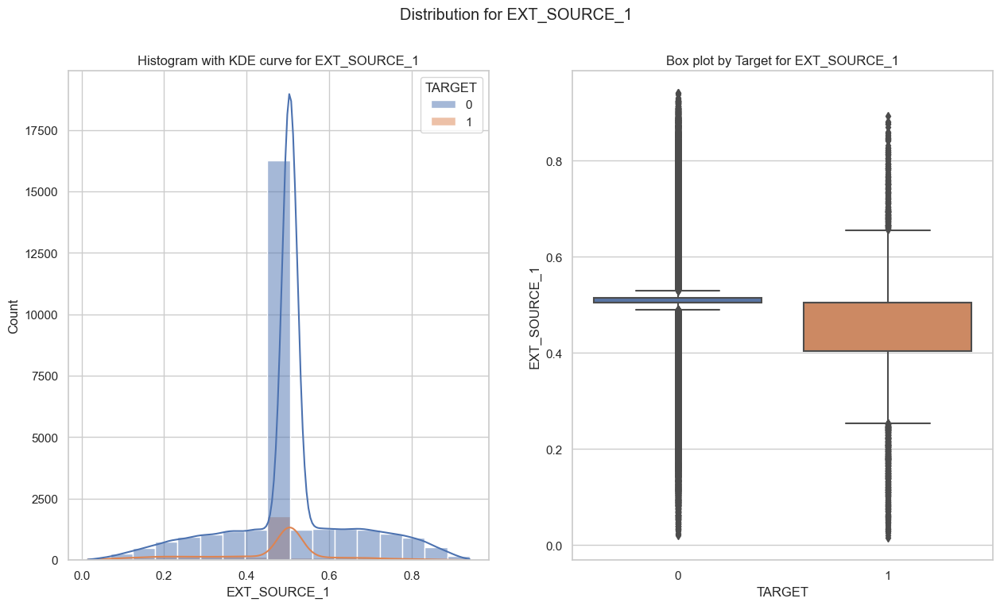

In [220]:
#Distribution for EXT_SOURCE_1
fig, axes = plt.subplots(1, 2, figsize = (15,8))
fig.suptitle('Distribution for EXT_SOURCE_1')

sns.histplot(ax=axes[0], data = application_df_cleaned, x = 'EXT_SOURCE_1', hue = 'TARGET', kde=True)
axes[0].set_title('Histogram with KDE curve for EXT_SOURCE_1')

sns.boxplot(ax=axes[1], x = 'TARGET', y = 'EXT_SOURCE_1', data = application_df_cleaned)
axes[1].set_title('Box plot by Target for EXT_SOURCE_1')

Text(0.5, 1.0, 'Box plot by Target for EXT_SOURCE_2')

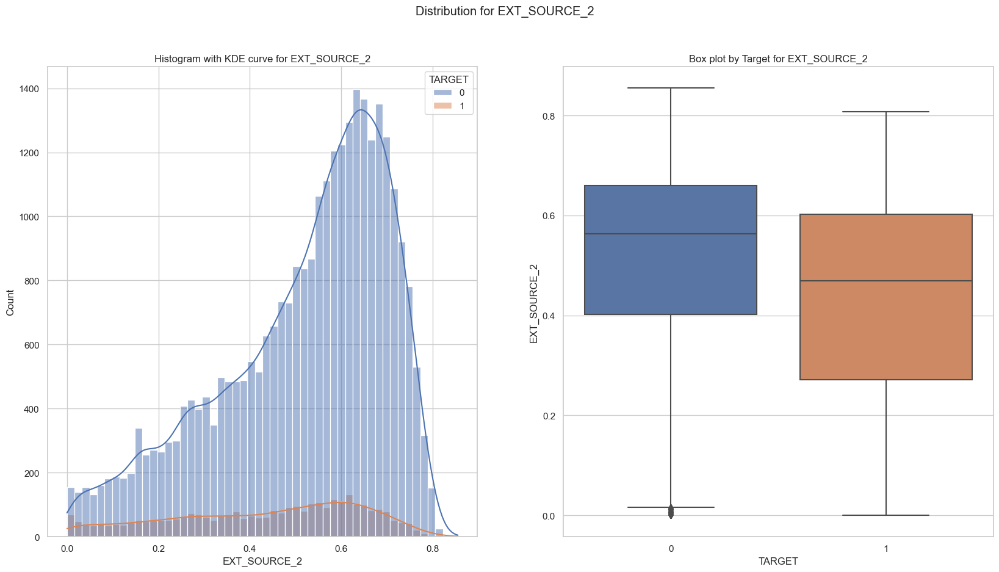

In [221]:
#Distribution for EXT_SOURCE_2
fig, axes = plt.subplots(1, 2, figsize = (20,10))
fig.suptitle('Distribution for EXT_SOURCE_2')

sns.histplot(ax=axes[0], data = application_df_cleaned, x = 'EXT_SOURCE_2', hue = 'TARGET', kde=True)
axes[0].set_title('Histogram with KDE curve for EXT_SOURCE_2')

sns.boxplot(ax=axes[1], x = 'TARGET', y = 'EXT_SOURCE_2', data = application_df_cleaned)
axes[1].set_title('Box plot by Target for EXT_SOURCE_2')

Text(0.5, 1.0, 'Box plot by Target for EXT_SOURCE_3')

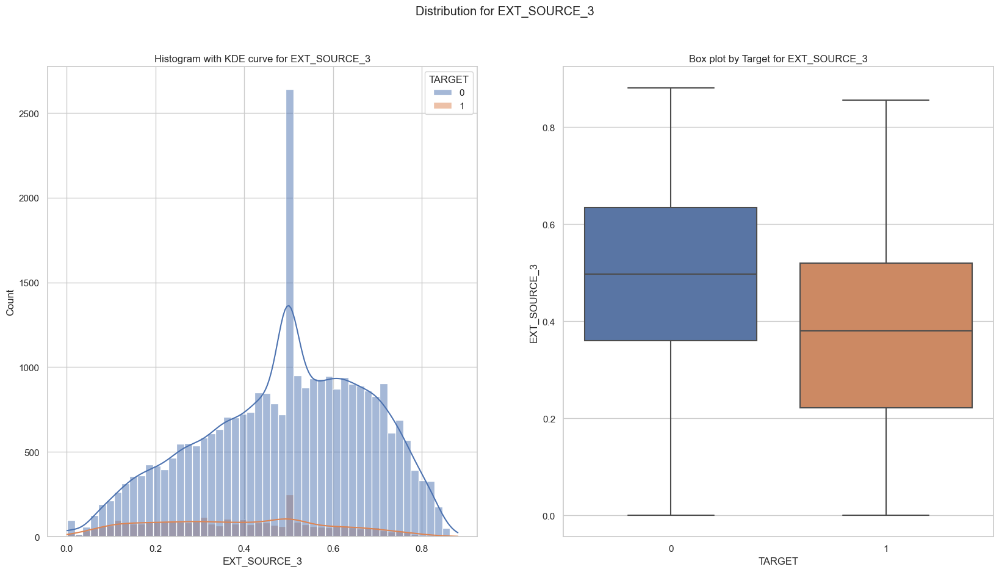

In [222]:
#Distribution for EXT_SOURCE_3
fig, axes = plt.subplots(1, 2, figsize = (20,10))
fig.suptitle('Distribution for EXT_SOURCE_3')

sns.histplot(ax=axes[0], data = application_df_cleaned, x = 'EXT_SOURCE_3', hue = 'TARGET', kde=True)
axes[0].set_title('Histogram with KDE curve for EXT_SOURCE_3')

sns.boxplot(ax=axes[1], x = 'TARGET', y = 'EXT_SOURCE_3', data = application_df_cleaned)
axes[1].set_title('Box plot by Target for EXT_SOURCE_3')

Text(0.5, 1.0, 'Box plot by Target for AGE')

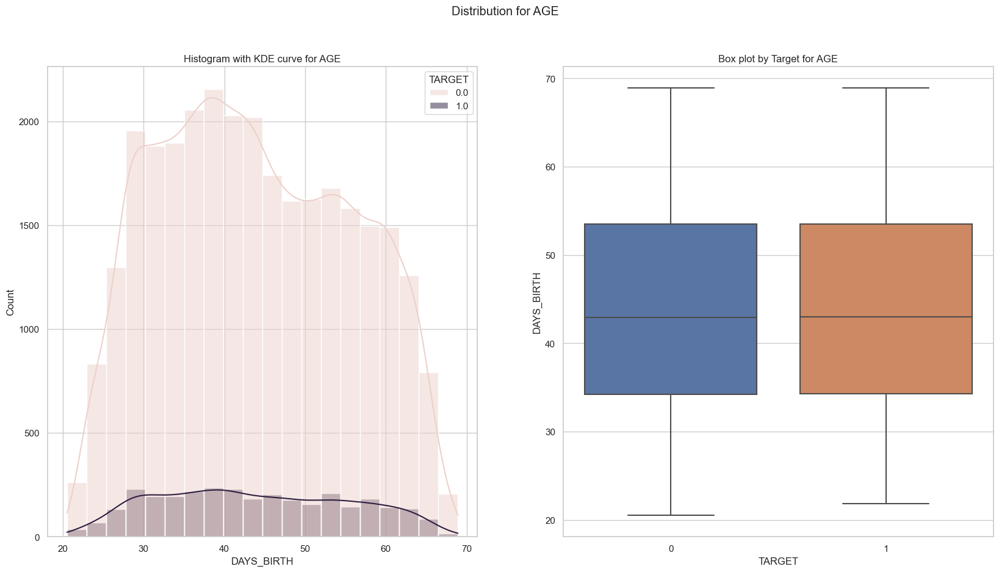

In [223]:
#Distribution for DAYS_BIRTH or AGE
    #divided by 365, multiplied by -1
fig, axes = plt.subplots(1, 2, figsize = (20,10))
fig.suptitle('Distribution for AGE')

sns.histplot(ax=axes[0], data = application_df_cleaned, x = (application_df['DAYS_BIRTH']/365*(-1)) , hue = 'TARGET', kde=True, bins=20)
axes[0].set_title('Histogram with KDE curve for AGE')

sns.boxplot(ax=axes[1], x = 'TARGET', y = (application_df['DAYS_BIRTH']/365*(-1)), data = application_df_cleaned)
axes[1].set_title('Box plot by Target for AGE')

Text(0.5, 1.0, 'Box plot by Target for OWN_CAR_AGE')

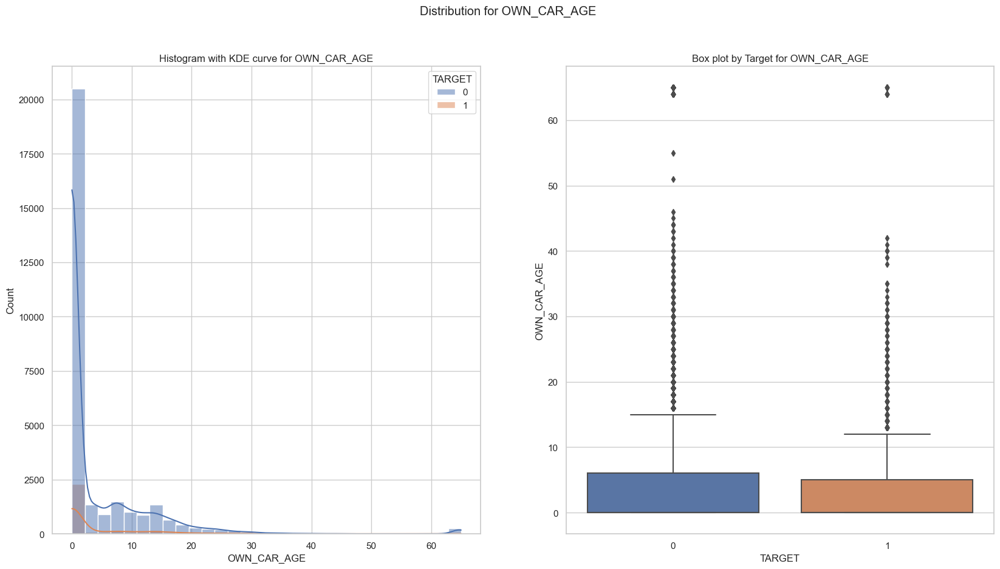

In [224]:
#Distribution for OWN_CAR_AGE
fig, axes = plt.subplots(1, 2, figsize = (20,10))
fig.suptitle('Distribution for OWN_CAR_AGE')

sns.histplot(ax=axes[0], data = application_df_cleaned, x = 'OWN_CAR_AGE', hue = 'TARGET', kde=True, bins = 30)
axes[0].set_title('Histogram with KDE curve for OWN_CAR_AGE')

sns.boxplot(ax=axes[1], x = 'TARGET', y = 'OWN_CAR_AGE', data = application_df_cleaned)
axes[1].set_title('Box plot by Target for OWN_CAR_AGE')

Text(0.5, 1.0, 'Box plot by Target for DAYS_LAST_PHONE_CHANGE')

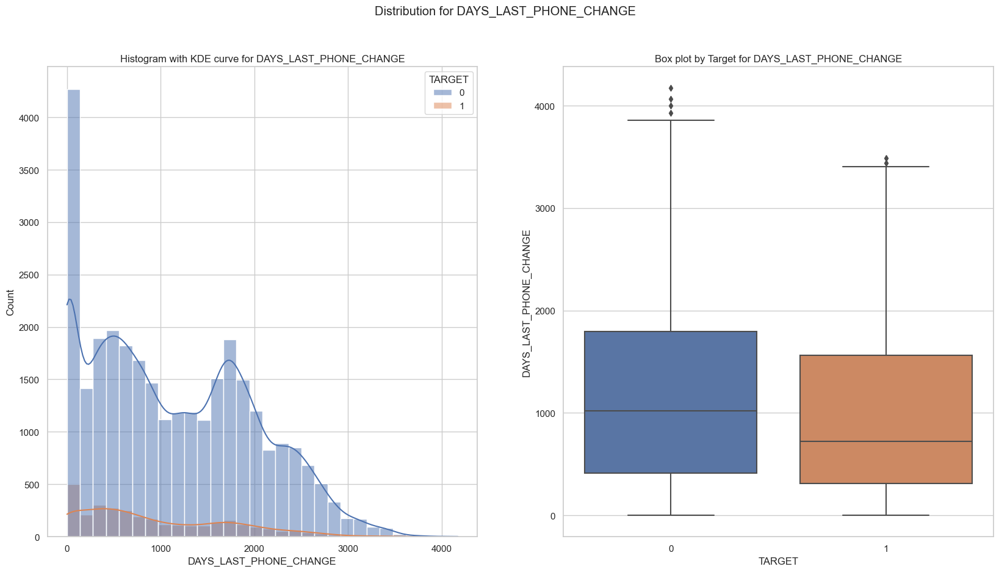

In [122]:
#Distribution for DAYS_LAST_PHONE_CHANGE
fig, axes = plt.subplots(1, 2, figsize = (20,10))
fig.suptitle('Distribution for DAYS_LAST_PHONE_CHANGE')

sns.histplot(ax=axes[0], data = application_df_cleaned, x = 'DAYS_LAST_PHONE_CHANGE', hue = 'TARGET', kde=True, bins=30)
axes[0].set_title('Histogram with KDE curve for DAYS_LAST_PHONE_CHANGE')

sns.boxplot(ax=axes[1], x = 'TARGET', y = 'DAYS_LAST_PHONE_CHANGE', data = application_df_cleaned)
axes[1].set_title('Box plot by Target for DAYS_LAST_PHONE_CHANGE')

Text(0.5, 1.0, 'Box plot by Target for DAYS_EMPLOYED (Years)')

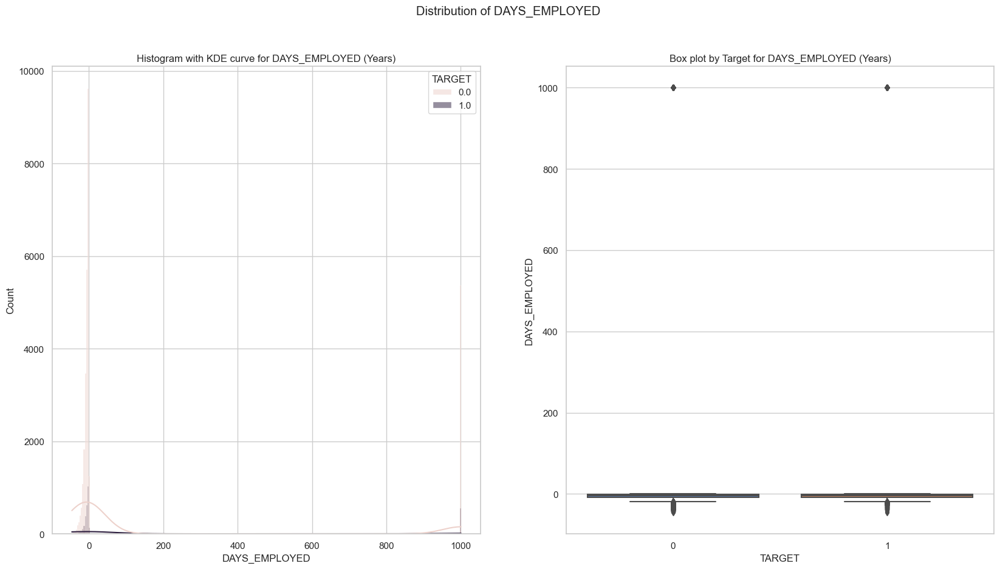

In [225]:
#Distribution for DAYS_EMPLOYED converted to years
    #divided by 365, multiplied by -1
fig, axes = plt.subplots(1, 2, figsize = (20,10))
fig.suptitle('Distribution of DAYS_EMPLOYED')

sns.histplot(ax=axes[0], data = application_df_cleaned, x = (application_df['DAYS_EMPLOYED']/365) , hue = 'TARGET', kde=True, bins = 300)
axes[0].set_title('Histogram with KDE curve for DAYS_EMPLOYED (Years)')

sns.boxplot(ax=axes[1], x = 'TARGET', y = (application_df['DAYS_EMPLOYED']/365), data = application_df_cleaned)
axes[1].set_title('Box plot by Target for DAYS_EMPLOYED (Years)')

Text(0.5, 1.0, 'Box plot by Target for APARTMENTS_MEDI')

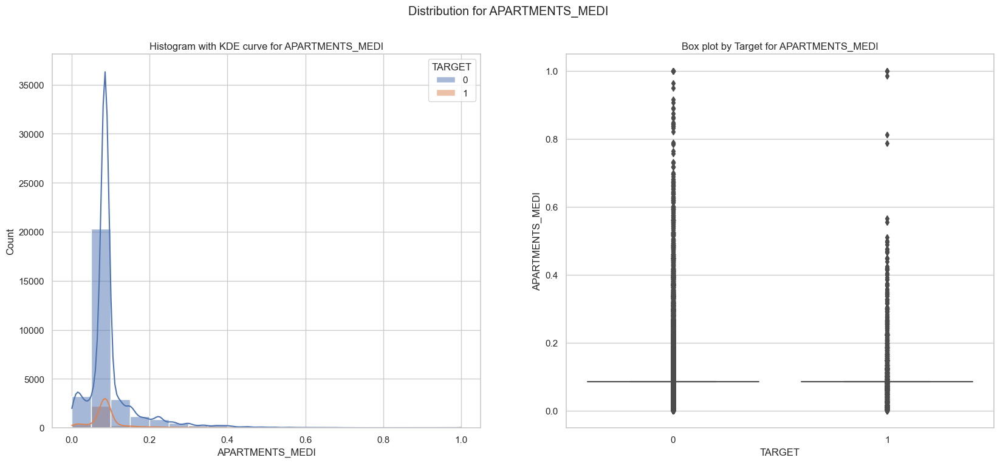

In [125]:
#Distribution for APARTMENTS_MEDI
fig, axes = plt.subplots(1, 2, figsize = (20,8))
fig.suptitle('Distribution for APARTMENTS_MEDI')

sns.histplot(ax=axes[0], data = application_df_cleaned, x = 'APARTMENTS_MEDI', hue = 'TARGET', kde=True, bins=20)
axes[0].set_title('Histogram with KDE curve for APARTMENTS_MEDI')

sns.boxplot(ax=axes[1], x = 'TARGET', y = 'APARTMENTS_MEDI', data = application_df_cleaned)
axes[1].set_title('Box plot by Target for APARTMENTS_MEDI')

Text(0.5, 1.0, 'Box plot by Target for YEARS_BUILD_MEDI')

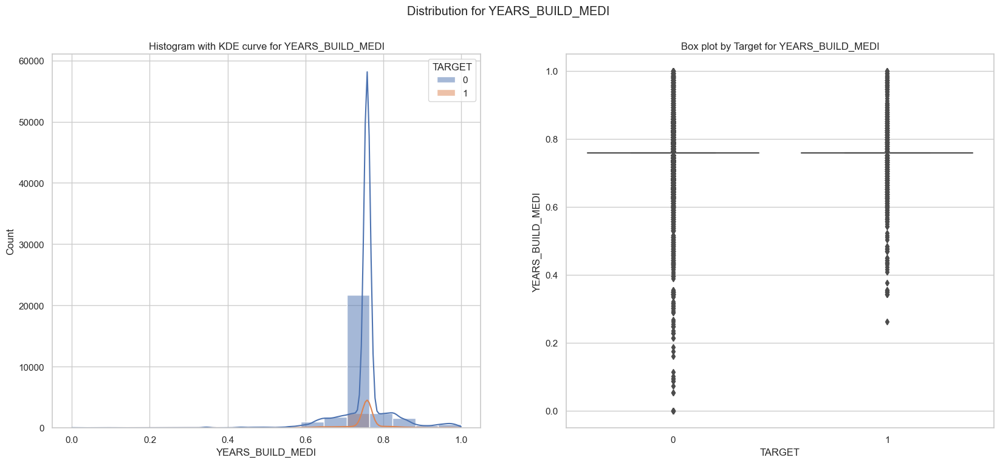

In [126]:
#Distribution for YEARS_BUILD_MEDI
fig, axes = plt.subplots(1, 2, figsize = (20,8))
fig.suptitle('Distribution for YEARS_BUILD_MEDI')

sns.histplot(ax=axes[0], data = application_df_cleaned, x = 'YEARS_BUILD_MEDI', hue = 'TARGET', kde=True)
axes[0].set_title('Histogram with KDE curve for YEARS_BUILD_MEDI')

sns.boxplot(ax=axes[1], x = 'TARGET', y = 'YEARS_BUILD_MEDI', data = application_df_cleaned)
axes[1].set_title('Box plot by Target for YEARS_BUILD_MEDI')

Text(0.5, 1.0, 'Box plot by Target for LANDAREA_MEDI')

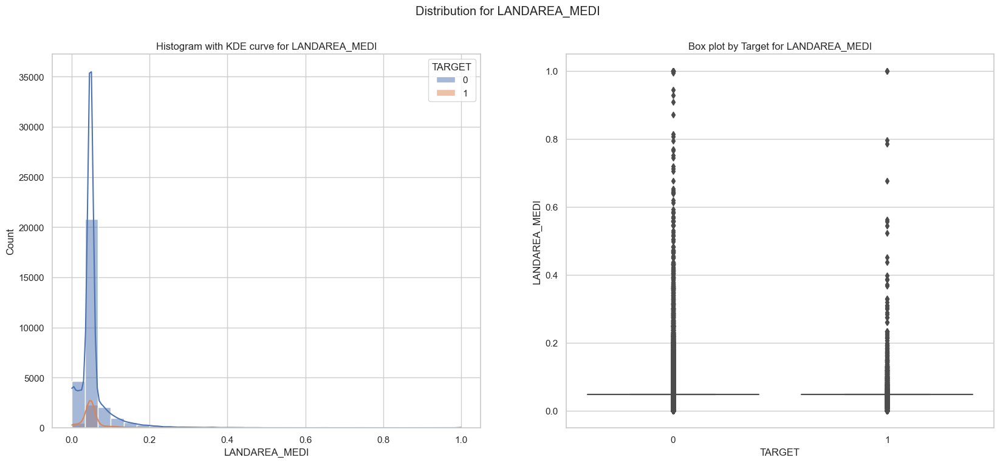

In [127]:
#Distribution for LANDAREA_MEDI
fig, axes = plt.subplots(1, 2, figsize = (20,8))
fig.suptitle('Distribution for LANDAREA_MEDI')

sns.histplot(ax=axes[0], data = application_df_cleaned, x = 'LANDAREA_MEDI', hue = 'TARGET', kde=True, bins=30)
axes[0].set_title('Histogram with KDE curve for LANDAREA_MEDI')

sns.boxplot(ax=axes[1], x = 'TARGET', y = 'LANDAREA_MEDI', data = application_df_cleaned)
axes[1].set_title('Box plot by Target for LANDAREA_MEDI')

Text(0.5, 1.0, 'Box plot by Target for OBS_30_CNT_SOCIAL_CIRCLE')

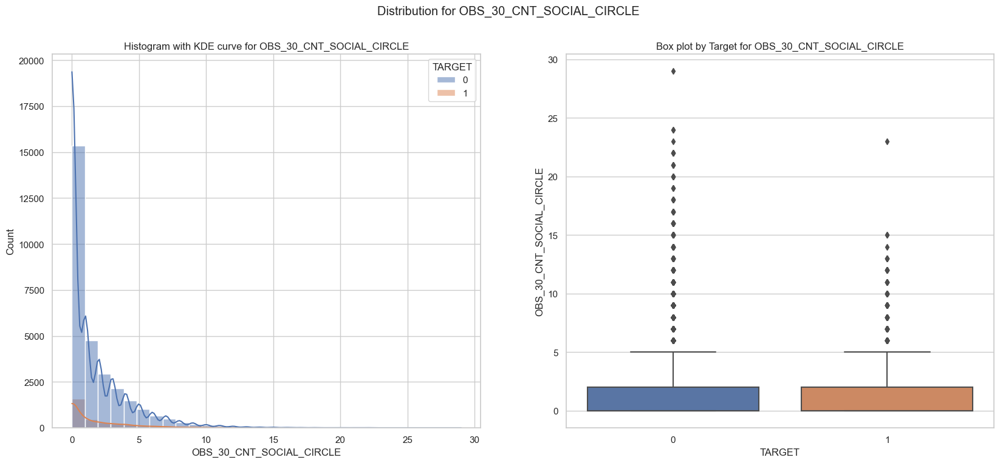

In [128]:
#Distribution for OBS_30_CNT_SOCIAL_CIRCLE
fig, axes = plt.subplots(1, 2, figsize = (20,8))
fig.suptitle('Distribution for OBS_30_CNT_SOCIAL_CIRCLE')

sns.histplot(ax=axes[0], data = application_df_cleaned, x = 'OBS_30_CNT_SOCIAL_CIRCLE', hue = 'TARGET', kde=True, bins=30)
axes[0].set_title('Histogram with KDE curve for OBS_30_CNT_SOCIAL_CIRCLE')

sns.boxplot(ax=axes[1], x = 'TARGET', y = 'OBS_30_CNT_SOCIAL_CIRCLE', data = application_df_cleaned)
axes[1].set_title('Box plot by Target for OBS_30_CNT_SOCIAL_CIRCLE')

Text(0.5, 1.0, 'Box plot by Target for DAYS_LAST_PHONE_CHANGE')

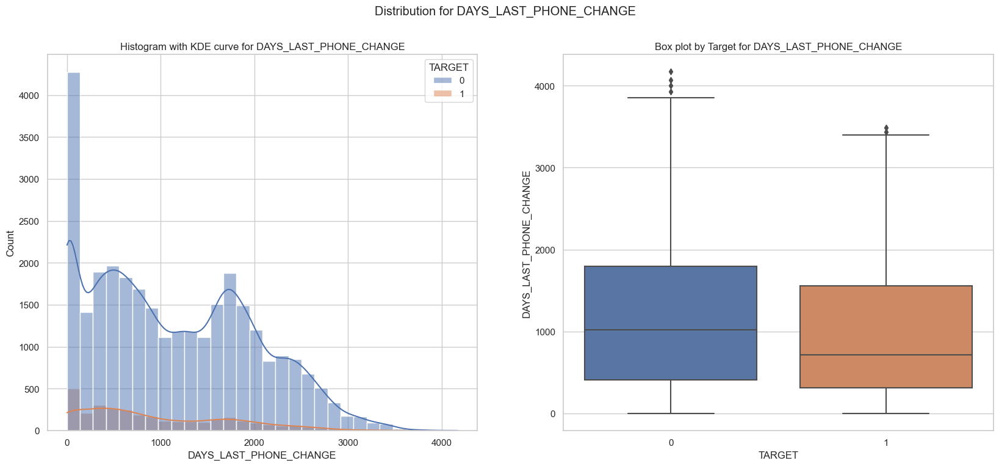

In [129]:
#Distribution for DAYS_LAST_PHONE_CHANGE
fig, axes = plt.subplots(1, 2, figsize = (20,8))
fig.suptitle('Distribution for DAYS_LAST_PHONE_CHANGE')

sns.histplot(ax=axes[0], data = application_df_cleaned, x = 'DAYS_LAST_PHONE_CHANGE', hue = 'TARGET', kde=True, bins=30)
axes[0].set_title('Histogram with KDE curve for DAYS_LAST_PHONE_CHANGE')

sns.boxplot(ax=axes[1], x = 'TARGET', y = 'DAYS_LAST_PHONE_CHANGE', data = application_df_cleaned)
axes[1].set_title('Box plot by Target for DAYS_LAST_PHONE_CHANGE')

Text(0.5, 1.0, 'Box plot by Target for AMT_REQ_CREDIT_BUREAU_HOUR')

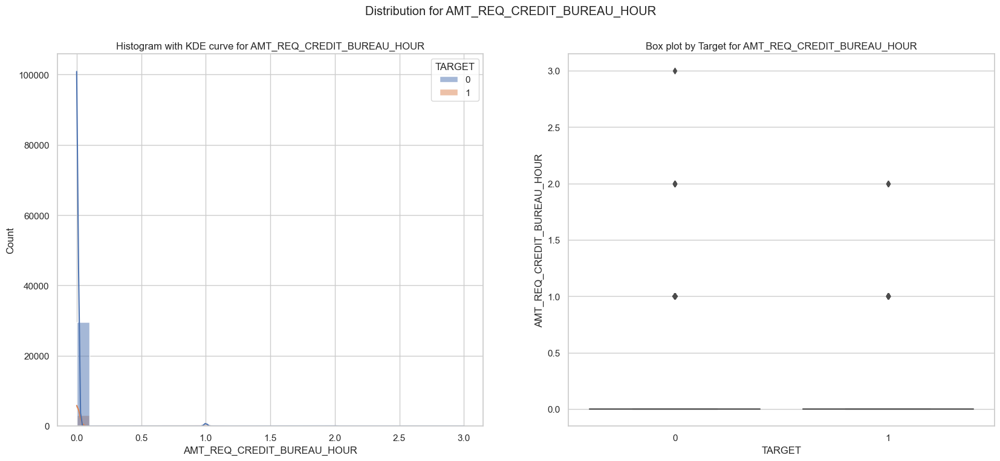

In [226]:
#Distribution for AMT_REQ_CREDIT_BUREAU_HOUR
fig, axes = plt.subplots(1, 2, figsize = (20,8))
fig.suptitle('Distribution for AMT_REQ_CREDIT_BUREAU_HOUR')

sns.histplot(ax=axes[0], data = application_df_cleaned, x = 'AMT_REQ_CREDIT_BUREAU_HOUR', hue = 'TARGET', kde=True, bins=30)
axes[0].set_title('Histogram with KDE curve for AMT_REQ_CREDIT_BUREAU_HOUR')

sns.boxplot(ax=axes[1], x = 'TARGET', y = 'AMT_REQ_CREDIT_BUREAU_HOUR', data = application_df_cleaned)
axes[1].set_title('Box plot by Target for AMT_REQ_CREDIT_BUREAU_HOUR')

Text(0.5, 1.0, 'Box plot by Target for AMT_REQ_CREDIT_BUREAU_YEAR')

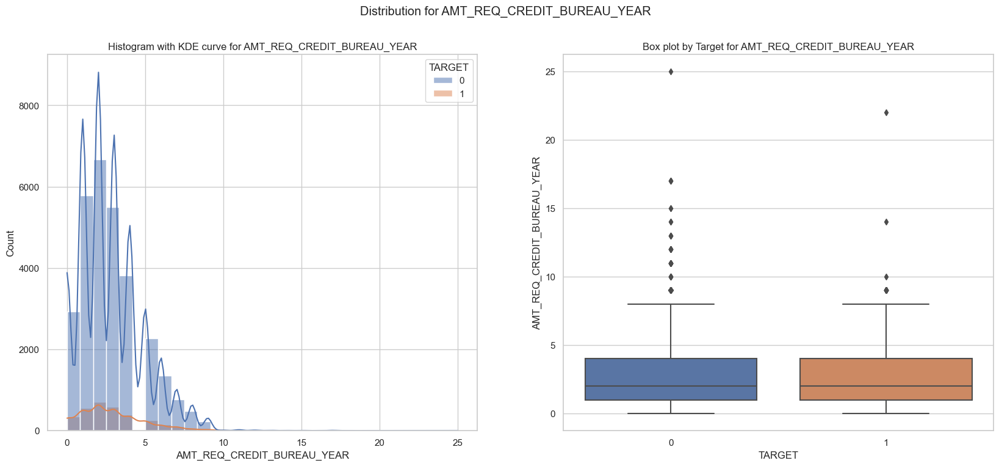

In [130]:
#Distribution for AMT_REQ_CREDIT_BUREAU_YEAR
fig, axes = plt.subplots(1, 2, figsize = (20,8))
fig.suptitle('Distribution for AMT_REQ_CREDIT_BUREAU_YEAR')

sns.histplot(ax=axes[0], data = application_df_cleaned, x = 'AMT_REQ_CREDIT_BUREAU_YEAR', hue = 'TARGET', kde=True, bins=30)
axes[0].set_title('Histogram with KDE curve for AMT_REQ_CREDIT_BUREAU_YEAR')

sns.boxplot(ax=axes[1], x = 'TARGET', y = 'AMT_REQ_CREDIT_BUREAU_YEAR', data = application_df_cleaned)
axes[1].set_title('Box plot by Target for AMT_REQ_CREDIT_BUREAU_YEAR')

Text(0.5, 1.0, 'Box plot by Target for AMT_CREDIT_TO_ANNUITY')

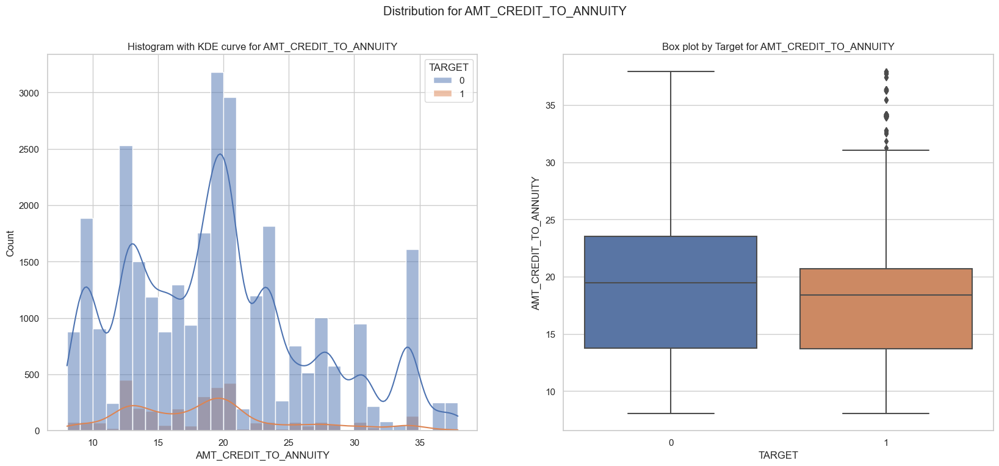

In [131]:
#Distribution for AMT_CREDIT_TO_ANNUITY
fig, axes = plt.subplots(1, 2, figsize = (20,8))
fig.suptitle('Distribution for AMT_CREDIT_TO_ANNUITY')

sns.histplot(ax=axes[0], data = application_df_cleaned, x = 'AMT_CREDIT_TO_ANNUITY', hue = 'TARGET', kde=True, bins=30)
axes[0].set_title('Histogram with KDE curve for AMT_CREDIT_TO_ANNUITY')

sns.boxplot(ax=axes[1], x = 'TARGET', y = 'AMT_CREDIT_TO_ANNUITY', data = application_df_cleaned)
axes[1].set_title('Box plot by Target for AMT_CREDIT_TO_ANNUITY')

Text(0.5, 1.0, 'Box plot by Target for CB_PCT_ACTIVE_LOANS')

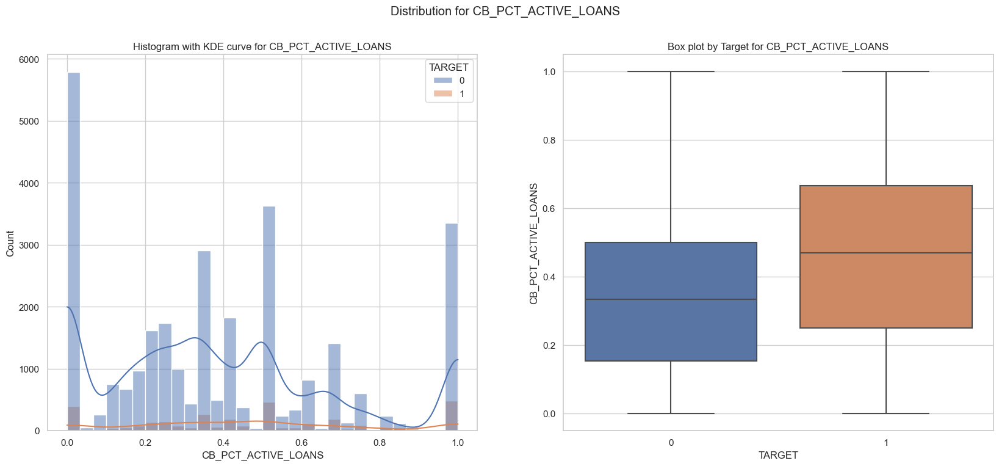

In [132]:
#Distribution for CB_PCT_ACTIVE_LOANS
fig, axes = plt.subplots(1, 2, figsize = (20,8))
fig.suptitle('Distribution for CB_PCT_ACTIVE_LOANS')

sns.histplot(ax=axes[0], data = application_df_cleaned, x = 'CB_PCT_ACTIVE_LOANS', hue = 'TARGET', kde=True, bins=30)
axes[0].set_title('Histogram with KDE curve for CB_PCT_ACTIVE_LOANS')

sns.boxplot(ax=axes[1], x = 'TARGET', y = 'CB_PCT_ACTIVE_LOANS', data = application_df_cleaned)
axes[1].set_title('Box plot by Target for CB_PCT_ACTIVE_LOANS')

Text(0.5, 1.0, 'Box plot by Target for CB_UNSEC_LOAN')

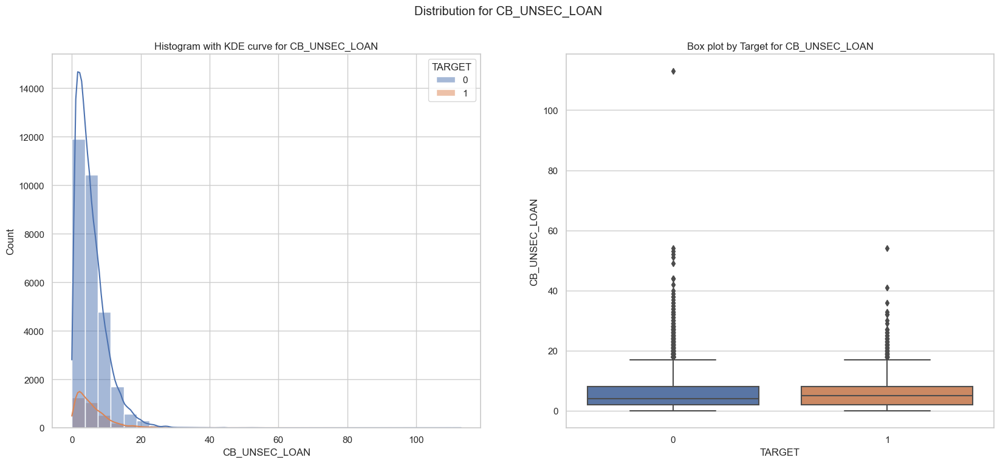

In [133]:
#Distribution for CB_UNSEC_LOAN
fig, axes = plt.subplots(1, 2, figsize = (20,8))
fig.suptitle('Distribution for CB_UNSEC_LOAN')

sns.histplot(ax=axes[0], data = application_df_cleaned, x = 'CB_UNSEC_LOAN', hue = 'TARGET', kde=True, bins=30)
axes[0].set_title('Histogram with KDE curve for CB_UNSEC_LOAN')

sns.boxplot(ax=axes[1], x = 'TARGET', y = 'CB_UNSEC_LOAN', data = application_df_cleaned)
axes[1].set_title('Box plot by Target for CB_UNSEC_LOAN')

Text(0.5, 1.0, 'Box plot by Target for CB_MIN_DAYS_CREDIT')

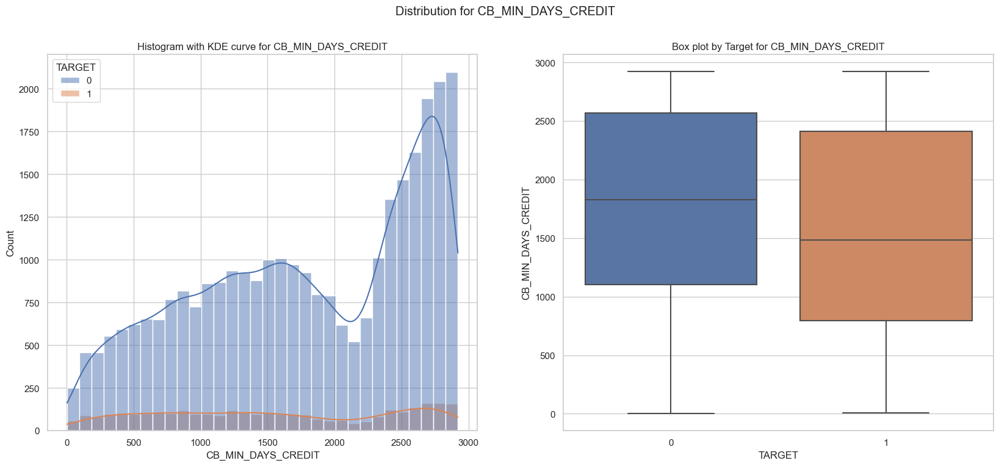

In [134]:
#Distribution for CB_MIN_DAYS_CREDIT
fig, axes = plt.subplots(1, 2, figsize = (20,8))
fig.suptitle('Distribution for CB_MIN_DAYS_CREDIT')

sns.histplot(ax=axes[0], data = application_df_cleaned, x = 'CB_MIN_DAYS_CREDIT', hue = 'TARGET', kde=True)
axes[0].set_title('Histogram with KDE curve for CB_MIN_DAYS_CREDIT')

sns.boxplot(ax=axes[1], x = 'TARGET', y = 'CB_MIN_DAYS_CREDIT', data = application_df_cleaned)
axes[1].set_title('Box plot by Target for CB_MIN_DAYS_CREDIT')

Text(0.5, 1.0, 'Box plot by Target for CB_AVG_DAYS_CREDIT_ENDDATE')

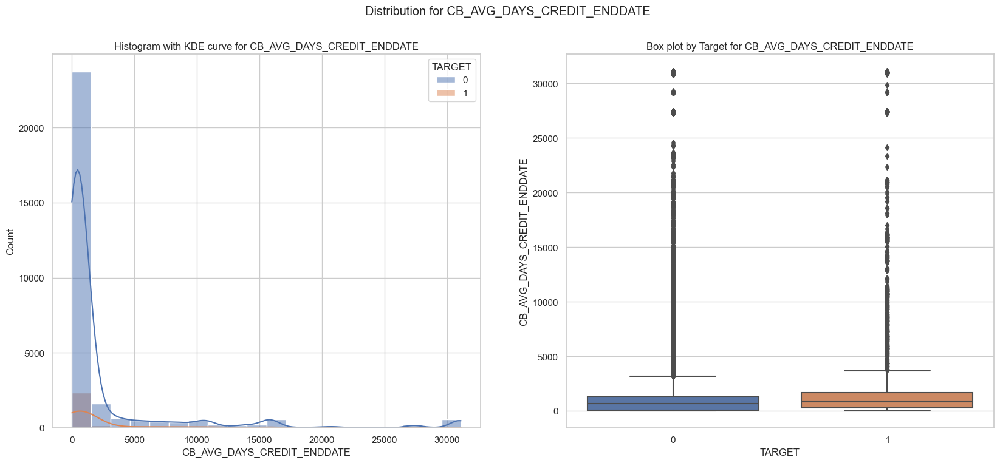

In [135]:
#Distribution for CB_AVG_DAYS_CREDIT_ENDDATE
fig, axes = plt.subplots(1, 2, figsize = (20,8))
fig.suptitle('Distribution for CB_AVG_DAYS_CREDIT_ENDDATE')

sns.histplot(ax=axes[0], data = application_df_cleaned, x = 'CB_AVG_DAYS_CREDIT_ENDDATE', hue = 'TARGET', kde=True, bins=20)
axes[0].set_title('Histogram with KDE curve for CB_AVG_DAYS_CREDIT_ENDDATE')

sns.boxplot(ax=axes[1], x = 'TARGET', y = 'CB_AVG_DAYS_CREDIT_ENDDATE', data = application_df_cleaned)
axes[1].set_title('Box plot by Target for CB_AVG_DAYS_CREDIT_ENDDATE')

Text(0.5, 1.0, 'Box plot by Target for CB_TOTAL_CNT_CREDIT_PROLONG')

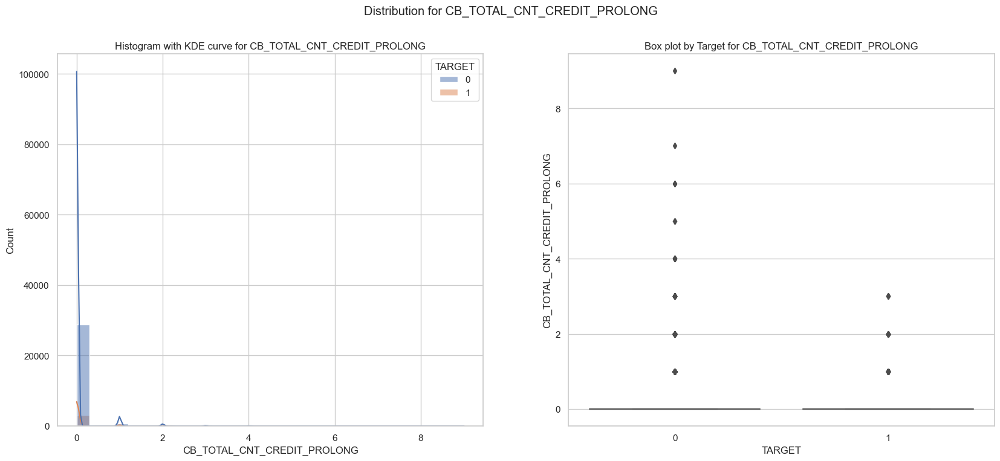

In [136]:
#Distribution for CB_TOTAL_CNT_CREDIT_PROLONG
fig, axes = plt.subplots(1, 2, figsize = (20,8))
fig.suptitle('Distribution for CB_TOTAL_CNT_CREDIT_PROLONG')

sns.histplot(ax=axes[0], data = application_df_cleaned, x = 'CB_TOTAL_CNT_CREDIT_PROLONG', hue = 'TARGET', kde=True, bins=30)
axes[0].set_title('Histogram with KDE curve for CB_TOTAL_CNT_CREDIT_PROLONG')

sns.boxplot(ax=axes[1], x = 'TARGET', y = 'CB_TOTAL_CNT_CREDIT_PROLONG', data = application_df_cleaned)
axes[1].set_title('Box plot by Target for CB_TOTAL_CNT_CREDIT_PROLONG')

Text(0.5, 1.0, 'Box plot by Target for CB_PCT_DEBT')

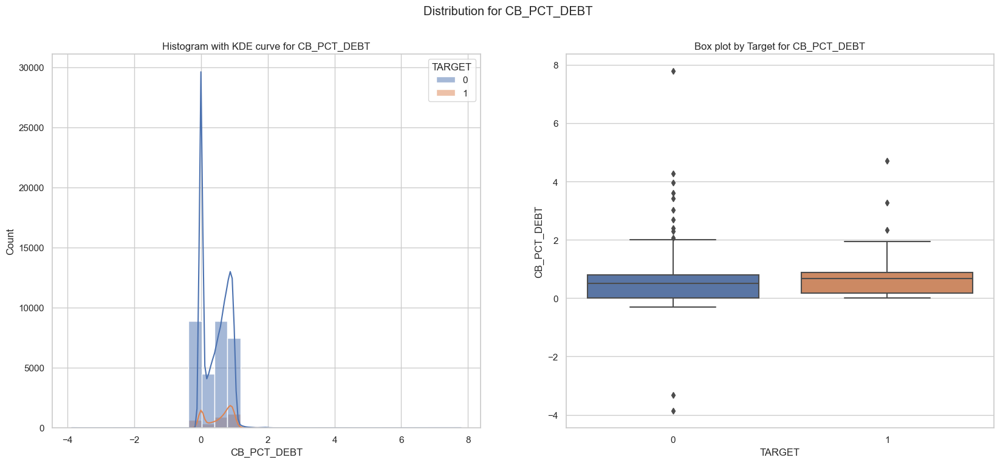

In [137]:
#Distribution for CB_PCT_DEBT
fig, axes = plt.subplots(1, 2, figsize = (20,8))
fig.suptitle('Distribution for CB_PCT_DEBT')

sns.histplot(ax=axes[0], data = application_df_cleaned, x = 'CB_PCT_DEBT', hue = 'TARGET', kde=True, bins=30)
axes[0].set_title('Histogram with KDE curve for CB_PCT_DEBT')

sns.boxplot(ax=axes[1], x = 'TARGET', y = 'CB_PCT_DEBT', data = application_df_cleaned)
axes[1].set_title('Box plot by Target for CB_PCT_DEBT')

Text(0.5, 1.0, 'Box plot by Target for CC_AVG_AMT_DRAWINGS')

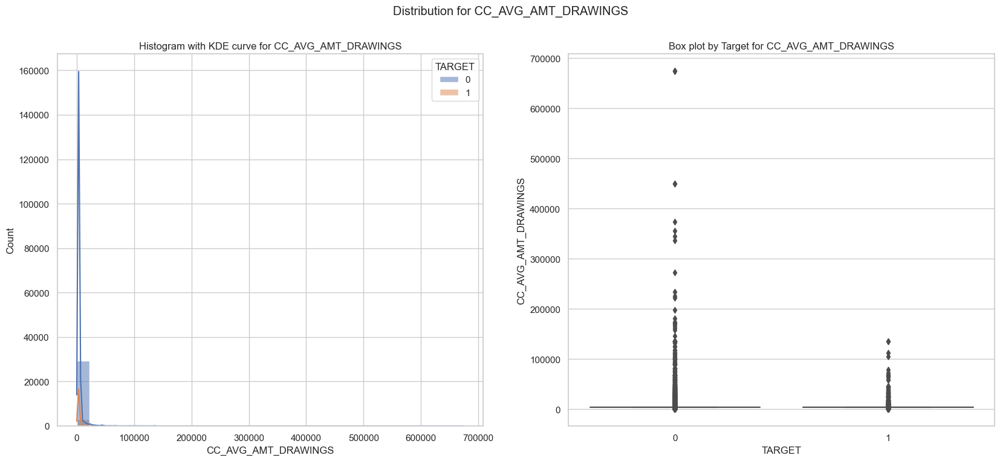

In [138]:
#Distribution for CC_AVG_AMT_DRAWINGS
fig, axes = plt.subplots(1, 2, figsize = (20,8))
fig.suptitle('Distribution for CC_AVG_AMT_DRAWINGS')

sns.histplot(ax=axes[0], data = application_df_cleaned, x = 'CC_AVG_AMT_DRAWINGS', hue = 'TARGET', kde=True, bins=30)
axes[0].set_title('Histogram with KDE curve for CC_AVG_AMT_DRAWINGS')

sns.boxplot(ax=axes[1], x = 'TARGET', y = 'CC_AVG_AMT_DRAWINGS', data = application_df_cleaned)
axes[1].set_title('Box plot by Target for CC_AVG_AMT_DRAWINGS')

Text(0.5, 1.0, 'Box plot by Target for AMT_ANNUITY')

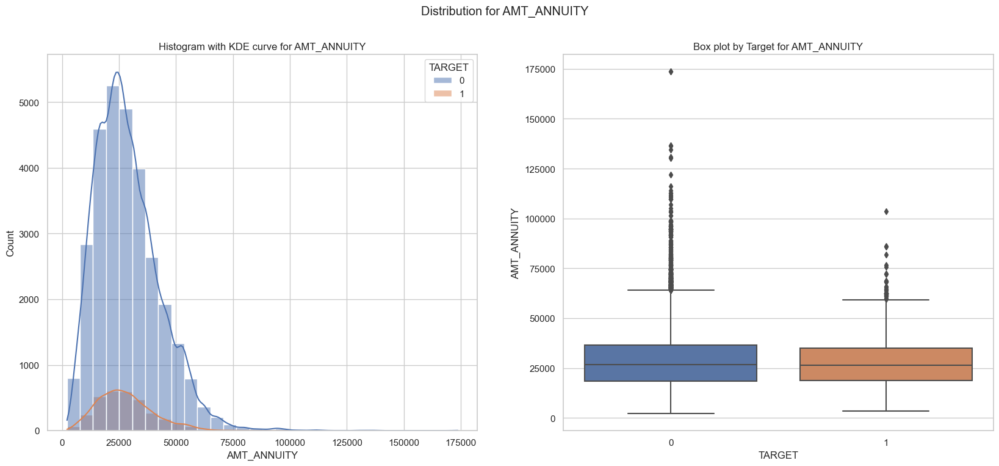

In [139]:
#Distribution for PREV_SUM_AMT_ANNUITY
fig, axes = plt.subplots(1, 2, figsize = (20,8))
fig.suptitle('Distribution for AMT_ANNUITY')

sns.histplot(ax=axes[0], data = application_df_cleaned, x = 'AMT_ANNUITY', hue = 'TARGET', kde=True, bins=30)
axes[0].set_title('Histogram with KDE curve for AMT_ANNUITY')

sns.boxplot(ax=axes[1], x = 'TARGET', y = 'AMT_ANNUITY', data = application_df_cleaned)
axes[1].set_title('Box plot by Target for AMT_ANNUITY')

Text(0.5, 1.0, 'Box plot by Target for INS_AVG_LESS_PAYMENT')

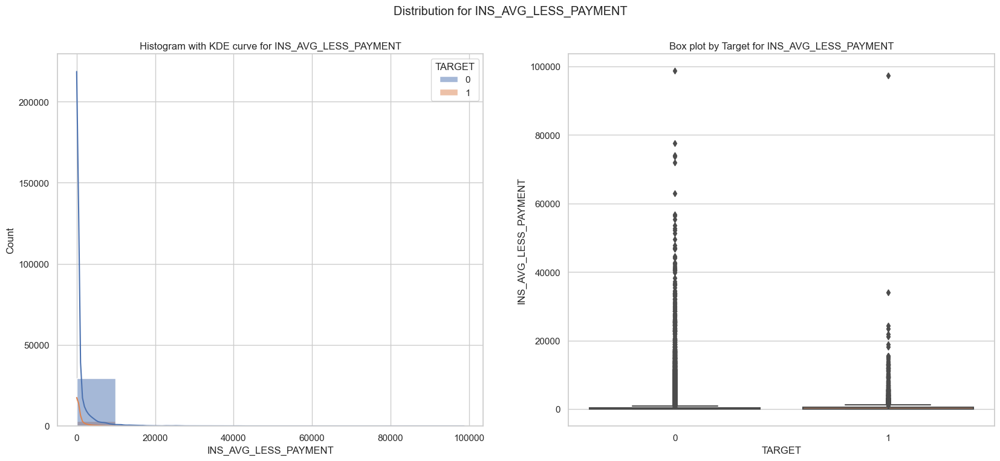

In [140]:
#Distribution for INS_AVG_LESS_PAYMENT
fig, axes = plt.subplots(1, 2, figsize = (20,8))
fig.suptitle('Distribution for INS_AVG_LESS_PAYMENT')

sns.histplot(ax=axes[0], data = application_df_cleaned, x = 'INS_AVG_LESS_PAYMENT', hue = 'TARGET', kde=True, bins=10)
axes[0].set_title('Histogram with KDE curve for INS_AVG_LESS_PAYMENT')

sns.boxplot(ax=axes[1], x = 'TARGET', y = 'INS_AVG_LESS_PAYMENT', data = application_df_cleaned)
axes[1].set_title('Box plot by Target for INS_AVG_LESS_PAYMENT')

Text(0.5, 1.0, 'Box plot by Target for POS_CNT_INSTALLMENTS_FUTURE')

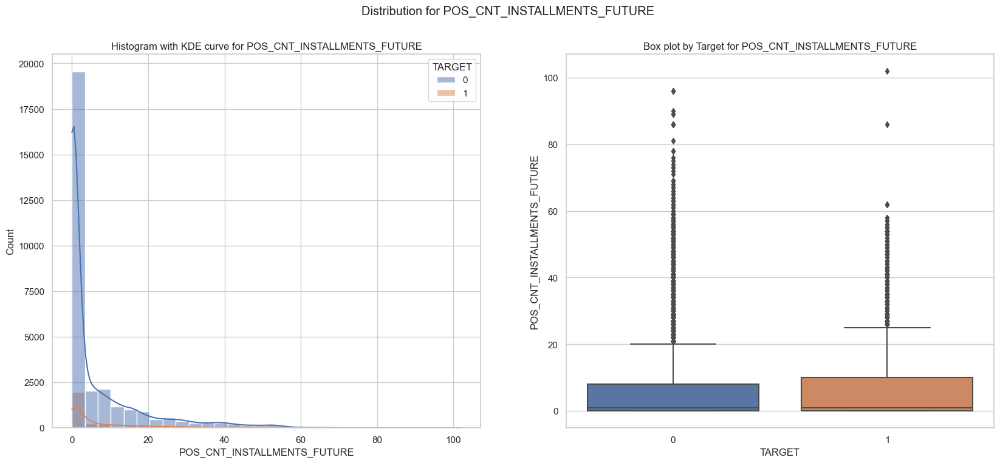

In [141]:
#Distribution for POS_CNT_INSTALLMENTS_FUTURE
fig, axes = plt.subplots(1, 2, figsize = (20,8))
fig.suptitle('Distribution for POS_CNT_INSTALLMENTS_FUTURE')

sns.histplot(ax=axes[0], data = application_df_cleaned, x = 'POS_CNT_INSTALLMENTS_FUTURE', hue = 'TARGET', kde=True, bins=30)
axes[0].set_title('Histogram with KDE curve for POS_CNT_INSTALLMENTS_FUTURE')

sns.boxplot(ax=axes[1], x = 'TARGET', y = 'POS_CNT_INSTALLMENTS_FUTURE', data = application_df_cleaned)
axes[1].set_title('Box plot by Target for POS_CNT_INSTALLMENTS_FUTURE')

Text(0.5, 1.0, 'Box plot by Target for DEBT_TO_INCOME_RATIO')

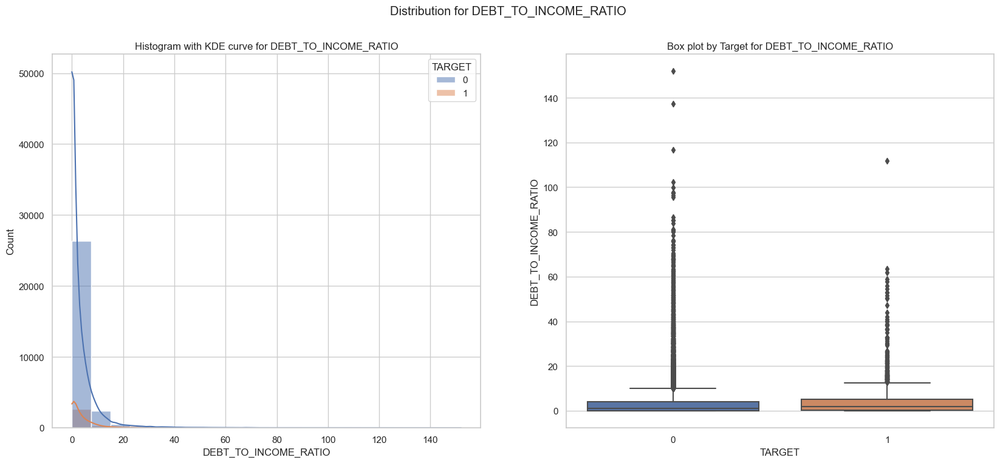

In [142]:
#Distribution for DEBT_TO_INCOME_RATIO
fig, axes = plt.subplots(1, 2, figsize = (20,8))
fig.suptitle('Distribution for DEBT_TO_INCOME_RATIO')

sns.histplot(ax=axes[0], data = application_df_cleaned, x = 'DEBT_TO_INCOME_RATIO', hue = 'TARGET', kde=True, bins=20)
axes[0].set_title('Histogram with KDE curve for DEBT_TO_INCOME_RATIO')

sns.boxplot(ax=axes[1], x = 'TARGET', y = 'DEBT_TO_INCOME_RATIO', data = application_df_cleaned)
axes[1].set_title('Box plot by Target for DEBT_TO_INCOME_RATIO')

Text(0.5, 1.0, 'Histogram with KDE curve for DEF_30_CNT_SOCIAL_CIRCLE')

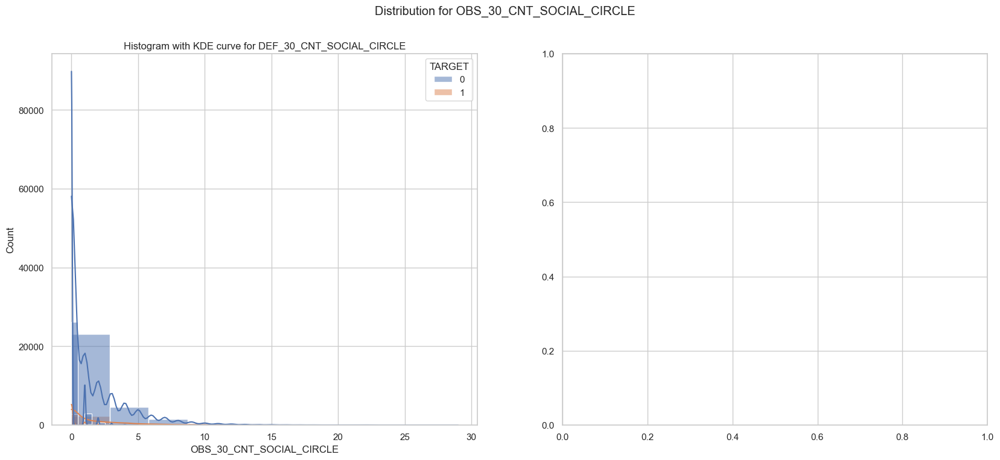

In [143]:
#Distribution for DEBT_TO_INCOME_RATIO
fig, axes = plt.subplots(1, 2, figsize = (20,8))
fig.suptitle('Distribution for OBS_30_CNT_SOCIAL_CIRCLE')

sns.histplot(ax=axes[0], data = application_df_cleaned, x = 'OBS_30_CNT_SOCIAL_CIRCLE', hue = 'TARGET', kde=True, bins=10)
axes[0].set_title('Histogram with KDE curve for OBS_30_CNT_SOCIAL_CIRCLE')

sns.histplot(ax=axes[0], data = application_df_cleaned, x = 'DEF_30_CNT_SOCIAL_CIRCLE', hue = 'TARGET', kde=True, bins=10)
axes[0].set_title('Histogram with KDE curve for DEF_30_CNT_SOCIAL_CIRCLE')

<AxesSubplot: xlabel='DEF_30_CNT_SOCIAL_CIRCLE', ylabel='Count'>

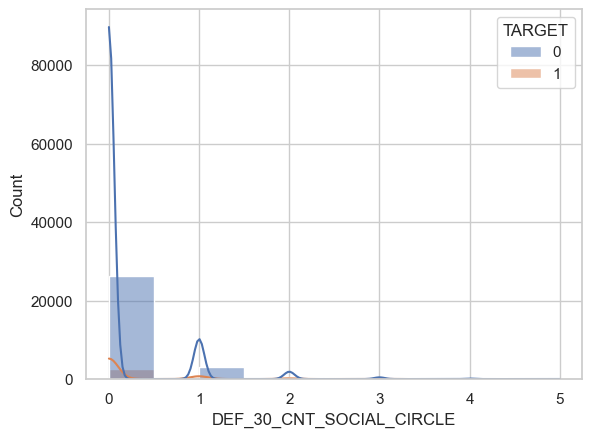

In [144]:
sns.histplot(data = application_df_cleaned, x = 'DEF_30_CNT_SOCIAL_CIRCLE', hue = 'TARGET', kde=True, bins=10)

> [**DATA_CLEANING**] Create Bins

In [145]:
application_df_cleaned2 = application_df_cleaned.copy()

In [146]:
application_df_cleaned2.groupby('CNT_FAM_MEMBERS')['TARGET'].count()

CNT_FAM_MEMBERS
1.0      6095
2.0     17803
3.0      5841
4.0      2830
5.0       400
6.0        46
7.0        13
9.0         1
14.0        1
15.0        1
20.0        1
Name: TARGET, dtype: int64

In [147]:
#creating bins for CNT_FAM_MEMBERS
application_df_cleaned2['CNT_FAM_MEMBERS'] = pd.cut(application_df_cleaned2['CNT_FAM_MEMBERS'],
                                                    bins=[-np.inf, 2, 4, np.inf], labels=["1-2", "3-4", "5+"])
application_df_cleaned2.groupby('CNT_FAM_MEMBERS')['TARGET'].count()

CNT_FAM_MEMBERS
1-2    23898
3-4     8671
5+       463
Name: TARGET, dtype: int64

In [148]:
#creating bins for OWN_CAR_AGE
application_df_cleaned2['OWN_CAR_AGE'] = pd.cut(application_df_cleaned2['OWN_CAR_AGE'], 
        bins=[-np.inf, 5, 10, 15, 20, 25, 30, np.inf], labels=["5 and under", "6-10", "11-15", "16-20", "21-25","26-30", "31+"])
application_df_cleaned2.groupby('OWN_CAR_AGE')['TARGET'].count()

OWN_CAR_AGE
5 and under    24684
6-10            3205
11-15           2448
16-20           1332
21-25            634
26-30            296
31+              433
Name: TARGET, dtype: int64

In [149]:
#creating bins for AMT_REQ_CREDIT_BUREAU_MON
application_df_cleaned2['AMT_REQ_CREDIT_BUREAU_MON'] = pd.cut(application_df_cleaned2['AMT_REQ_CREDIT_BUREAU_MON'], 
                                                        bins=[-np.inf,0, 2, np.inf], labels=["0","1-2", "3+"])
application_df_cleaned2.groupby('AMT_REQ_CREDIT_BUREAU_MON')['TARGET'].count()

AMT_REQ_CREDIT_BUREAU_MON
0      25705
1-2     6902
3+       425
Name: TARGET, dtype: int64

In [150]:
#creating bins for AMT_REQ_CREDIT_BUREAU_DAY
application_df_cleaned2['AMT_REQ_CREDIT_BUREAU_DAY'] = pd.cut(application_df_cleaned2['AMT_REQ_CREDIT_BUREAU_DAY'], 
                                                        bins=[-np.inf,0, 2, np.inf], labels=["0","1-2", "3+"])
application_df_cleaned2.groupby('AMT_REQ_CREDIT_BUREAU_DAY')['TARGET'].count()

AMT_REQ_CREDIT_BUREAU_DAY
0      32801
1-2      216
3+        15
Name: TARGET, dtype: int64

In [151]:
#creating bins for CB_SEC_LOAN
application_df_cleaned2['CB_SEC_LOAN'] = pd.cut(application_df_cleaned2['CB_SEC_LOAN'], 
                                                bins=[-np.inf,0, 2, np.inf], labels=["0","1-2", "3+"])
application_df_cleaned2.groupby('CB_SEC_LOAN')['TARGET'].count()

CB_SEC_LOAN
0      29150
1-2     3741
3+       141
Name: TARGET, dtype: int64

In [152]:
#creating bins for CB_UNSEC_LOAN
application_df_cleaned2['CB_UNSEC_LOAN'] = pd.cut(application_df_cleaned2['CB_UNSEC_LOAN'], 
            bins=[-np.inf, 5, 10, 15, 20, 25, 30, np.inf], labels=["0-5", "6-10", "11-15", "16-20", "21-25","26-30", "31+"])
application_df_cleaned2.groupby('CB_UNSEC_LOAN')['TARGET'].count()

CB_UNSEC_LOAN
0-5      19830
6-10      9243
11-15     2776
16-20      862
21-25      219
26-30       64
31+         38
Name: TARGET, dtype: int64

In [153]:
#creating bins for CB_TOTAL_CNT_CREDIT_PROLONG
application_df_cleaned2['CB_TOTAL_CNT_CREDIT_PROLONG'] = pd.cut(application_df_cleaned2['CB_TOTAL_CNT_CREDIT_PROLONG'], bins=[-np.inf,0, 2, np.inf], labels=["0","1-2", "3+"])
application_df_cleaned2.groupby('CB_TOTAL_CNT_CREDIT_PROLONG')['TARGET'].count()

CB_TOTAL_CNT_CREDIT_PROLONG
0      31890
1-2     1085
3+        57
Name: TARGET, dtype: int64

In [154]:
#creating bins for CB_AMT_CREDIT_SUM_OVERDUE
application_df_cleaned2['CB_AMT_CREDIT_SUM_OVERDUE'] = pd.cut(application_df_cleaned2['CB_AMT_CREDIT_SUM_OVERDUE'], 
bins=[-np.inf,0,25000,50000,75000, 100000,np.inf], labels=["no_overdue", "below 25k","26-50k","51-75k","76-100k", "100+"])
application_df_cleaned2.groupby('CB_AMT_CREDIT_SUM_OVERDUE')['TARGET'].count()

CB_AMT_CREDIT_SUM_OVERDUE
no_overdue    32690
below 25k       322
26-50k            9
51-75k            6
76-100k           3
100+              2
Name: TARGET, dtype: int64

In [155]:
#creating bins for INS_AVG_LATE_PAYMENT
application_df_cleaned2['INS_AVG_LATE_PAYMENT'] = pd.cut(application_df_cleaned2['INS_AVG_LATE_PAYMENT'], 
                bins=[-np.inf,0,10,20,30,np.inf], labels=["zero","1-10days","11-20days","21-30days", "31+days"])
application_df_cleaned2.groupby('INS_AVG_LATE_PAYMENT')['TARGET'].count()
#application_df_final2[application_df_final2['INS_AVG_LATE_PAYMENT'] > 30]['INS_AVG_LATE_PAYMENT'].nunique()

INS_AVG_LATE_PAYMENT
zero          9824
1-10days     21297
11-20days     1331
21-30days      384
31+days        196
Name: TARGET, dtype: int64

In [156]:
#Creating bins for POS_CNT_INSTALLMENTS_FUTURE
application_df_cleaned2['POS_CNT_INSTALLMENTS_FUTURE'] = pd.cut(application_df_cleaned2['POS_CNT_INSTALLMENTS_FUTURE'], 
bins=[-np.inf,0,15,30,45,60,75,np.inf], labels=["none","1-15","16-30","31-45", "46-60", "61-75", "76+"])
application_df_cleaned2.groupby('POS_CNT_INSTALLMENTS_FUTURE')['TARGET'].count()
#application_df_final2.groupby('POS_CNT_INSTALLMENTS_FUTURE')['TARGET'].count()

POS_CNT_INSTALLMENTS_FUTURE
none     14099
1-15     14039
16-30     3018
31-45     1289
46-60      537
61-75       36
76+         14
Name: TARGET, dtype: int64

In [157]:
#Creating bins for CB_MONTHS_1_AVG
application_df_cleaned2['CB_MONTHS_1_AVG'] = pd.cut(application_df_cleaned2['CB_MONTHS_1_AVG'], 
bins=[-np.inf,0,10,20,np.inf], labels=["none","below10x","11-20x","21xandup"])
application_df_cleaned2.groupby('CB_MONTHS_1_AVG')['TARGET'].count()
#application_df_final2[application_df_final2['CB_MONTHS_1_AVG'] > 30]['TARGET'].count()
#application_df_final2['CB_MONTHS_1_AVG'].describe()

CB_MONTHS_1_AVG
none        20514
below10x    12468
11-20x         44
21xandup        6
Name: TARGET, dtype: int64

In [158]:
#Creating bins for CB_MONTHS_2_AVG
application_df_cleaned2['CB_MONTHS_2_AVG'] = application_df_cleaned2['CB_MONTHS_2_AVG'].astype(int)
application_df_cleaned2['CB_MONTHS_2_AVG'] = pd.cut(application_df_cleaned2['CB_MONTHS_2_AVG'], 
                                            bins=[-np.inf,0,1,2,np.inf], labels=["none","1x","2x","3xandup"])
application_df_cleaned2.groupby('CB_MONTHS_2_AVG')['TARGET'].count()

CB_MONTHS_2_AVG
none       32577
1x           342
2x            80
3xandup       33
Name: TARGET, dtype: int64

In [159]:
#Creating bins for CB_MONTHS_4_AVG
application_df_cleaned2['CB_MONTHS_4_AVG'] = application_df_cleaned2['CB_MONTHS_4_AVG'].astype(int)
application_df_cleaned2['CB_MONTHS_4_AVG'] = pd.cut(application_df_cleaned2['CB_MONTHS_4_AVG'], 
                                        bins=[-np.inf,0,1,np.inf], labels=["none","1x","2xandup"])
application_df_cleaned2.groupby('CB_MONTHS_4_AVG')['TARGET'].count()

CB_MONTHS_4_AVG
none       32914
1x            99
2xandup       19
Name: TARGET, dtype: int64

In [160]:
#Change to integer
application_df_cleaned2['AMT_CREDIT_TO_ANNUITY'] = application_df_cleaned2['AMT_CREDIT_TO_ANNUITY'].astype(int)
application_df_cleaned2['AMT_CREDIT_TO_ANNUITY'].unique()

array([18, 34, 10, 16, 12, 20, 13, 15, 14, 23, 17, 30, 11, 36, 27,  9, 22,
       25, 19,  8, 28, 26, 21, 24, 33, 37, 32, 31, 29, 35])

In [161]:
#Create bins for CB_AVG_DAYS_CREDIT_ENDDATE
application_df_cleaned2['CB_AVG_DAYS_CREDIT_ENDDATE'] = pd.cut(application_df_cleaned2['CB_AVG_DAYS_CREDIT_ENDDATE'], 
bins=[-np.inf,0,90,180,365,730,np.inf], labels=["zero","below3months","3-6months","7-12months","1-2yrs","2yrs+"])
application_df_cleaned2['CB_AVG_DAYS_CREDIT_ENDDATE'].unique()

['zero', '2yrs+', '1-2yrs', 'below3months', '3-6months', '7-12months']
Categories (6, object): ['zero' < 'below3months' < '3-6months' < '7-12months' < '1-2yrs' < '2yrs+']

In [162]:
#Set minimum value of DEBT_TO_INCOME_RATIO to 0
application_df_cleaned2.loc[application_df_cleaned2['DEBT_TO_INCOME_RATIO'] < 0, 'DEBT_TO_INCOME_RATIO'] = 0

In [163]:
#Create bins for DEBT_TO_INCOME_RATIO
#application_df_final2['DEBT_TO_INCOME_RATIO'] = application_df_final2['DEBT_TO_INCOME_RATIO'].astype(int)
application_df_cleaned2['DEBT_TO_INCOME_RATIO'] = pd.cut(application_df_cleaned2['DEBT_TO_INCOME_RATIO'], 
        bins=[-np.inf,0,20,40,60,80,np.inf], labels=["none","below20pct","21-40pct","41-60pct","61-80pct","81pct_andup"])
application_df_cleaned2.groupby('DEBT_TO_INCOME_RATIO')['TARGET'].count()

DEBT_TO_INCOME_RATIO
none            9332
below20pct     22884
21-40pct         604
41-60pct         144
61-80pct          48
81pct_andup       20
Name: TARGET, dtype: int64

In [164]:
#Create bins for DAYS_EMPLOYED - converted to years
application_df_cleaned2['YEARS_EMPLOYED'] = (application_df_cleaned['DAYS_EMPLOYED']/365).astype(int)
application_df_cleaned2['YEARS_EMPLOYED'] = pd.cut(application_df_cleaned2['YEARS_EMPLOYED'], 
                    bins=[-np.inf,5,10,15,30,np.inf], labels=["below_5","6-10","11-15","16-30", "31+"])
application_df_cleaned2 = application_df_cleaned2.drop(columns=['DAYS_EMPLOYED'])
application_df_cleaned2.groupby('YEARS_EMPLOYED')['TARGET'].count()

YEARS_EMPLOYED
below_5    21059
6-10        6958
11-15       2846
16-30       1957
31+          212
Name: TARGET, dtype: int64

> Treat outliers - CAP and FLOOR

In [165]:
#columns for cap and floor
CF_cols = ['AMT_INCOME_TOTAL','REGION_POPULATION_RELATIVE','OBS_30_CNT_SOCIAL_CIRCLE', 
            'DAYS_LAST_PHONE_CHANGE', 'CB_MONTHS_0_AVG', 'PREV_DEBT_TO_CREDIT_RATIO']

In [166]:
#Creating new columns {CF_columnname} for columns to be cap / floor

for i in CF_cols:
    Q1, Q3 = application_df_cleaned2[i].quantile([0.25,0.75])
    UCL = Q3 + 1.5 * (Q3 - Q1)
    LCL = Q1 - 1.5 * (Q3 - Q1)
    print(f"UCL for {i} = ", round(UCL))
    print(f"LCL for {i} = ", round(LCL))
    
    application_df_cleaned2['CF_'+i] = application_df_cleaned2[i].map(
    lambda x: UCL if x > UCL else LCL if x < LCL else x)
    application_df_cleaned2 = application_df_cleaned2.drop(columns=i)

UCL for AMT_INCOME_TOTAL =  387000
LCL for AMT_INCOME_TOTAL =  -45000
UCL for REGION_POPULATION_RELATIVE =  0
LCL for REGION_POPULATION_RELATIVE =  0
UCL for OBS_30_CNT_SOCIAL_CIRCLE =  5
LCL for OBS_30_CNT_SOCIAL_CIRCLE =  -3
UCL for DAYS_LAST_PHONE_CHANGE =  3849
LCL for DAYS_LAST_PHONE_CHANGE =  -1679
UCL for CB_MONTHS_0_AVG =  22
LCL for CB_MONTHS_0_AVG =  -6
UCL for PREV_DEBT_TO_CREDIT_RATIO =  1
LCL for PREV_DEBT_TO_CREDIT_RATIO =  1


In [167]:
#Getting Upper Control Limit value for CB_PCT_DEBT
Q1, Q3 = application_df_cleaned2["CB_PCT_DEBT"].quantile([0.25,0.75])
UCL = Q3 + 1.5 * (Q3 - Q1)
LCL = 0
print(Q1, Q3)
print("UCL = ", round(UCL))
print("LCL = ", round(LCL))
application_df_cleaned2["CF_CB_PCT_DEBT"] = application_df_cleaned2["CB_PCT_DEBT"].map(
lambda x: UCL if x > UCL else LCL if x < LCL else x)
application_df_cleaned2 = application_df_cleaned2.drop(columns="CB_PCT_DEBT")

0.0 0.811888399299649
UCL =  2
LCL =  0


In [168]:
#Getting Upper Control Limit value for CB_AVG_DAYS_CREDIT_ENDDATE
#Q1, Q3 = application_df_final["CB_AVG_DAYS_CREDIT_ENDDATE"].quantile([0.25,0.75])
#UCL = Q3 + 1.5 * (Q3 - Q1)
#LCL = 0
#print(Q1, Q3)
#print("UCL = ", round(UCL))
#print("LCL = ", round(LCL))
#application_df_final2["CF_CB_AVG_DAYS_CREDIT_ENDDATE"] = application_df_final2["CB_AVG_DAYS_CREDIT_ENDDATE"].map(
#lambda x: UCL if x > UCL else LCL if x < LCL else x)
#application_df_final2 = application_df_final2.drop(columns="CB_AVG_DAYS_CREDIT_ENDDATE")

In [169]:
#Getting Upper Control Limit value for DEBT_TO_INCOME_RATIO
#Q1, Q3 = application_df_final["DEBT_TO_INCOME_RATIO"].quantile([0.25,0.75])
#UCL = Q3 + 1.5 * (Q3 - Q1)
#LCL = 0
#print(Q1, Q3)
#print("UCL = ", round(UCL))
#print("LCL = ", round(LCL))
#application_df_final2["CF_DEBT_TO_INCOME_RATIO"] = application_df_final2["DEBT_TO_INCOME_RATIO"].map(
#lambda x: UCL if x > UCL else LCL if x < LCL else x)
#application_df_final2 = application_df_final2.drop(columns="DEBT_TO_INCOME_RATIO")

> Skewness

In [170]:
skewness = application_df_cleaned2.skew(axis='index', numeric_only=True)
skewness

SK_ID_CURR                        -0.002585
AMT_ANNUITY                        1.041033
DAYS_ID_PUBLISH                   -0.339027
EXT_SOURCE_1                      -0.151135
EXT_SOURCE_2                      -0.767896
EXT_SOURCE_3                      -0.293790
APARTMENTS_MEDI                    4.035554
BASEMENTAREA_MEDI                  5.895772
YEARS_BUILD_MEDI                  -1.491321
LANDAREA_MEDI                      7.583555
DEF_30_CNT_SOCIAL_CIRCLE           3.599958
AMT_REQ_CREDIT_BUREAU_HOUR        12.632184
AMT_REQ_CREDIT_BUREAU_WEEK         6.450329
AMT_REQ_CREDIT_BUREAU_QRT          2.397481
AMT_REQ_CREDIT_BUREAU_YEAR         0.964296
CB_PCT_ACTIVE_LOANS                0.566452
CB_MIN_DAYS_CREDIT                -0.292124
CB_MONTHS_5_AVG                   23.269061
CNT_ACTIVE_LOANS                   2.194302
PREV_AVG_DPD_DAYS                 21.356570
PREV_SUM_AMT_CREDIT                2.062858
CC_PCT_CASH_DRAWINGS               3.237160
CC_AVG_AMT_DRAWINGS             

In [171]:
to_normalize = skewness.loc[lambda x : (x < -2) | (x > 2)]
to_normalize

APARTMENTS_MEDI                 4.035554
BASEMENTAREA_MEDI               5.895772
LANDAREA_MEDI                   7.583555
DEF_30_CNT_SOCIAL_CIRCLE        3.599958
AMT_REQ_CREDIT_BUREAU_HOUR     12.632184
AMT_REQ_CREDIT_BUREAU_WEEK      6.450329
AMT_REQ_CREDIT_BUREAU_QRT       2.397481
CB_MONTHS_5_AVG                23.269061
CNT_ACTIVE_LOANS                2.194302
PREV_AVG_DPD_DAYS              21.356570
PREV_SUM_AMT_CREDIT             2.062858
CC_PCT_CASH_DRAWINGS            3.237160
CC_AVG_AMT_DRAWINGS            26.259022
INS_AVG_LESS_PAYMENT            9.274179
M_EXT_SOURCE_2                128.508754
M_EXT_SOURCE_3                  3.688685
dtype: float64

In [172]:
for i in to_normalize.index:
    application_df_cleaned2[i] = np.log2(application_df_cleaned2[i])
# Replace infinity and negative infinity values with 0
    application_df_cleaned2[i] = np.where(np.isinf(application_df_cleaned2[i]), 0, application_df_cleaned2[i])


/Users/marianilagan/py_scripts/.venv/lib/python3.9/site-packages/pandas/core/arraylike.py:396: RuntimeWarning:

divide by zero encountered in log2



In [173]:
application_df_cleaned2.to_csv("Capstone_full_final_data_log.csv")

### Feature Selection

> Chi square

In [174]:
from scipy.stats import chi2_contingency

In [175]:
from scipy.stats import chi2_contingency
col_chi2 = application_df_cleaned2.select_dtypes(include=['object', 'category'])
col_chi2.columns

Index(['TARGET', 'CODE_GENDER', 'FLAG_OWN_CAR', 'NAME_INCOME_TYPE',
       'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE',
       'OWN_CAR_AGE', 'FLAG_EMP_PHONE', 'FLAG_WORK_PHONE', 'FLAG_PHONE',
       'OCCUPATION_TYPE', 'CNT_FAM_MEMBERS', 'REGION_RATING_CLIENT_W_CITY',
       'REG_CITY_NOT_LIVE_CITY', 'REG_CITY_NOT_WORK_CITY', 'FLAG_DOCUMENT_3',
       'AMT_REQ_CREDIT_BUREAU_DAY', 'AMT_REQ_CREDIT_BUREAU_MON', 'CB_SEC_LOAN',
       'CB_UNSEC_LOAN', 'CB_AVG_DAYS_CREDIT_ENDDATE',
       'CB_TOTAL_CNT_CREDIT_PROLONG', 'CB_AMT_CREDIT_SUM_OVERDUE',
       'CB_MONTHS_1_AVG', 'CB_MONTHS_2_AVG', 'CB_MONTHS_4_AVG',
       'POS_CNT_INSTALLMENTS_FUTURE', 'INS_AVG_LATE_PAYMENT',
       'DEBT_TO_INCOME_RATIO', 'YEARS_EMPLOYED'],
      dtype='object')

In [176]:
# Selecting categorical features and the target variable
from scipy.stats import chi2_contingency
col_chi2 = application_df_cleaned2.select_dtypes(include=['object', 'category'])
col_chi2.columns
categorical_features = col_chi2.columns
target_variable = 'TARGET'

# Calculate contingency tables and perform chi-square test
feature_statistics = []

for feature in categorical_features:
    contingency_table = pd.crosstab(application_df_cleaned2[feature], application_df_cleaned2[target_variable])
    chi2, p, _, _ = chi2_contingency(contingency_table)
    feature_statistics.append({'Feature': feature, 'Chi-Square': chi2, 'P-value': p})

# Create a DataFrame to display the results
results_df = pd.DataFrame(feature_statistics)
results_df = results_df.sort_values(by='P-value')

print("Feature Selection Results:")
print(results_df)

# Select features
selected_features = [i['Feature'] for i in feature_statistics if i['P-value'] < 0.05]

print("Total number of features:", len(categorical_features))
print("Selected Features:", selected_features)
print("Total number of selected:", len(selected_features))

#Removed features
removed_features = [i['Feature'] for i in feature_statistics if i['P-value'] > 0.05]
print("Removed Features:", removed_features)

Feature Selection Results:
                        Feature    Chi-Square       P-value
0                        TARGET  33020.451864  0.000000e+00
21   CB_AVG_DAYS_CREDIT_ENDDATE    158.424422  2.144488e-32
13  REGION_RATING_CLIENT_W_CITY    140.122895  3.738523e-31
15       REG_CITY_NOT_WORK_CITY     93.247077  4.615707e-22
29         DEBT_TO_INCOME_RATIO    108.277114  9.473785e-22
3              NAME_INCOME_TYPE     83.366171  6.817878e-20
8                FLAG_EMP_PHONE     83.366171  6.817878e-20
14       REG_CITY_NOT_LIVE_CITY     83.298582  7.055019e-20
1                   CODE_GENDER     75.845072  3.068172e-18
4           NAME_EDUCATION_TYPE     72.159737  2.141471e-16
30               YEARS_EMPLOYED     70.094005  2.168450e-14
11              OCCUPATION_TYPE     71.891229  1.672753e-13
28         INS_AVG_LATE_PAYMENT     60.820113  1.950513e-12
16              FLAG_DOCUMENT_3     49.252235  2.250768e-12
23    CB_AMT_CREDIT_SUM_OVERDUE     52.357208  4.557211e-10
19           

> Remove from final table

In [177]:
application_df_final2 = application_df_cleaned2.drop(columns=removed_features)
application_df_final2.shape

(33032, 62)

In [178]:
application_df_final2 = application_df_final2.drop(columns='SK_ID_CURR')
application_df_final2.shape

(33032, 61)

In [179]:
application_df_final2['TARGET'] = application_df_final2['TARGET'].astype('int')

In [180]:
application_df_final2.to_csv("Capstone_full_final_data_log2.csv")

In [181]:
application_df_final2[(application_df_final2['EXT_SOURCE_3'] > 0.65) | (application_df_final2['EXT_SOURCE_2'] > 0.65) | (application_df_final2['EXT_SOURCE_1'] > 0.65)]

,TARGET,CODE_GENDER,FLAG_OWN_CAR,AMT_ANNUITY,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,DAYS_ID_PUBLISH,OWN_CAR_AGE,...,DEBT_TO_INCOME_RATIO,AMT_CREDIT_TO_ANNUITY,YEARS_EMPLOYED,CF_AMT_INCOME_TOTAL,CF_REGION_POPULATION_RELATIVE,CF_OBS_30_CNT_SOCIAL_CIRCLE,CF_DAYS_LAST_PHONE_CHANGE,CF_CB_MONTHS_0_AVG,CF_PREV_DEBT_TO_CREDIT_RATIO,CF_CB_PCT_DEBT
1,0,F,Y,31180.5,Employed,Higher education,Married,House / apartment,1479,5 and under,...,below20pct,34,11-15,315000.0,0.019689,1.0,1669.0,5.555556,0.857352,0.004029
2,0,F,N,19584.0,Unemployed_Pensioner,Secondary,Widow_Separated,Co-op apartment,782,5 and under,...,below20pct,10,below_5,189000.0,0.056649,0.0,1613.0,2.857143,0.857352,0.831862
3,0,F,N,21006.0,Unemployed_Pensioner,Secondary,Married,House / apartment,4248,5 and under,...,below20pct,16,below_5,319500.0,0.006207,2.0,371.0,6.750000,0.857352,0.587625
8,0,F,N,14670.0,Employed,Secondary,Widow_Separated,House / apartment,4956,5 and under,...,none,15,below_5,90000.0,0.010966,3.0,718.0,8.000000,0.857352,0.000000
9,0,M,N,21037.5,Employed,Secondary,Single / not married,House / apartment,3249,5 and under,...,below20pct,14,6-10,90000.0,0.020713,0.0,708.0,12.000000,0.857352,0.827539
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
33022,0,F,N,56290.5,Employed,Secondary,Married,House / apartment,277,5 and under,...,none,23,6-10,225000.0,0.018634,1.0,2833.0,15.000000,0.857352,0.000000
33024,0,F,N,40027.5,Employed,Higher education,Married,House / apartment,443,5 and under,...,none,25,below_5,270000.0,0.025164,0.0,463.0,4.000000,0.857352,0.000000
33025,0,F,Y,46336.5,Employed,Higher education,Widow_Separated,House / apartment,2514,11-15,...,below20pct,11,below_5,387000.0,0.018801,0.0,1761.0,10.111111,0.857352,0.314382
33026,0,F,Y,39109.5,Employed,Secondary,Married,House / apartment,5135,6-10,...,none,23,below_5,135000.0,0.005084,0.0,1319.0,8.857143,0.857352,0.000000


# PCA

In [ ]:
#One hot encoding
final_data = pd.get_dummies(application_df_final2, drop_first=False)

bool_columns=[x for x in final_data.columns if final_data[x].dtype == 'bool']
for i in bool_columns:
    final_data[i] = final_data[i].astype(int)

In [ ]:
final_data.shape

(33032, 131)

In [ ]:
X = final_data.drop(columns='TARGET')
y = final_data['TARGET']

In [ ]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

# Load and preprocess dataset
# X: Features matrix (as a DataFrame)

# Standardize the data
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Calculate covariance matrix
cov_matrix = np.cov(X_scaled, rowvar=False)

# Compute eigenvectors and eigenvalues
eigenvalues, eigenvectors = np.linalg.eig(cov_matrix)

# Sort eigenvectors by eigenvalues
eigen_pairs = [(np.abs(eigenvalues[i]), eigenvectors[:, i]) for i in range(len(eigenvalues))]
eigen_pairs.sort(reverse=True, key=lambda x: x[0])

# Calculate cumulative explained variance
total_variance = sum(eigenvalues)
explained_variance_ratio = eigenvalues / total_variance
cumulative_variance_ratio = np.cumsum(explained_variance_ratio)

# Determine the number of features for 95% explained variance
num_features_for_95_variance = np.argmax(cumulative_variance_ratio >= 0.90) + 1

# Select top features based on the calculated number
selected_indices = [pair[1] for pair in eigen_pairs[:num_features_for_95_variance]]
selected_feature_indices = [np.argmax(np.abs(eigenvalues[i] * eigenvector)) for i, eigenvector in enumerate(selected_indices)]
selected_feature_names = X.columns[selected_feature_indices]

print("Selected Feature Names for 95% Explained Variance:", selected_feature_names)

Selected Feature Names for 95% Explained Variance: Index(['NAME_INCOME_TYPE_Employed', 'DEBT_TO_INCOME_RATIO_none',
       'FLAG_OWN_CAR_N', 'REG_CITY_NOT_LIVE_CITY_0',
       'INS_AVG_LATE_PAYMENT_zero', 'REG_CITY_NOT_LIVE_CITY_0',
       'FLAG_WORK_PHONE_0', 'CB_SEC_LOAN_0', 'CNT_FAM_MEMBERS_1-2',
       'CB_MONTHS_1_AVG_none', 'CB_TOTAL_CNT_CREDIT_PROLONG_0',
       'NAME_EDUCATION_TYPE_Secondary', 'CB_AMT_CREDIT_SUM_OVERDUE_no_overdue',
       'CB_TOTAL_CNT_CREDIT_PROLONG_0', 'NAME_HOUSING_TYPE_House / apartment',
       'REGION_RATING_CLIENT_W_CITY_3', 'PREV_AVG_DPD_DAYS',
       'REGION_RATING_CLIENT_W_CITY_3', 'POS_CNT_INSTALLMENTS_FUTURE_1-15',
       'FLAG_DOCUMENT_3_0', 'APARTMENTS_MEDI', 'NAME_FAMILY_STATUS_Married',
       'CB_AVG_DAYS_CREDIT_ENDDATE_1-2yrs', 'CB_AVG_DAYS_CREDIT_ENDDATE_2yrs+',
       'YEARS_EMPLOYED_6-10', 'OCCUPATION_TYPE_9_Elementary_Occupation',
       'CF_OBS_30_CNT_SOCIAL_CIRCLE', 'DEF_30_CNT_SOCIAL_CIRCLE',
       'NAME_FAMILY_STATUS_Widow_Separated'

In [ ]:
len(selected_feature_names)

90

>Creating new file for selected features via PCA

In [ ]:
selected_feature_names = list(selected_feature_names) + ['TARGET']

In [ ]:
unique_values = set(selected_feature_names)
PCA_variables = list(unique_values)
print(len(unique_values))

In [ ]:
unique_values

{'AMT_REQ_CREDIT_BUREAU_HOUR',
 'AMT_REQ_CREDIT_BUREAU_WEEK',
 'APARTMENTS_MEDI',
 'CB_AMT_CREDIT_SUM_OVERDUE_100+',
 'CB_AMT_CREDIT_SUM_OVERDUE_26-50k',
 'CB_AMT_CREDIT_SUM_OVERDUE_51-75k',
 'CB_AMT_CREDIT_SUM_OVERDUE_76-100k',
 'CB_AMT_CREDIT_SUM_OVERDUE_no_overdue',
 'CB_AVG_DAYS_CREDIT_ENDDATE_1-2yrs',
 'CB_AVG_DAYS_CREDIT_ENDDATE_2yrs+',
 'CB_AVG_DAYS_CREDIT_ENDDATE_3-6months',
 'CB_AVG_DAYS_CREDIT_ENDDATE_7-12months',
 'CB_AVG_DAYS_CREDIT_ENDDATE_below3months',
 'CB_MONTHS_1_AVG_21xandup',
 'CB_MONTHS_1_AVG_none',
 'CB_MONTHS_5_AVG',
 'CB_SEC_LOAN_0',
 'CB_SEC_LOAN_3+',
 'CB_TOTAL_CNT_CREDIT_PROLONG_0',
 'CB_TOTAL_CNT_CREDIT_PROLONG_3+',
 'CC_AVG_AMT_DRAWINGS',
 'CC_PCT_CASH_DRAWINGS',
 'CF_CB_MONTHS_0_AVG',
 'CF_OBS_30_CNT_SOCIAL_CIRCLE',
 'CNT_ACTIVE_LOANS',
 'CNT_FAM_MEMBERS_1-2',
 'DAYS_ID_PUBLISH',
 'DEBT_TO_INCOME_RATIO_21-40pct',
 'DEBT_TO_INCOME_RATIO_41-60pct',
 'DEBT_TO_INCOME_RATIO_61-80pct',
 'DEBT_TO_INCOME_RATIO_81pct_andup',
 'DEBT_TO_INCOME_RATIO_none',
 'DEF_30_C

In [ ]:
len(list(unique_values))

72

In [ ]:
Capstone_PCA_variables = final_data[PCA_variables]
Capstone_PCA_variables.to_csv("Capstone_PCA_variables_v4.csv")